# Импорты

In [4]:
# !pip install plotly nbformat
# !pip install pandas matplotlib seaborn
# !pip install pandas matplotlib seaborn sentence-transformers
# # !pip install tf-keras
# !pip install lifelines
# !pip install xgboost
# !pip install torch==2.0.1 --index-url https://download.pytorch.org/whl/cpu
# !pip install sentence-transformers==2.2.2
# !pip install transformers==4.35.0

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import ast
import json

from datetime import datetime
import plotly.express as px
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, r2_score, mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test
from scipy.stats import chi2_contingency, pearsonr, spearmanr
from transformers import AutoTokenizer, AutoModel
import torch


warnings.filterwarnings('ignore')
sns.set_style("whitegrid")
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['figure.dpi'] = 100

C:\Users\Ирина\AppData\Local\Programs\Python\Python39\lib\site-packages\transformers\utils\generic.py:441: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  _torch_pytree._register_pytree_node(


In [2]:
import time

# Загрузка данных

In [5]:
start_time = time.time()
df = pd.read_csv("repositories_2026_05_03_20_00.csv")

df["license_spdx_id"] = df["license_spdx_id"].fillna("")
df["readme"] = df["readme"].fillna("")
df["owner_location"] = df["owner_location"].fillna("")

def parse_json_field(x):
    if pd.isna(x) or x is None:
        return {}
    if isinstance(x, dict):
        return x
    if isinstance(x, str):
        x = x.strip()
        if not x or x == '[]' or x == '{}':
            return {}
        try:
            return json.loads(x)
        except:
            try:
                return ast.literal_eval(x)
            except:
                return {}
    return {}


df["topics"] = df["topics"].apply(parse_json_field)
df["languages_map"] = df["languages_map"].apply(parse_json_field)
df["pull_request_stats"] = df["pull_request_stats"].apply(parse_json_field)
df["issue_stats"] = df["issue_stats"].apply(parse_json_field)
df["commit_stats"] = df["commit_stats"].apply(parse_json_field)
df["recent_commits"] = df["recent_commits"].apply(parse_json_field)
df["root_contents"] = df["root_contents"].apply(parse_json_field)
df["recent_pull_requests"] = df["recent_pull_requests"].apply(parse_json_field)
df["recent_issues"] = df["recent_issues"].apply(parse_json_field)


df["created_at"] = pd.to_datetime(df["created_at"])
df["pushed_at"] = pd.to_datetime(df["pushed_at"])


lang_df = pd.json_normalize(df["languages_map"]).fillna(0)
lang_df = lang_df.add_prefix("lang_")
df = pd.concat([df.drop(columns=["languages_map"]), lang_df], axis=1)


lang_cols = df.filter(like="lang_").columns
if len(lang_cols) > 0:
    popular_counts = (df[lang_cols] > 0).sum().sort_values(ascending=False)
    top_langs = popular_counts.head(10).index
    df = pd.concat([df.drop(columns=lang_cols), df[top_langs]], axis=1)
else:
    top_langs = []


def get_primary_language(row):
    if len(top_langs) == 0:
        return "Unknown"
    best_lang = "Unknown"
    best_value = 0
    for col in top_langs:
        value = row[col]
        if pd.notna(value) and value > best_value:
            best_value = value
            best_lang = col.replace('lang_', '')
    return best_lang

df["primary_language"] = df.apply(get_primary_language, axis=1)
df["open_pr_count"] = df["pull_request_stats"].apply(lambda x: x.get("open_count", 0) if isinstance(x, dict) else 0)
df["closed_pr_count"] = df["pull_request_stats"].apply(lambda x: x.get("closed_count", 0) if isinstance(x, dict) else 0)
df["open_issues_count"] = df["issue_stats"].apply(lambda x: x.get("open_count", 0) if isinstance(x, dict) else 0)
df["closed_issues_count"] = df["issue_stats"].apply(lambda x: x.get("closed_count", 0) if isinstance(x, dict) else 0)
df["total_commits"] = df["commit_stats"].apply(lambda x: x.get("total_count", 0) if isinstance(x, dict) else 0)
df["recent_commits_count"] = df["recent_commits"].apply(lambda x: len(x) if isinstance(x, list) else 0)
df["recent_pr_count"] = df["recent_pull_requests"].apply(lambda x: len(x) if isinstance(x, list) else 0)
df["recent_issues_count"] = df["recent_issues"].apply(lambda x: len(x) if isinstance(x, list) else 0)
df["topics_count"] = df["topics"].apply(lambda x: len(x) if isinstance(x, list) else 0)
df["description_length"] = df["description"].fillna("").str.len()
df["owner_type"] = df["owner_type"].fillna("Unknown")
df["size_mb"] = df["size"] / 1024  

if "has_github_actions" in df.columns:
    df["has_github_actions"] = pd.to_numeric(df["has_github_actions"], errors='coerce').fillna(0).astype(int)
else:
    df["has_github_actions"] = 0


df["readme_length"] = df["readme"].str.len()
df["readme_has_code"] = df["readme"].str.contains("```", na=False).astype(int)
df["total_pr_count"] = df["open_pr_count"] + df["closed_pr_count"]
df["created_month"] = df["created_at"].dt.to_period("M").astype(str)
df["pushed_month"] = df["pushed_at"].dt.to_period("M").astype(str)
df["popularity"] = np.log1p(df["stargazers_count"])
df["repo_age_days"] = (pd.Timestamp.now() - df["created_at"]).dt.days

end_time = time.time()
print("На загрузку ушло ", start_time - end_time)
print(f"Данные загружены: {len(df)} строк, {len(df.columns)} колонок")

На загрузку ушло  -887.6309456825256
Данные загружены: 59029 строк, 54 колонок


## Эмбеддинги

In [12]:
from sentence_transformers import SentenceTransformer

model_name = "paraphrase-multilingual-MiniLM-L12-v2"
model = SentenceTransformer(model_name)
model.eval()

print(f"Модель загружена: {model_name}")
start_time = time.time()

def to_embedding(text):
    if not text or pd.isna(text):
        return None
    return model.encode(str(text), normalize_embeddings=True).tolist()

def topics_to_embedding(topics):
    if not topics:
        return None
    if isinstance(topics, list):
        text = " ".join(topics)
    else:
        text = str(topics)
    return to_embedding(text)

print("\nГенерация эмбеддингов README")
df["readme_embedding"] = df["readme"].fillna("").apply(to_embedding)

print("Генерация эмбеддингов тем")
df["topics_embedding"] = df["topics"].apply(topics_to_embedding)
end_time = time.time()
print(f"\nРезультат:")
print("На генерацию эмбеддингов ушло ", end_time - start_time)
print(f"  Эмбеддингов README: {df['readme_embedding'].notna().sum()}")
print(f"  Эмбеддингов тем: {df['topics_embedding'].notna().sum()}")

Модель загружена: paraphrase-multilingual-MiniLM-L12-v2

Генерация эмбеддингов README
Генерация эмбеддингов тем

Результат:
На генерацию эмбеддингов ушло  7346.249911785126
  Эмбеддингов README: 58832
  Эмбеддингов тем: 38835


## Усреднение эмбеддингов

In [13]:
def get_combined_embedding(row):
    readme_emb = row['readme_embedding']
    topics_emb = row['topics_embedding']
    
    if readme_emb is None and topics_emb is None:
        return None
    elif readme_emb is None:
        return topics_emb
    elif topics_emb is None:
        return readme_emb
    else:
        return [ (r + t) / 2 for r, t in zip(readme_emb, topics_emb) ]
start = time.time()
df_semantic = df.copy()
df_semantic['combined_embedding'] = df_semantic.apply(get_combined_embedding, axis=1)


df_semantic = df_semantic[df_semantic['combined_embedding'].notna()].copy()
print(f"  Репозиториев с эмбеддингами: {len(df_semantic)}")

print("\nПреобразование в матрицу...")
embedding_matrix = np.vstack(df_semantic['combined_embedding'].values)
print(f"  Форма матрицы: {embedding_matrix.shape}")
end = time.time()
print("На усреднение ушло ", end-start)

  Репозиториев с эмбеддингами: 58874

Преобразование в матрицу...
  Форма матрицы: (58874, 384)
На усреднение ушло  105.55891108512878


# Кластеризация по СМЫСЛОВЫМ признакам

## Выбор оптимального k для СМЫСЛОВЫХ кластеров

In [16]:
from sklearn.cluster import KMeans
print("\nПоиск оптимального k...")
from sklearn.metrics import silhouette_score
start = time.time()
k_range = range(2, 11)
silhouette_scores_semantic = []
inertias_semantic = []

for k in k_range:
    kmeans_temp = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels_temp = kmeans_temp.fit_predict(embedding_matrix)
    inertias_semantic.append(kmeans_temp.inertia_)
    silhouette_scores_semantic.append(silhouette_score(embedding_matrix, labels_temp))
    print(f"k={k}: Silhouette = {silhouette_scores_semantic[-1]:.3f}")

best_k_semantic = k_range[np.argmax(silhouette_scores_semantic)]
end = time.time()
print("На поиск оптимального k ушло ", end - start)
print(f"\nОптимальное k: {best_k_semantic}")


Поиск оптимального k...
k=2: Silhouette = 0.025
k=3: Silhouette = 0.024
k=4: Silhouette = 0.023
k=5: Silhouette = 0.019
k=6: Silhouette = 0.021
k=7: Silhouette = 0.022
k=8: Silhouette = 0.015
k=9: Silhouette = 0.016
k=10: Silhouette = 0.017
На поиск оптимального k ушло  778.9926464557648

Оптимальное k: 2


## Деление на СМЫСЛОВЫЕ кластеры

In [17]:
print(f"\nСоздаём {best_k_semantic} смысловых кластеров...")
start_time = time.time()
kmeans_final = KMeans(n_clusters=best_k_semantic, random_state=42, n_init=10)
df_semantic["cluster_semantic"] = kmeans_final.fit_predict(embedding_matrix)
end_time = time.time()
print(f"Время выполнения кластеризации: {end_time - start_time:.2f} секунд")
print(f"Распределение:\n{df_semantic['cluster_semantic'].value_counts()}")


Создаём 2 смысловых кластеров...
Время выполнения кластеризации: 10.41 секунд
Распределение:
cluster_semantic
0    37130
1    21744
Name: count, dtype: int64


## Статистика и графики по СМЫСЛОВЫМ кластерам

──────────────────────────────────────────────────
КЛАСТЕР 0 (всего репозиториев: 37130)
Топ-10 тем:
   1. python: 2523 раз(а)
   2. hacktoberfest: 1728 раз(а)
   3. javascript: 1330 раз(а)
   4. golang: 1043 раз(а)
   5. machine-learning: 975 раз(а)
   6. android: 930 раз(а)
   7. java: 910 раз(а)
   8. go: 893 раз(а)
   9. linux: 839 раз(а)
  10. deep-learning: 819 раз(а)
──────────────────────────────────────────────────
КЛАСТЕР 1 (всего репозиториев: 21744)
Топ-10 тем:
   1. javascript: 1324 раз(а)
   2. react: 1120 раз(а)
   3. android: 983 раз(а)
   4. hacktoberfest: 910 раз(а)
   5. typescript: 854 раз(а)
   6. python: 785 раз(а)
   7. ai: 604 раз(а)
   8. vue: 592 раз(а)
   9. ios: 572 раз(а)
  10. deep-learning: 563 раз(а)



──────────────────────────────────────────────────
 КЛАСТЕР 0 (всего репозиториев: 37130)

Топ-10 ключевых слов/фраз:
   1. org (встречается: 246942 раз)
   2. www (встречается: 215211 раз)
   3. io (встречается: 200601 раз)
   4. http (встречается: 18225

,stargazers_count,forks_count,subscribers_count,open_issues_count,closed_issues_count,open_pr_count,closed_pr_count,total_pr_count,contributors_count,total_commits,releases_count,readme_length,repo_age_days,topics_count,size_mb,size
cluster_semantic,,,,,,,,,,,,,,,,
0,4214.02,773.87,109.22,84.73,420.46,15.34,569.16,584.51,84.27,2569.01,38.09,12287.08,3160.14,4.67,110.25,37130
1,5029.19,699.44,86.35,90.59,455.51,14.13,494.31,508.44,67.33,1952.61,49.32,12571.77,2680.37,5.92,105.76,21744






──────────────────────────────────────────────────
СМЫСЛОВОЙ КЛАСТЕР 0 (37130 репозиториев)
   Среднее звёзд: 4214
   Медиана звёзд: 1997
   Среднее форков: 774
   Средний возраст: 3160 дней
   Основной язык: Unknown
   Средняя длина README: 12287 символов

──────────────────────────────────────────────────
СМЫСЛОВОЙ КЛАСТЕР 1 (21744 репозиториев)
   Среднее звёзд: 5029
   Медиана звёзд: 2170
   Среднее форков: 699
   Средний возраст: 2680 дней
   Основной язык: Python
   Средняя длина README: 12572 символов
На графики ушло  1161.9219172000885


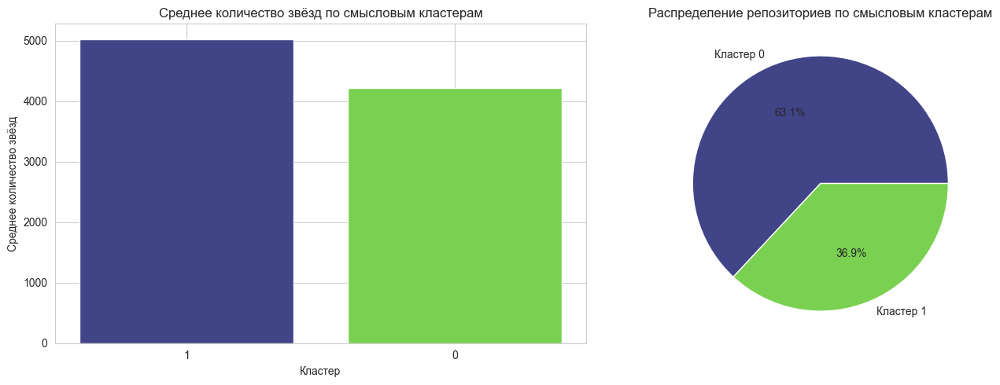

In [8]:
from collections import Counter
start = time.time()
cluster_topics_dict_semantic = {}

for cluster_id in sorted(df_semantic["cluster_semantic"].astype(int).unique()):
    cluster_data = df_semantic[df_semantic["cluster_semantic"].astype(int) == cluster_id]
    all_topics = []
    
    for topics in cluster_data["topics"]:
        if isinstance(topics, list):
            all_topics.extend(topics)
        elif isinstance(topics, str) and topics:
            try:
                topics_list = ast.literal_eval(topics)
                if isinstance(topics_list, list):
                    all_topics.extend(topics_list)
            except:
                pass
    
    cluster_topics_dict_semantic[cluster_id] = Counter(all_topics).most_common(10) if all_topics else []
    
    print(f"{'─'*50}")
    print(f"КЛАСТЕР {cluster_id} (всего репозиториев: {len(cluster_data)})")
    
    
    if cluster_topics_dict_semantic[cluster_id]:
        print("Топ-10 тем:")
        for i, (topic, count) in enumerate(cluster_topics_dict_semantic[cluster_id], 1):
            print(f"  {i:2d}. {topic}: {count} раз(а)")
    else:
        print("Нет тем для анализа")
print("\n\n") 
from sklearn.feature_extraction.text import CountVectorizer
import nltk
from nltk.corpus import stopwords


try:
    nltk.data.find('tokenizers/punkt')
except LookupError:
    nltk.download('punkt')
    nltk.download('stopwords')

stop_words = set(stopwords.words('russian') + stopwords.words('english'))
custom_stop = ['use', 'using', 'also', 'would', 'could', 'get', 'would', 'one', 'two', 'three', 
               'many', 'much', 'may', 'well', 'see', 'make', 'way', 'even', 'like', 'however', 
               'therefore', 'thus', 'hence', 'rather', 'quite', 'via', 'per', 'each', 'both', 
               'without', 'within', 'across', 'along', 'among', 'according', 'since', 'than',
               'using', 'provide', 'see', 'etc', 'i.e', 'e.g', 'fig', 'table', 'section']
stop_words.update(custom_stop)

for cluster_id in sorted(df_semantic["cluster_semantic"].astype(int).unique()):
    cluster_data = df_semantic[df_semantic["cluster_semantic"].astype(int) == cluster_id]
    print(f"{'─'*50}")
    print(f" КЛАСТЕР {cluster_id} (всего репозиториев: {len(cluster_data)})")
    
  

    cluster_readmes = cluster_data["readme"].fillna("").tolist()
    
    if len(cluster_readmes) > 0:
        vectorizer = CountVectorizer(
            max_features=30,
            stop_words=list(stop_words),
            min_df=2,
            max_df=0.8,
            ngram_range=(1, 2)
        )
        
        try:
            dtm = vectorizer.fit_transform(cluster_readmes)
            word_counts = dtm.sum(axis=0).A1
            words = vectorizer.get_feature_names_out()
            
            top_indices = word_counts.argsort()[-10:][::-1]
            
            print("\nТоп-10 ключевых слов/фраз:")
            for i, idx in enumerate(top_indices, 1):
                print(f"  {i:2d}. {words[idx]} (встречается: {word_counts[idx]} раз)")
        except Exception as e:
            print(f"Ошибка при анализе текста: {e}")
    else:
        print("Нет README для анализа")

print("\n\n")

metrics = [
    "stargazers_count", "forks_count", "subscribers_count",
    "open_issues_count", "closed_issues_count", 
    "open_pr_count", "closed_pr_count", "total_pr_count",
    "contributors_count", "total_commits", "releases_count",
    "readme_length", "repo_age_days", "topics_count", "size_mb"
]


available_metrics = [m for m in metrics if m in df_semantic.columns]

cluster_stats_semantic = df_semantic.groupby("cluster_semantic")[available_metrics].mean().round(2)
cluster_stats_semantic["size"] = df_semantic.groupby("cluster_semantic").size()

print("\nСредние значения метрик по смысловым кластерам:")
display(cluster_stats_semantic)

print("\n\n")

for cluster_id in sorted(df_semantic["cluster_semantic"].astype(int).unique()):
    cluster_data = df_semantic[df_semantic["cluster_semantic"].astype(int) == cluster_id]
    print(f"\n{'─'*50}")
    print(f"СМЫСЛОВОЙ КЛАСТЕР {cluster_id} ({len(cluster_data)} репозиториев)")
    print(f"   Среднее звёзд: {cluster_data['stargazers_count'].mean():.0f}")
    print(f"   Медиана звёзд: {cluster_data['stargazers_count'].median():.0f}")
    print(f"   Среднее форков: {cluster_data['forks_count'].mean():.0f}")
    print(f"   Средний возраст: {cluster_data['repo_age_days'].mean():.0f} дней")
    print(f"   Основной язык: {cluster_data['primary_language'].mode().iloc[0] if len(cluster_data['primary_language'].mode()) > 0 else 'N/A'}")
    print(f"   Средняя длина README: {cluster_data['readme_length'].mean():.0f} символов")


fig, axes = plt.subplots(1, 2, figsize=(14, 5))


ax1 = axes[0]
stars_by_cluster = df_semantic.groupby("cluster_semantic")["stargazers_count"].mean().sort_values(ascending=False)
colors = plt.cm.viridis(np.linspace(0.2, 0.8, len(stars_by_cluster)))
ax1.bar(stars_by_cluster.index.astype(str), stars_by_cluster.values, color=colors)
ax1.set_title("Среднее количество звёзд по смысловым кластерам")
ax1.set_xlabel("Кластер")
ax1.set_ylabel("Среднее количество звёзд")
ax1.tick_params(axis='x', rotation=0)


ax2 = axes[1]
sizes = df_semantic.groupby("cluster_semantic").size()
ax2.pie(sizes.values, labels=[f"Кластер {c}" for c in sizes.index], autopct='%1.1f%%', colors=colors)
ax2.set_title("Распределение репозиториев по смысловым кластерам")
end = time.time()
print("На графики ушло ", end-start)
plt.tight_layout()
    # plt.savefig("semantic_clusters_stats.png", dpi=150, bbox_inches="tight")
plt.show()

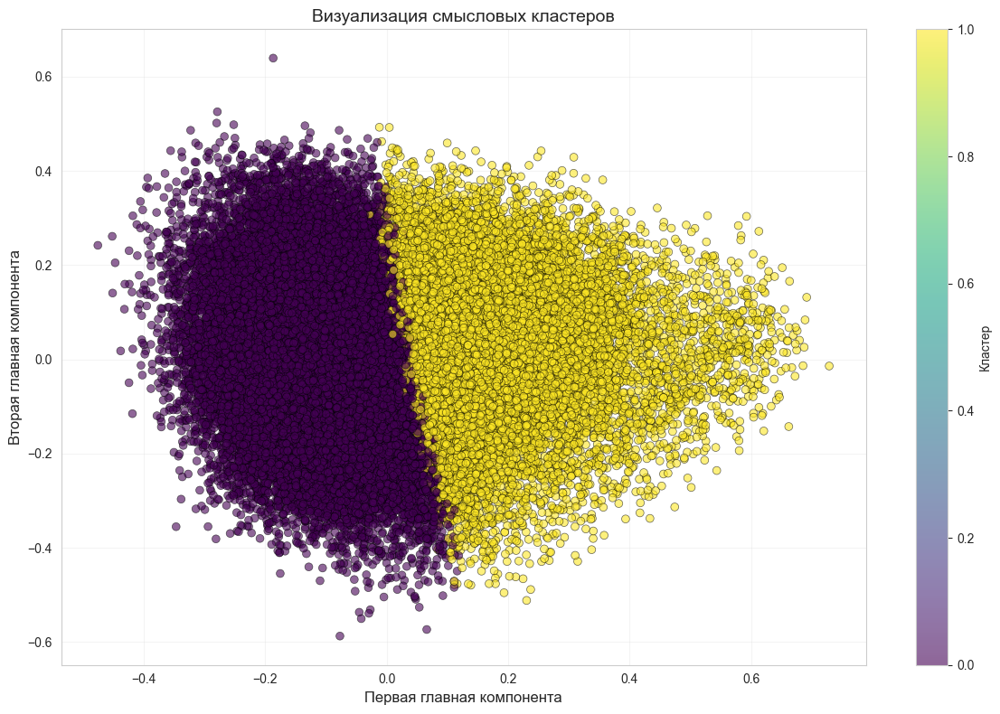

На этот график ушло  6.970107793807983
Объясненная дисперсия: PC1 = 4.97%, PC2 = 3.90%


In [10]:
from sklearn.decomposition import PCA
start = time.time()
# Для смысловых эмбеддингов (embedding_matrix из ячейки 5)
pca = PCA(n_components=2)
embeddings_2d = pca.fit_transform(embedding_matrix)

plt.figure(figsize=(12, 8))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], 
                      c=df_semantic['cluster_semantic'], 
                      cmap='viridis', alpha=0.6, s=40, edgecolors='k', linewidth=0.5)
plt.colorbar(scatter, label='Кластер')
plt.title('Визуализация смысловых кластеров', fontsize=16)
plt.xlabel('Первая главная компонента', fontsize=16)
plt.ylabel('Вторая главная компонента', fontsize=16)
plt.grid(True, alpha=0.2)
plt.tight_layout()
plt.savefig('pca_clusters.png', dpi=150)
plt.show()
end = time.time()
print("На этот график ушло ", end - start)
# Дополнительно: объясненная дисперсия
print(f"Объясненная дисперсия: PC1 = {pca.explained_variance_ratio_[0]:.2%}, PC2 = {pca.explained_variance_ratio_[1]:.2%}")

# ВАЖНО ЗАПУСТИ ПОСЛЕ ЭМБЕДДИНГОВ

ЗАДАЧА 4. КЛАСТЕРИЗАЦИЯ РЕПОЗИТОРИЕВ

1. ПРОВЕРКА СТАТИСТИЧЕСКОЙ ЗНАЧИМОСТИ
------------------------------------------------------------
Метрика              Статистика   p-value      Значимо
------------------------------------------------------------
Звёзды (log)         -14.532      9.1398e-48
Форки (log)          12.074       1.5819e-33
Pull Requests        407700149    4.3233e-02
Возраст (дни)        39.516       0.0000e+00

2. СРАВНЕНИЕ КЛАСТЕРОВ
------------------------------------------------------------
Метрика                   Кластер 0       Кластер 1       Разница   
-----------------------------------------------------------------
Звёзды (среднее)          4214            5029            -16.2%
Форки (среднее)           774             699             +10.6%
Pull Requests (ср.)       585             508             +15.0%
Возраст (дни)             3162            2682            +17.9%

3. ПОСТРОЕНИЕ ГРАФИКОВ
------------------------------------------------------------
(P

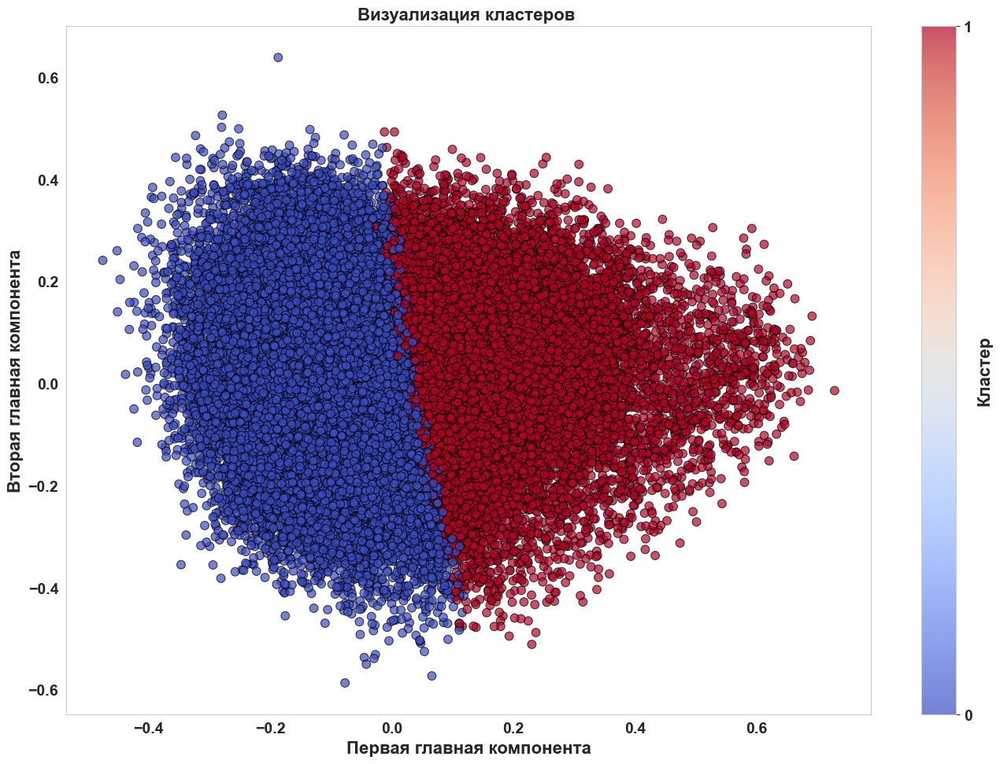

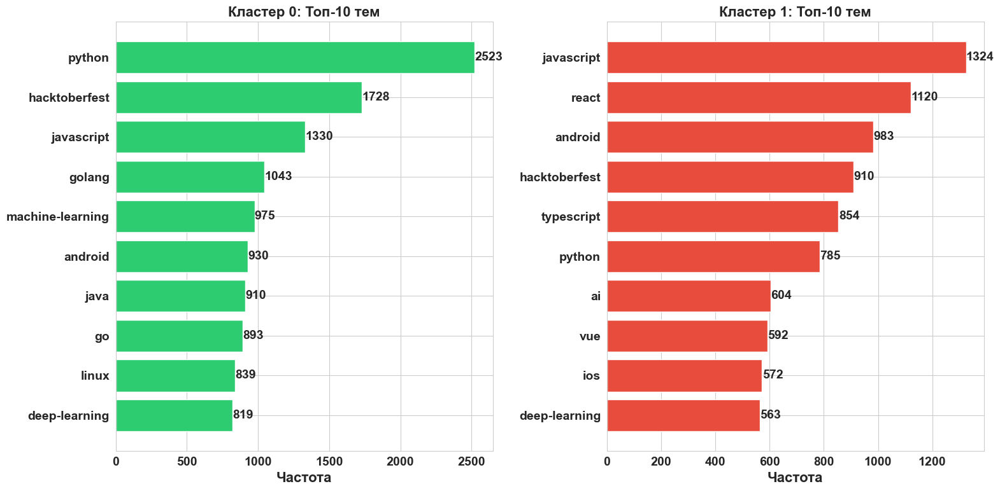

✓ Сохранён: cluster_topics.png


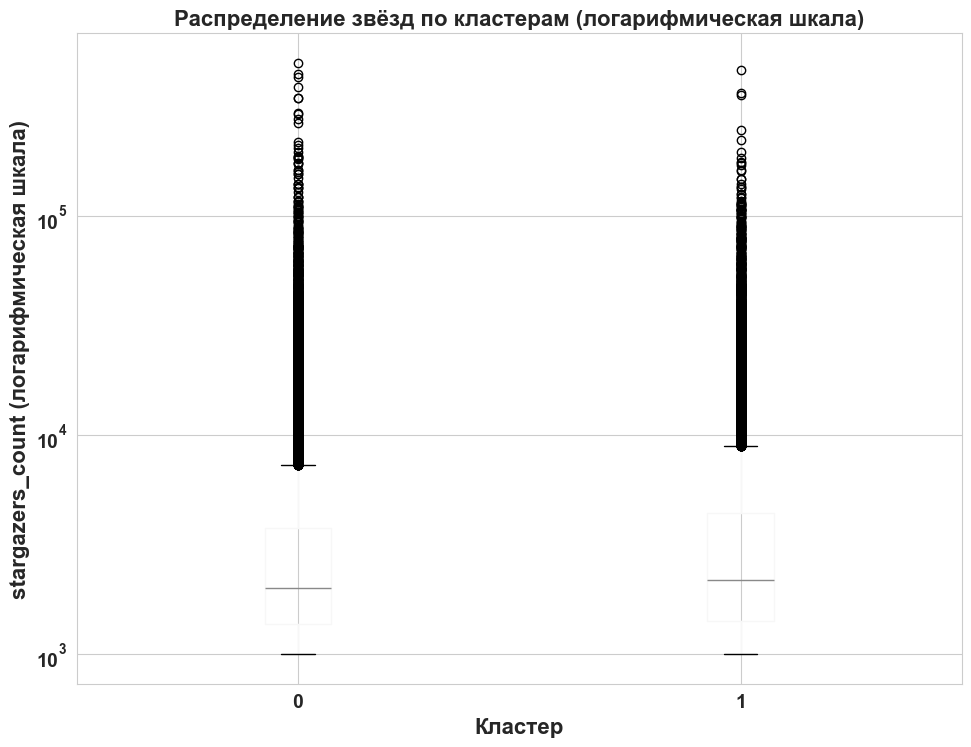

In [19]:
from sklearn.decomposition import PCA
from scipy import stats
from collections import Counter
import ast

# ============================================================
# НАСТРОЙКА ШРИФТА (16, ЖИРНЫЙ)
# ============================================================
plt.rcParams['font.size'] = 16
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14

print("="*80)
print("ЗАДАЧА 4. КЛАСТЕРИЗАЦИЯ РЕПОЗИТОРИЕВ")
print("="*80)

# ============================================================
# 1. СТАТИСТИЧЕСКАЯ ЗНАЧИМОСТЬ РАЗЛИЧИЙ МЕЖДУ КЛАСТЕРАМИ
# ============================================================

print("\n1. ПРОВЕРКА СТАТИСТИЧЕСКОЙ ЗНАЧИМОСТИ")
print("-"*60)

# Логарифмируем для t-test
df_semantic['log_stars'] = np.log1p(df_semantic['stargazers_count'])
df_semantic['log_forks'] = np.log1p(df_semantic['forks_count'])

cluster0 = df_semantic[df_semantic['cluster_semantic'] == 0]
cluster1 = df_semantic[df_semantic['cluster_semantic'] == 1]

results = []

# Звёзды
t_stat, p_stars = stats.ttest_ind(cluster0['log_stars'], cluster1['log_stars'])
results.append(('Звёзды (log)', t_stat, p_stars, p_stars < 0.05))

# Форки
t_stat, p_forks = stats.ttest_ind(cluster0['log_forks'], cluster1['log_forks'])
results.append(('Форки (log)', t_stat, p_forks, p_forks < 0.05))

# PR (Mann-Whitney)
u_stat, p_pr = stats.mannwhitneyu(cluster0['total_pr_count'], cluster1['total_pr_count'], alternative='two-sided')
results.append(('Pull Requests', u_stat, p_pr, p_pr < 0.05))

# Возраст
t_stat, p_age = stats.ttest_ind(cluster0['repo_age_days'], cluster1['repo_age_days'])
results.append(('Возраст (дни)', t_stat, p_age, p_age < 0.05))

print(f"{'Метрика':<20} {'Статистика':<12} {'p-value':<12} {'Значимо'}")
print("-"*60)
for name, stat, p, sig in results:
    stat_str = f"{stat:.3f}" if abs(stat) < 1000 else f"{stat:.0f}"
    print(f"{name:<20} {stat_str:<12} {p:.4e}")

# ============================================================
# 2. ТАБЛИЦА СРЕДНИХ МЕТРИК ПО КЛАСТЕРАМ
# ============================================================

print("\n2. СРАВНЕНИЕ КЛАСТЕРОВ")
print("-"*60)

metrics = ['stargazers_count', 'forks_count', 'total_pr_count', 'repo_age_days']
cluster0_means = [cluster0[m].mean() for m in metrics]
cluster1_means = [cluster1[m].mean() for m in metrics]
diff_pct = [(c0/c1 - 1)*100 if c1 > 0 else 0 for c0, c1 in zip(cluster0_means, cluster1_means)]

# Выводим таблицу
print(f"{'Метрика':<25} {'Кластер 0':<15} {'Кластер 1':<15} {'Разница':<10}")
print("-"*65)
print(f"{'Звёзды (среднее)':<25} {cluster0_means[0]:<15.0f} {cluster1_means[0]:<15.0f} {diff_pct[0]:+.1f}%")
print(f"{'Форки (среднее)':<25} {cluster0_means[1]:<15.0f} {cluster1_means[1]:<15.0f} {diff_pct[1]:+.1f}%")
print(f"{'Pull Requests (ср.)':<25} {cluster0_means[2]:<15.0f} {cluster1_means[2]:<15.0f} {diff_pct[2]:+.1f}%")
print(f"{'Возраст (дни)':<25} {cluster0_means[3]:<15.0f} {cluster1_means[3]:<15.0f} {diff_pct[3]:+.1f}%")

# # Сохраняем таблицу в CSV
# table_df = pd.DataFrame({
#     'Метрика': ['Звёзды (среднее)', 'Форки (среднее)', 'Pull Requests (ср.)', 'Возраст (дни)'],
#     'Кластер 0': cluster0_means,
#     'Кластер 1': cluster1_means,
#     'Разница': [f"{d:+.1f}%" for d in diff_pct]
# })
# table_df.to_csv('cluster_comparison.csv', index=False, encoding='utf-8-sig')
# print("\n✓ Таблица сохранена в 'cluster_comparison.csv'")

# ============================================================
# 3. ГРАФИК: ВИЗУАЛИЗАЦИЯ КЛАСТЕРОВ (PCA)
# ============================================================

print("\n3. ПОСТРОЕНИЕ ГРАФИКОВ")
print("-"*60)

# PCA на эмбеддингах
pca = PCA(n_components=2)
embeddings_2d = pca.fit_transform(embedding_matrix)

plt.figure(figsize=(14, 10))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], 
                      c=df_semantic['cluster_semantic'], 
                      cmap='coolwarm', alpha=0.7, s=60, edgecolors='k', linewidth=0.8)
plt.colorbar(scatter, label='Кластер', ticks=[0, 1])
plt.title(f'Визуализация кластеров ', 
          fontsize=16, fontweight='bold')
plt.xlabel('Первая главная компонента', fontsize=16, fontweight='bold')
plt.ylabel('Вторая главная компонента', fontsize=16, fontweight='bold')
plt.grid(False)
print(f'(PCA)\nОбъяснённая дисперсия: PC1 = {pca.explained_variance_ratio_[0]:.1%}, PC2 = {pca.explained_variance_ratio_[1]:.1%}')
plt.tight_layout()
# plt.savefig('pca_clusters.png', dpi=150, bbox_inches='tight')
plt.show()
# print("✓ Сохранён: pca_clusters.png")

# ============================================================
# 4. ГРАФИК: ТОП-10 ТЕМ ПО КЛАСТЕРАМ
# ============================================================

# Собираем темы для каждого кластера
topics_cluster0 = []
topics_cluster1 = []

for idx, row in df_semantic.iterrows():
    cluster_id = int(row['cluster_semantic'])
    topics = row['topics']
    
    if isinstance(topics, list):
        if cluster_id == 0:
            topics_cluster0.extend(topics)
        else:
            topics_cluster1.extend(topics)
    elif isinstance(topics, str) and topics:
        try:
            topics_list = ast.literal_eval(topics)
            if isinstance(topics_list, list):
                if cluster_id == 0:
                    topics_cluster0.extend(topics_list)
                else:
                    topics_cluster1.extend(topics_list)
        except:
            pass

counter0 = Counter(topics_cluster0).most_common(10)
counter1 = Counter(topics_cluster1).most_common(10)

topics0 = [t for t, _ in counter0]
freq0 = [f for _, f in counter0]
topics1 = [t for t, _ in counter1]
freq1 = [f for _, f in counter1]

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Кластер 0
ax1 = axes[0]
bars1 = ax1.barh(topics0, freq0, color='#2ecc71')
ax1.set_xlabel('Частота', fontsize=16, fontweight='bold')
ax1.set_title('Кластер 0: Топ-10 тем', fontsize=16, fontweight='bold')
ax1.invert_yaxis()
for bar, val in zip(bars1, freq0):
    ax1.text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2, 
             str(val), ha='left', va='center', fontsize=14, fontweight='bold')

# Кластер 1
ax2 = axes[1]
bars2 = ax2.barh(topics1, freq1, color='#e74c3c')
ax2.set_xlabel('Частота', fontsize=16, fontweight='bold')
ax2.set_title('Кластер 1: Топ-10 тем', fontsize=16, fontweight='bold')
ax2.invert_yaxis()
for bar, val in zip(bars2, freq1):
    ax2.text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2, 
             str(val), ha='left', va='center', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig('cluster_topics.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Сохранён: cluster_topics.png")

# ============================================================
# 5. ГРАФИК: СРАВНЕНИЕ ЗВЁЗД (BOXPLOT)
# ============================================================

fig, ax = plt.subplots(figsize=(10, 8))
df_semantic.boxplot(column='stargazers_count', by='cluster_semantic', ax=ax)
ax.set_yscale('log')
ax.set_title('Распределение звёзд по кластерам (логарифмическая шкала)', fontsize=16, fontweight='bold')
ax.set_xlabel('Кластер', fontsize=16, fontweight='bold')
ax.set_ylabel('stargazers_count (логарифмическая шкала)', fontsize=16, fontweight='bold')
ax.tick_params(labelsize=14)
plt.suptitle('')  # убираем автоматический заголовок
plt.tight_layout()
# plt.savefig('cluster_stars_boxplot.png', dpi=150, bbox_inches='tight')
plt.show()
# print("✓ Сохранён: cluster_stars_boxplot.png")


In [21]:
# ============================================================
# РАСШИРЕННАЯ ТАБЛИЦА С ТОЧНЫМИ P-VALUE
# ============================================================

import numpy as np
import pandas as pd
from scipy import stats

print("\n" + "="*90)
print("РАСШИРЕННОЕ СРАВНЕНИЕ КЛАСТЕРОВ (с точными p-value)")
print("="*90)

# Список метрик для сравнения
metrics_list = [
    'stargazers_count',
    'forks_count', 
    'subscribers_count',
    'total_pr_count',
    'contributors_count',
    'closed_issues_count',
    'readme_length',
    'releases_count',
    'repo_age_days'
]

# Человекочитаемые названия
metric_names = [
    'Звёзды',
    'Форки',
    'Подписчики',
    'Pull Requests',
    'Контрибьюторы',
    'Закрытые задачи',
    'Длина README (симв.)',
    'Релизы',
    'Возраст (дни)'
]

# Получаем кластеры
cluster0 = df_semantic[df_semantic['cluster_semantic'] == 0]
cluster1 = df_semantic[df_semantic['cluster_semantic'] == 1]

# Хранение результатов
results_data = []

print(f"{'Метрика':<25} {'Кластер 0':<12} {'Кластер 1':<12} {'Разница':<12} {'p-value':<15} {'Значимо'}")
print("-" * 90)

for name, metric in zip(metric_names, metrics_list):
    if metric in df_semantic.columns:
        c0_mean = cluster0[metric].mean()
        c1_mean = cluster1[metric].mean()
        
        # Процентная разница (относительно кластера 1)
        if c1_mean != 0:
            diff_pct = (c0_mean / c1_mean - 1) * 100
        else:
            diff_pct = 0
        
        # Выбор теста в зависимости от метрики
        if metric in ['stargazers_count', 'forks_count', 'subscribers_count']:
            # Логарифмируем для t-test
            log_c0 = np.log1p(cluster0[metric])
            log_c1 = np.log1p(cluster1[metric])
            _, p_val = stats.ttest_ind(log_c0, log_c1)
        else:
            # Mann-Whitney для остальных
            _, p_val = stats.mannwhitneyu(cluster0[metric], cluster1[metric], alternative='two-sided')
        
        # Определяем значимость
        is_significant = p_val < 0.05
        sig_mark = "✅ Да" if is_significant else "❌ Нет"
        
        # Форматируем p-value (научный формат для маленьких)
        if p_val < 0.0001:
            p_str = f"{p_val:.2e}"
        else:
            p_str = f"{p_val:.4f}"
        
        # Знак разницы
        sign = "+" if diff_pct > 0 else ""
        
        print(f"{name:<25} {c0_mean:<12.0f} {c1_mean:<12.0f} {sign}{diff_pct:<11.1f}% {p_str:<18} {sig_mark}")
        
        # Сохраняем для таблицы
        results_data.append({
            'Метрика': name,
            'Кластер 0': round(c0_mean, 1),
            'Кластер 1': round(c1_mean, 1),
            'Разница, %': round(diff_pct, 1),
            'p-value': p_val,
            'p-value (форм.)': p_str,
            'Значимо (p<0.05)': is_significant
        })
    else:
        print(f"{name:<25} {'N/A':<12} {'N/A':<12} {'N/A':<12} {'N/A':<18}")
        results_data.append({
            'Метрика': name,
            'Кластер 0': None,
            'Кластер 1': None,
            'Разница, %': None,
            'p-value': None,
            'p-value (форм.)': 'N/A',
            'Значимо (p<0.05)': False
        })




РАСШИРЕННОЕ СРАВНЕНИЕ КЛАСТЕРОВ (с точными p-value)
Метрика                   Кластер 0    Кластер 1    Разница      p-value         Значимо
------------------------------------------------------------------------------------------
Звёзды                    4214         5029         -16.2      % 9.14e-48           ✅ Да
Форки                     774          699          +10.6       % 1.58e-33           ✅ Да
Подписчики                109          86           +26.5       % 3.72e-175          ✅ Да
Pull Requests             585          508          +15.0       % 0.0432             ✅ Да
Контрибьюторы             84           67           +25.2       % 1.49e-14           ✅ Да
Закрытые задачи           420          456          -7.7       % 7.13e-55           ✅ Да
Длина README (симв.)      12287        12572        -2.3       % 1.62e-91           ✅ Да
Релизы                    38           49           -22.8      % 5.52e-151          ✅ Да
Возраст (дни)             3162         2682        

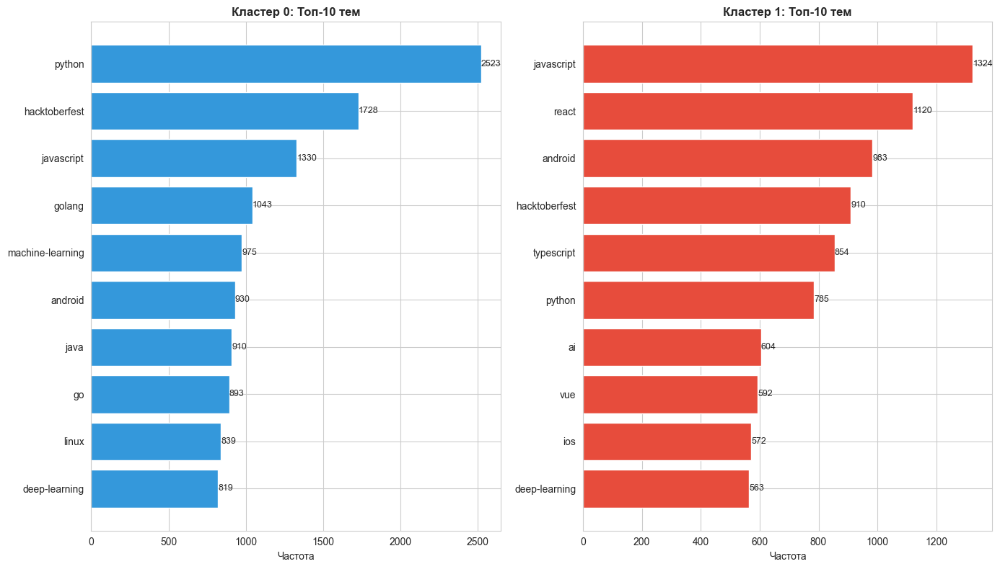

In [12]:
from collections import Counter

# Собираем темы для каждого кластера
topics_cluster0 = []
topics_cluster1 = []

for cluster_id in sorted(df_semantic["cluster_semantic"].astype(int).unique()):
    cluster_data = df_semantic[df_semantic["cluster_semantic"].astype(int) == cluster_id]
    for topics in cluster_data["topics"]:
        if isinstance(topics, list):
            if cluster_id == 0:
                topics_cluster0.extend(topics)
            else:
                topics_cluster1.extend(topics)
        elif isinstance(topics, str) and topics:
            try:
                topics_list = ast.literal_eval(topics)
                if isinstance(topics_list, list):
                    if cluster_id == 0:
                        topics_cluster0.extend(topics_list)
                    else:
                        topics_cluster1.extend(topics_list)
            except:
                pass

counter0 = Counter(topics_cluster0).most_common(10)
counter1 = Counter(topics_cluster1).most_common(10)

# Извлекаем темы и частоты
topics0 = [t for t, _ in counter0]
freq0 = [f for _, f in counter0]
topics1 = [t for t, _ in counter1]
freq1 = [f for _, f in counter1]

fig, axes = plt.subplots(1, 2, figsize=(14, 8))

# Кластер 0 (слева)
ax1 = axes[0]
bars1 = ax1.barh(topics0, freq0, color='#3498db')
ax1.set_xlabel('Частота')
ax1.set_title('Кластер 0: Топ-10 тем', fontweight='bold')
ax1.invert_yaxis()
for bar, val in zip(bars1, freq0):
    ax1.text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2, 
             str(val), ha='left', va='center', fontsize=9)

# Кластер 1 (справа)
ax2 = axes[1]
bars2 = ax2.barh(topics1, freq1, color='#e74c3c')
ax2.set_xlabel('Частота')
ax2.set_title('Кластер 1: Топ-10 тем', fontweight='bold')
ax2.invert_yaxis()
for bar, val in zip(bars2, freq1):
    ax2.text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2, 
             str(val), ha='left', va='center', fontsize=9)

plt.tight_layout()
plt.savefig('cluster_topics.png', dpi=150)
plt.show()

# Кластеризация по ЧИСЛОВЫМ признакам

## Выбор оптимального k

In [9]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import calinski_harabasz_score
df_clean = df.copy()
features_for_clustering = [
    "stargazers_count", "forks_count", "subscribers_count",
    "open_issues_count", "closed_issues_count", 
    "open_pr_count", "closed_pr_count", "total_pr_count",
    "contributors_count", "total_commits", "releases_count",
    "readme_length", "repo_age_days", "topics_count", "size_mb"
]

available_features = [f for f in features_for_clustering if f in df_clean.columns]
print(f"Используемые признаки ({len(available_features)}): {available_features}")

X = df_clean[available_features].fillna(0)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print(f"Форма X_scaled: {X_scaled.shape}")

print("\nОПРЕДЕЛЕНИЕ ОПТИМАЛЬНОГО ЧИСЛА КЛАСТЕРОВ")

K_range = range(2, 11)
inertias = []
silhouette_scores = []
calinski_scores = []

for k in K_range:
    kmeans_test = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels_test = kmeans_test.fit_predict(X_scaled)
    
    inertias.append(kmeans_test.inertia_)
    silhouette_scores.append(silhouette_score(X_scaled, labels_test))
    calinski_scores.append(calinski_harabasz_score(X_scaled, labels_test))
    
    print(f"\nk={k}:")
    print(f"  Инерция: {kmeans_test.inertia_:.0f}")
    print(f"  Silhouette: {silhouette_scores[-1]:.3f}")
    print(f"  Calinski-Harabasz: {calinski_scores[-1]:.0f}")

best_k_silhouette = K_range[np.argmax(silhouette_scores)]
best_k_calinski = K_range[np.argmax(calinski_scores)]
print(f"\nОптимальное k по силуэту: {best_k_silhouette}")
print(f"Оптимальное k по Calinski-Harabasz: {best_k_calinski}")

optimal_k = best_k_silhouette
print(f"\nИспользуем k = {optimal_k}")

Используемые признаки (15): ['stargazers_count', 'forks_count', 'subscribers_count', 'open_issues_count', 'closed_issues_count', 'open_pr_count', 'closed_pr_count', 'total_pr_count', 'contributors_count', 'total_commits', 'releases_count', 'readme_length', 'repo_age_days', 'topics_count', 'size_mb']
Форма X_scaled: (2646, 15)

ОПРЕДЕЛЕНИЕ ОПТИМАЛЬНОГО ЧИСЛА КЛАСТЕРОВ

k=2:
  Инерция: 33858
  Silhouette: 0.744
  Calinski-Harabasz: 455

k=3:
  Инерция: 29398
  Silhouette: 0.720
  Calinski-Harabasz: 463

k=4:
  Инерция: 26753
  Silhouette: 0.583
  Calinski-Harabasz: 426

k=5:
  Инерция: 24870
  Silhouette: 0.195
  Calinski-Harabasz: 393

k=6:
  Инерция: 23039
  Silhouette: 0.198
  Calinski-Harabasz: 382

k=7:
  Инерция: 21204
  Silhouette: 0.207
  Calinski-Harabasz: 383

k=8:
  Инерция: 19929
  Silhouette: 0.204
  Calinski-Harabasz: 374

k=9:
  Инерция: 18527
  Silhouette: 0.217
  Calinski-Harabasz: 377

k=10:
  Инерция: 17194
  Silhouette: 0.213
  Calinski-Harabasz: 383

Оптимальное k по

## Деление на ЧИСЛОВЫЕ кластеры

In [10]:
print(f"\nКЛАСТЕРИЗАЦИЯ С k = {optimal_k}")
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_clean["cluster"] = kmeans.fit_predict(X_scaled).astype(str)

print(f"Кластеризация завершена. Создано {optimal_k} кластеров.")


КЛАСТЕРИЗАЦИЯ С k = 2
Кластеризация завершена. Создано 2 кластеров.


## Статистики и графики по ЧИСЛОВЫМ кластерам

In [11]:
print("\nХАРАКТЕРИСТИКА КЛАСТЕРОВ:\n")
metrics = [
    "stargazers_count", "forks_count", "subscribers_count",
    "open_issues_count", "closed_issues_count", 
    "open_pr_count", "closed_pr_count", "total_pr_count",
    "contributors_count", "total_commits", "releases_count",
    "readme_length", "repo_age_days", "topics_count"
]

cluster_stats = df_clean.groupby("cluster")[metrics].mean().round(2)
cluster_stats["size"] = df_clean.groupby("cluster").size()

# print(cluster_stats.to_string())
from IPython.display import display
display_stats = cluster_stats.round(1)
display(display_stats)



print("Краткая характеристика каждого кластера")
for cluster_id in sorted(df_clean["cluster"].unique()):
    cluster_data = df_clean[df_clean["cluster"] == cluster_id]
    print(f"\nКластер {cluster_id} ({len(cluster_data)} репозиториев)")
    print(f"   Среднее звёзд: {cluster_data['stargazers_count'].mean():.0f}")
    print(f"   Среднее форков: {cluster_data['forks_count'].mean():.0f}")
    print(f"   Средний возраст: {cluster_data['repo_age_days'].mean():.0f} дней")
    print(f"   Основной язык: {cluster_data['primary_language'].mode().iloc[0] if len(cluster_data['primary_language'].mode()) > 0 else 'N/A'}")

print("АНАЛИЗ ТЕМ (TOPICS) ПО КЛАСТЕРАМ")

from collections import Counter

# Сбор тем по кластерам
cluster_topics_dict = {}

for cluster_id in sorted(df_clean["cluster"].unique()):
    cluster_data = df_clean[df_clean["cluster"] == cluster_id]
    all_topics = []
    
    for topics in cluster_data["topics"]:
        if isinstance(topics, list):
            all_topics.extend(topics)
        elif isinstance(topics, str) and topics:
            try:
                import ast
                topics_list = ast.literal_eval(topics)
                if isinstance(topics_list, list):
                    all_topics.extend(topics_list)
            except:
                pass
    
    cluster_topics_dict[cluster_id] = Counter(all_topics).most_common(10) if all_topics else []
    
    print(f"\n{'─'*50}")
    print(f"Кластер {cluster_id} (всего репозиториев: {len(cluster_data)})")
    print(f"{'─'*50}")
    
    if cluster_topics_dict[cluster_id]:
        print("Топ-10 тем:")
        for i, (topic, count) in enumerate(cluster_topics_dict[cluster_id], 1):
            print(f"  {i:2d}. {topic}: {count} раз(а)")
    else:
        print("  Нет тем для анализа")

print("АНАЛИЗ СЛОВ ПО КЛАСТЕРАМ")        
from sklearn.feature_extraction.text import CountVectorizer
import nltk
from nltk.corpus import stopwords

# Скачиваем стоп-слова (только первый раз)
# try:
#     nltk.data.find('tokenizers/punkt')
# except LookupError:
#     nltk.download('punkt')
#     nltk.download('stopwords')

# Русские и английские стоп-слова
stop_words = set(stopwords.words('russian') + stopwords.words('english'))
# Добавляем специфические слова
custom_stop = ['use', 'using', 'also', 'would', 'could', 'get', 'would', 'one', 'two', 'three', 
               'many', 'much', 'may', 'well', 'see', 'make', 'way', 'even', 'like', 'however', 
               'therefore', 'thus', 'hence', 'rather', 'quite', 'via', 'per', 'each', 'both', 
               'without', 'within', 'across', 'along', 'among', 'according', 'since', 'than',
               'using', 'provide', 'see', 'etc', 'i.e', 'e.g', 'fig', 'table', 'section']
stop_words.update(custom_stop)

for cluster_id in sorted(df_clean["cluster"].unique()):
    print(f"\n{'─'*50}")
    print(f"Кластер {cluster_id} (всего репозиториев: {(df_clean['cluster'] == cluster_id).sum()})")
    print(f"{'─'*50}")
    
    # Собираем все README из кластера
    cluster_readmes = df_clean[df_clean["cluster"] == cluster_id]["readme"].fillna("").tolist()
    
    if len(cluster_readmes) > 0:

        vectorizer = CountVectorizer(
            max_features=30,
            stop_words=list(stop_words),
            min_df=2,
            max_df=0.8,
            ngram_range=(1, 2)
        )
        
        try:
            dtm = vectorizer.fit_transform(cluster_readmes)
            word_counts = dtm.sum(axis=0).A1
            words = vectorizer.get_feature_names_out()
            
            # Топ-10 слов
            top_indices = word_counts.argsort()[-10:][::-1]
            
            print("\nТоп-10 ключевых слов/фраз:")
            for i, idx in enumerate(top_indices, 1):
                print(f"  {i:2d}. {words[idx]} (встречается: {word_counts[idx]} раз)")
        except Exception as e:
            print(f"  Ошибка при анализе текста: {e}")
    else:
        print("  Нет README для анализа")



ХАРАКТЕРИСТИКА КЛАСТЕРОВ:



,stargazers_count,forks_count,subscribers_count,open_issues_count,closed_issues_count,open_pr_count,closed_pr_count,total_pr_count,contributors_count,total_commits,releases_count,readme_length,repo_age_days,topics_count,size
cluster,,,,,,,,,,,,,,,
0,3709.9,433.8,35.3,39.2,106.5,8.6,165.9,174.6,23.5,891.4,26.0,13890.3,682.8,5.0,2556
1,32035.2,3876.1,244.7,313.6,1546.6,147.8,2807.4,2955.2,402.2,16140.0,147.4,22449.3,694.3,7.8,90


Краткая характеристика каждого кластера

Кластер 0 (2556 репозиториев)
   Среднее звёзд: 3710
   Среднее форков: 434
   Средний возраст: 683 дней
   Основной язык: Python

Кластер 1 (90 репозиториев)
   Среднее звёзд: 32035
   Среднее форков: 3876
   Средний возраст: 694 дней
   Основной язык: Python
АНАЛИЗ ТЕМ (TOPICS) ПО КЛАСТЕРАМ

──────────────────────────────────────────────────
Кластер 0 (всего репозиториев: 2556)
──────────────────────────────────────────────────
Топ-10 тем:
   1. ai: 244 раз(а)
   2. llm: 226 раз(а)
   3. python: 128 раз(а)
   4. react: 83 раз(а)
   5. rag: 82 раз(а)
   6. typescript: 81 раз(а)
   7. openai: 75 раз(а)
   8. agent: 70 раз(а)
   9. rust: 68 раз(а)
  10. agents: 58 раз(а)

──────────────────────────────────────────────────
Кластер 1 (всего репозиториев: 90)
──────────────────────────────────────────────────
Топ-10 тем:
   1. ai: 18 раз(а)
   2. llm: 15 раз(а)
   3. python: 12 раз(а)
   4. mcp: 10 раз(а)
   5. typescript: 8 раз(а)
   6. nextjs: 7 р

# Сравнение регрессии: общая модель и модели по  СМЫСЛОВЫМ кластерам

СРАВНЕНИЕ КАЧЕСТВА РЕГРЕССИИ
Данные загружены: 2643 репозиториев, 2 кластеров
Распределение по кластерам:
cluster_semantic
0    1041
1    1602

Используем признаки (12): ['releases_count', 'open_issues_count', 'closed_issues_count', 'open_pr_count', 'closed_pr_count', 'contributors_count', 'total_commits', 'readme_length', 'readme_has_code', 'repo_age_days', 'has_github_actions', 'topics_count']

Размер выборки после очистки: 2643
ОБУЧЕНИЕ ОБЩЕЙ МОДЕЛИ
R² = 0.3292
MAE = 0.5378
RMSE = 0.6926
ОБУЧЕНИЕ МОДЕЛЕЙ ДЛЯ КАЖДОГО КЛАСТЕРА

Кластер 0 (размер: 1041):
   R² = 0.3227 ХУЖЕ общей
   MAE = 0.5803
   RMSE = 0.7812

Кластер 1 (размер: 1602):
   R² = 0.2398 ХУЖЕ общей
   MAE = 0.5495
   RMSE = 0.7168
СРАВНЕНИЕ РЕЗУЛЬТАТОВ

Сравнение моделей по кластерам:
 cluster  size       r2      mae     rmse  better_than_all
       0  1041 0.322653 0.580317 0.781175            False
       1  1602 0.239810 0.549480 0.716814            False

Из 2 кластеров 0 показали результат ЛУЧШЕ общей модели
   Дол

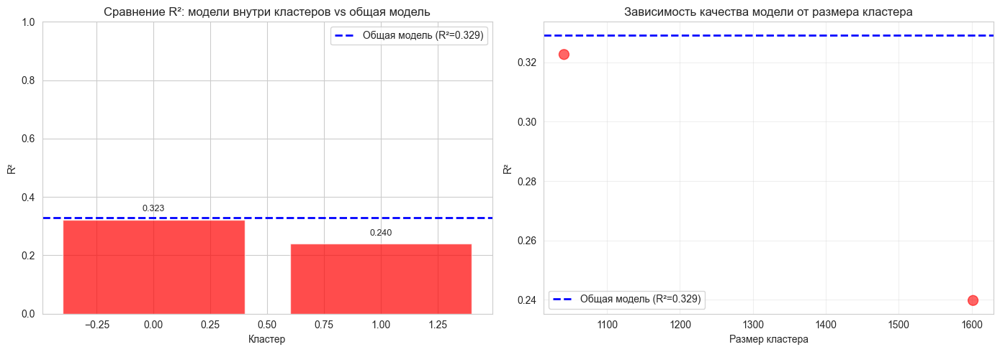

СТАТИСТИЧЕСКАЯ ЗНАЧИМОСТЬ РАЗЛИЧИЙ МЕЖДУ КЛАСТЕРАМИ (ANOVA)

ANOVA для каждой метрики (проверка: отличаются ли кластеры статистически значимо):

stargazers_count:
   F-statistic = 11.2192
   p-value = 0.000821
   КЛАСТЕРЫ РАЗЛИЧНЫ (p < 0.05)

forks_count:
   F-statistic = 0.3672
   p-value = 0.544595
   КЛАСТЕРЫ НЕ РАЗЛИЧНЫ (p >= 0.05)

total_pr_count:
   F-statistic = 1.3352
   p-value = 0.247991
   КЛАСТЕРЫ НЕ РАЗЛИЧНЫ (p >= 0.05)

contributors_count:
   F-statistic = 0.4238
   p-value = 0.515106
   КЛАСТЕРЫ НЕ РАЗЛИЧНЫ (p >= 0.05)

repo_age_days:
   F-statistic = 0.3866
   p-value = 0.534124
   КЛАСТЕРЫ НЕ РАЗЛИЧНЫ (p >= 0.05)

readme_length:
   F-statistic = 0.8452
   p-value = 0.358003
   КЛАСТЕРЫ НЕ РАЗЛИЧНЫ (p >= 0.05)


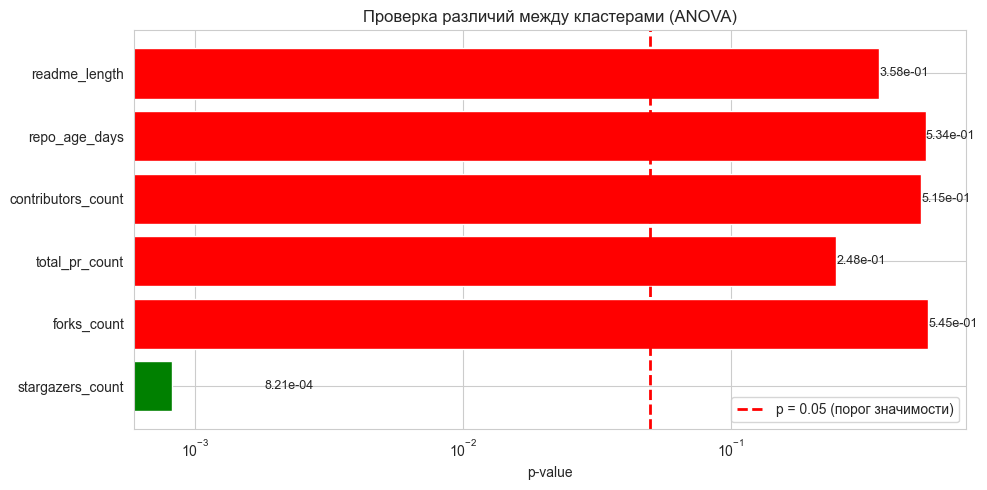

ИТОГОВЫЕ ВЫВОДЫ

Результаты сравнения регрессионных моделей:
   Общая модель: R² = 0.3292
   Лучшая модель по кластерам: R² = 0.3227 (кластер 0)
   Улучшение: -0.7%

Статистическая значимость кластеров:
   1/6 метрик показывают значимые различия между кластерами


In [12]:
print("СРАВНЕНИЕ КАЧЕСТВА РЕГРЕССИИ")

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from scipy import stats
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


if 'cluster_semantic' not in df_semantic.columns:
    print("Ошибка: нет колонки 'cluster'. Сначала выполните кластеризацию.")
else:
    print(f"Данные загружены: {len(df_semantic)} репозиториев, {len(df_semantic['cluster_semantic'].unique())} кластеров")
    print(f"Распределение по кластерам:\n{df_semantic['cluster_semantic'].value_counts().sort_index().to_string()}")

    feature_cols = [
        "releases_count", "open_issues_count", "closed_issues_count",
        "open_pr_count", "closed_pr_count", "contributors_count", "total_commits",
        "readme_length", "readme_has_code", "repo_age_days",
        "has_dockerfile", "has_github_actions", "topics_count"
    ]
    

    available_features = [f for f in feature_cols if f in df_semantic.columns]
    print(f"\nИспользуем признаки ({len(available_features)}): {available_features}")
    
    df_semantic["popularity"] = np.log1p(df_semantic["stargazers_count"])
    categorical_features = ["primary_language"] if "primary_language" in df_semantic.columns else []
    X = df_semantic[available_features + categorical_features].copy()
    y = df_semantic["popularity"].copy()
    
    mask = ~X.isna().any(axis=1)
    X = X[mask]
    y = y[mask]
    clusters = df_semantic["cluster_semantic"][mask].copy()
    
    print(f"\nРазмер выборки после очистки: {len(X)}")
    
#============================================================
#ОБУЧЕНИЕ МОДЕЛЕЙ 

preprocessor = ColumnTransformer([
    ("num", StandardScaler(), available_features),
    ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), categorical_features)
])

#ОБЩАЯ МОДЕЛЬ

print("ОБУЧЕНИЕ ОБЩЕЙ МОДЕЛИ")

X_train_all, X_test_all, y_train_all, y_test_all = train_test_split(
    X, y, test_size=0.2, random_state=42
)
rf_all = Pipeline([
    ("preprocessor", preprocessor),
    ("regressor", RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1))
])
rf_all.fit(X_train_all, y_train_all)
y_pred_all = rf_all.predict(X_test_all)

r2_all = r2_score(y_test_all, y_pred_all)
mae_all = mean_absolute_error(y_test_all, y_pred_all)
rmse_all = np.sqrt(mean_squared_error(y_test_all, y_pred_all))

print(f"R² = {r2_all:.4f}")
print(f"MAE = {mae_all:.4f}")
print(f"RMSE = {rmse_all:.4f}")

#МОДЕЛИ ДЛЯ КАЖДОГО КЛАСТЕРА

print("ОБУЧЕНИЕ МОДЕЛЕЙ ДЛЯ КАЖДОГО КЛАСТЕРА")
cluster_results = []
all_predictions = {}

for cluster_id in sorted(clusters.unique()):
    mask_cluster = clusters == cluster_id
    X_cluster = X[mask_cluster]
    y_cluster = y[mask_cluster]
    
    if len(X_cluster) < 10:
        print(f"\nКластер {cluster_id}: слишком мало данных ({len(X_cluster)}), пропускаем")
        continue
    

    X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(
        X_cluster, y_cluster, test_size=0.2, random_state=42
    )
    
    rf_cluster = Pipeline([
        ("preprocessor", preprocessor),
        ("regressor", RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1))
    ])
    rf_cluster.fit(X_train_c, y_train_c)
    y_pred_c = rf_cluster.predict(X_test_c)
    all_predictions[cluster_id] = y_pred_c
    

    r2_c = r2_score(y_test_c, y_pred_c)
    mae_c = mean_absolute_error(y_test_c, y_pred_c)
    rmse_c = np.sqrt(mean_squared_error(y_test_c, y_pred_c))
    
    cluster_results.append({
        "cluster": cluster_id,
        "size": len(X_cluster),
        "r2": r2_c,
        "mae": mae_c,
        "rmse": rmse_c,
        "better_than_all": r2_c > r2_all
    })
    
    print(f"\nКластер {cluster_id} (размер: {len(X_cluster)}):")
    print(f"   R² = {r2_c:.4f} {'ЛУЧШЕ общей' if r2_c > r2_all else 'ХУЖЕ общей'}")
    print(f"   MAE = {mae_c:.4f}")
    print(f"   RMSE = {rmse_c:.4f}")

# ============================================================
#СРАВНЕНИЕ РЕЗУЛЬТАТОВ

print("СРАВНЕНИЕ РЕЗУЛЬТАТОВ")


results_df = pd.DataFrame(cluster_results)
results_df = results_df.sort_values("r2", ascending=False)

print("\nСравнение моделей по кластерам:")
print(results_df.to_string(index=False))

better_count = results_df["better_than_all"].sum()
total_count = len(results_df)
print(f"\nИз {total_count} кластеров {better_count} показали результат ЛУЧШЕ общей модели")
print(f"   Доля: {better_count/total_count*100:.1f}%")

if better_count > total_count/2:
    print("\nГИПОТЕЗА ПОДТВЕРЖДАЕТСЯ")
else:
    print("\nГИПОТЕЗА НЕ ПОДТВЕРЖДАЕТСЯ")

# Визуализация сравнения
fig, axes = plt.subplots(1, 2, figsize=(14, 5))


ax1 = axes[0]
clusters_list = results_df["cluster"].tolist()
r2_list = results_df["r2"].tolist()
colors = ['green' if r > r2_all else 'red' for r in r2_list]

bars = ax1.bar(clusters_list, r2_list, color=colors, alpha=0.7)
ax1.axhline(y=r2_all, color='blue', linestyle='--', linewidth=2, label=f'Общая модель (R²={r2_all:.3f})')
ax1.set_xlabel("Кластер")
ax1.set_ylabel("R²")
ax1.set_title("Сравнение R²: модели внутри кластеров vs общая модель")
ax1.legend()
ax1.set_ylim(min(0, min(r2_list) - 0.1), 1.0)

for bar, r2 in zip(bars, r2_list):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02, 
             f'{r2:.3f}', ha='center', va='bottom', fontsize=9)


ax2 = axes[1]
ax2.scatter(results_df["size"], results_df["r2"], s=100, alpha=0.6, c=colors)
ax2.axhline(y=r2_all, color='blue', linestyle='--', linewidth=2, label=f'Общая модель (R²={r2_all:.3f})')
ax2.set_xlabel("Размер кластера")
ax2.set_ylabel("R²")
ax2.set_title("Зависимость качества модели от размера кластера")
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig("cluster_regression_comparison.png", dpi=150, bbox_inches="tight")
plt.show()

# ============================================================
#ПРОВЕРКА СТАТИСТИЧЕСКОЙ ЗНАЧИМОСТИ РАЗЛИЧИЙ МЕЖДУ КЛАСТЕРАМИ

print("СТАТИСТИЧЕСКАЯ ЗНАЧИМОСТЬ РАЗЛИЧИЙ МЕЖДУ КЛАСТЕРАМИ (ANOVA)")

metrics_for_anova = ["stargazers_count", "forks_count", "total_pr_count", 
                     "contributors_count", "repo_age_days", "readme_length"]

available_anova = [m for m in metrics_for_anova if m in df_semantic.columns]

print("\nANOVA для каждой метрики (проверка: отличаются ли кластеры статистически значимо):")
anova_results = []
for metric in available_anova:
    # Собираем значения по кластерам
    groups = []
    cluster_ids = []
    for cluster_id in sorted(df_semantic["cluster_semantic"].unique()):
        values = df_semantic[df_semantic["cluster_semantic"] == cluster_id][metric].dropna().values
        if len(values) > 0:
            groups.append(values)
            cluster_ids.append(cluster_id)
    
    if len(groups) >= 2:
        f_stat, p_value = stats.f_oneway(*groups)
        significant = p_value < 0.05
        anova_results.append({
            "metric": metric,
            "f_stat": f_stat,
            "p_value": p_value,
            "significant": significant
        })
        print(f"\n{metric}:")
        print(f"   F-statistic = {f_stat:.4f}")
        print(f"   p-value = {p_value:.6f}")
        print(f"   {'КЛАСТЕРЫ РАЗЛИЧНЫ (p < 0.05)' if significant else 'КЛАСТЕРЫ НЕ РАЗЛИЧНЫ (p >= 0.05)'}")

# Визуализация ANOVA результатов
if anova_results:
    fig, ax = plt.subplots(figsize=(10, 5))
    metrics = [r["metric"] for r in anova_results]
    p_values = [r["p_value"] for r in anova_results]
    colors_anova = ['green' if r["significant"] else 'red' for r in anova_results]
    
    bars = ax.barh(metrics, p_values, color=colors_anova)
    ax.axvline(x=0.05, color='red', linestyle='--', linewidth=2, label='p = 0.05 (порог значимости)')
    ax.set_xlabel("p-value")
    ax.set_title("Проверка различий между кластерами (ANOVA)")
    ax.set_xscale('log')
    ax.legend()
    
    for bar, p_val, sig in zip(bars, p_values, colors_anova):
        ax.text(bar.get_width() + 0.001, bar.get_y() + bar.get_height()/2, 
                f'{p_val:.2e}', ha='left', va='center', fontsize=9)
    
    plt.tight_layout()
    plt.savefig("anova_clusters.png", dpi=150, bbox_inches="tight")
    plt.show()

# ============================================================
# ИТОГОВЫЕ ВЫВОДЫ


print("ИТОГОВЫЕ ВЫВОДЫ")


print("\nРезультаты сравнения регрессионных моделей:")
print(f"   Общая модель: R² = {r2_all:.4f}")
print(f"   Лучшая модель по кластерам: R² = {results_df['r2'].max():.4f} (кластер {results_df.loc[results_df['r2'].idxmax(), 'cluster']})")
print(f"   Улучшение: {(results_df['r2'].max() - r2_all)*100:.1f}%")

print("\nСтатистическая значимость кластеров:")
significant_count = sum(1 for r in anova_results if r["significant"])
if significant_count > 0:
    print(f"   {significant_count}/{len(anova_results)} метрик показывают значимые различия между кластерами")
else:
    print(f"   Кластеры статистически не различны по проверенным метрикам")

# Сравнение регрессии: общая модель и модели по ЧИСЛОВЫМ кластерам

СРАВНЕНИЕ КАЧЕСТВА РЕГРЕССИИ
Данные загружены: 2646 репозиториев, 2 кластеров
   Распределение по кластерам:
cluster
0    2556
1      90

Используем признаки (12): ['releases_count', 'open_issues_count', 'closed_issues_count', 'open_pr_count', 'closed_pr_count', 'contributors_count', 'total_commits', 'readme_length', 'readme_has_code', 'repo_age_days', 'has_github_actions', 'topics_count']

Размер выборки после очистки: 2646
1. ОБУЧЕНИЕ ОБЩЕЙ МОДЕЛИ
R² = 0.3544
MAE = 0.5564
RMSE = 0.7188
ОБУЧЕНИЕ МОДЕЛЕЙ ДЛЯ КАЖДОГО КЛАСТЕРА

Кластер 0 (размер: 2556):
   R² = 0.2520 ХУЖЕ общей
   MAE = 0.5270
   RMSE = 0.6718

Кластер 1 (размер: 90):
   R² = -0.0386 ХУЖЕ общей
   MAE = 1.1630
   RMSE = 1.3743
3. СРАВНЕНИЕ РЕЗУЛЬТАТОВ

Сравнение моделей по кластерам:
cluster  size        r2      mae     rmse  better_than_all
      0  2556  0.251955 0.526988 0.671815            False
      1    90 -0.038602 1.163035 1.374327            False

Из 2 кластеров 0 показали результат ЛУЧШЕ общей модели
   Доля

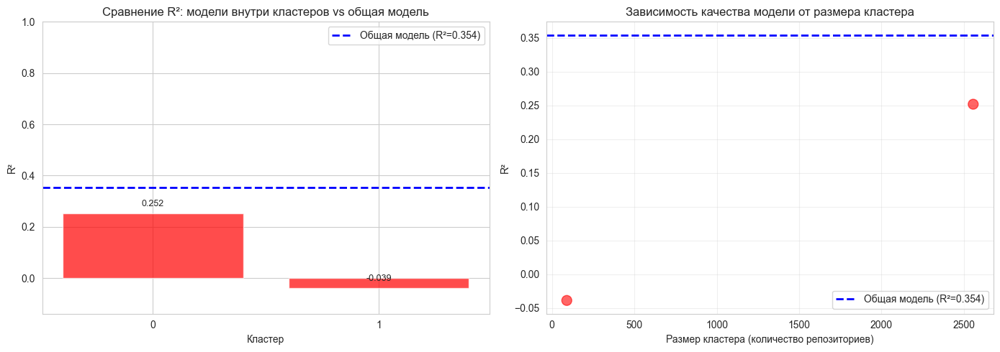

СТАТИСТИЧЕСКАЯ ЗНАЧИМОСТЬ РАЗЛИЧИЙ МЕЖДУ КЛАСТЕРАМИ (ANOVA)

ANOVA для каждой метрики (проверка: отличаются ли кластеры статистически значимо):
------------------------------------------------------------

stargazers_count:
   F-statistic = 1244.4099
   p-value = 0.000000
   КЛАСТЕРЫ РАЗЛИЧНЫ (p < 0.05)

forks_count:
   F-statistic = 612.1333
   p-value = 0.000000
   КЛАСТЕРЫ РАЗЛИЧНЫ (p < 0.05)

total_pr_count:
   F-statistic = 1625.9950
   p-value = 0.000000
   КЛАСТЕРЫ РАЗЛИЧНЫ (p < 0.05)

contributors_count:
   F-statistic = 191.0396
   p-value = 0.000000
   КЛАСТЕРЫ РАЗЛИЧНЫ (p < 0.05)

repo_age_days:
   F-statistic = 1.0086
   p-value = 0.315333
   КЛАСТЕРЫ НЕ РАЗЛИЧНЫ (p >= 0.05)

readme_length:
   F-statistic = 7.2399
   p-value = 0.007175
   КЛАСТЕРЫ РАЗЛИЧНЫ (p < 0.05)


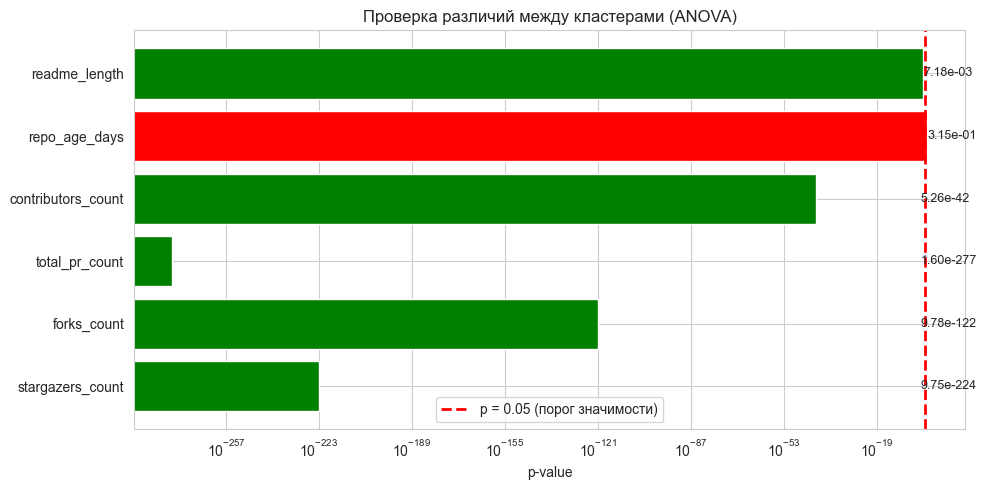

ИТОГОВЫЕ ВЫВОДЫ

Результаты сравнения регрессионных моделей:
Общая модель (Random Forest): R² = 0.3544
Лучшая модель по кластерам: R² = 0.2520 (кластер 0)
Улучшение: -10.2%

Статистическая значимость кластеров:
   5/6 метрик показывают значимые различия между кластерами


In [13]:
print("СРАВНЕНИЕ КАЧЕСТВА РЕГРЕССИИ")
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
# from sklearn.preprocessing import StandardScaler
# from sklearn.compose import ColumnTransformer
# from sklearn.pipeline import Pipeline
# from sklearn.model_selection import train_test_split
# from scipy import stats
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns

# ============================================================
# ПОДГОТОВКА ДАННЫХ

if 'cluster' not in df_clean.columns:
    print("Ошибка: нет колонки 'cluster'. Сначала выполните кластеризацию.")
else:
    print(f"Данные загружены: {len(df_clean)} репозиториев, {len(df_clean['cluster'].unique())} кластеров")
    print(f"   Распределение по кластерам:\n{df_clean['cluster'].value_counts().sort_index().to_string()}")
    feature_cols = [
        "releases_count", "open_issues_count", "closed_issues_count",
        "open_pr_count", "closed_pr_count", "contributors_count", "total_commits",
        "readme_length", "readme_has_code", "repo_age_days",
        "has_dockerfile", "has_github_actions", "topics_count"
    ]
    

    available_features = [f for f in feature_cols if f in df_clean.columns]
    print(f"\nИспользуем признаки ({len(available_features)}): {available_features}")
    df_clean["popularity"] = np.log1p(df_clean["stargazers_count"])
    
    categorical_features = ["primary_language"] if "primary_language" in df_clean.columns else []
    

    X = df_clean[available_features + categorical_features].copy()
    y = df_clean["popularity"].copy()
    

    mask = ~X.isna().any(axis=1)
    X = X[mask]
    y = y[mask]
    clusters = df_clean["cluster"][mask].copy()
    
    print(f"\nРазмер выборки после очистки: {len(X)}")

# ============================================================
# ОБУЧЕНИЕ МОДЕЛЕЙ



preprocessor = ColumnTransformer([
    ("num", StandardScaler(), available_features),
    ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), categorical_features)
])

#ОБЩАЯ МОДЕЛЬ (на всех данных)

print("1. ОБУЧЕНИЕ ОБЩЕЙ МОДЕЛИ")

X_train_all, X_test_all, y_train_all, y_test_all = train_test_split(
    X, y, test_size=0.2, random_state=42
)

rf_all = Pipeline([
    ("preprocessor", preprocessor),
    ("regressor", RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1))
])
rf_all.fit(X_train_all, y_train_all)
y_pred_all = rf_all.predict(X_test_all)

r2_all = r2_score(y_test_all, y_pred_all)
mae_all = mean_absolute_error(y_test_all, y_pred_all)
rmse_all = np.sqrt(mean_squared_error(y_test_all, y_pred_all))

print(f"R² = {r2_all:.4f}")
print(f"MAE = {mae_all:.4f}")
print(f"RMSE = {rmse_all:.4f}")

# МОДЕЛИ ДЛЯ КАЖДОГО КЛАСТЕРА
print("ОБУЧЕНИЕ МОДЕЛЕЙ ДЛЯ КАЖДОГО КЛАСТЕРА")

cluster_results = []
all_predictions = {}

for cluster_id in sorted(clusters.unique()):
    mask_cluster = clusters == cluster_id
    X_cluster = X[mask_cluster]
    y_cluster = y[mask_cluster]
    
    if len(X_cluster) < 10:
        print(f"\nКластер {cluster_id}: слишком мало данных ({len(X_cluster)}), пропускаем")
        continue
    
    # Разделяем на train/test
    X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(
        X_cluster, y_cluster, test_size=0.2, random_state=42
    )
    
    # Обучаем модель
    rf_cluster = Pipeline([
        ("preprocessor", preprocessor),
        ("regressor", RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1))
    ])
    rf_cluster.fit(X_train_c, y_train_c)
    y_pred_c = rf_cluster.predict(X_test_c)
    all_predictions[cluster_id] = y_pred_c
    
    # Метрики
    r2_c = r2_score(y_test_c, y_pred_c)
    mae_c = mean_absolute_error(y_test_c, y_pred_c)
    rmse_c = np.sqrt(mean_squared_error(y_test_c, y_pred_c))
    
    cluster_results.append({
        "cluster": cluster_id,
        "size": len(X_cluster),
        "r2": r2_c,
        "mae": mae_c,
        "rmse": rmse_c,
        "better_than_all": r2_c > r2_all
    })
    
    print(f"\nКластер {cluster_id} (размер: {len(X_cluster)}):")
    print(f"   R² = {r2_c:.4f} {'ЛУЧШЕ общей' if r2_c > r2_all else 'ХУЖЕ общей'}")
    print(f"   MAE = {mae_c:.4f}")
    print(f"   RMSE = {rmse_c:.4f}")

# ============================================================
# СРАВНЕНИЕ РЕЗУЛЬТАТОВ
print("3. СРАВНЕНИЕ РЕЗУЛЬТАТОВ")

results_df = pd.DataFrame(cluster_results)
results_df = results_df.sort_values("r2", ascending=False)

print("\nСравнение моделей по кластерам:")
print(results_df.to_string(index=False))

# Вывод гипотезы
better_count = results_df["better_than_all"].sum()
total_count = len(results_df)
print(f"\nИз {total_count} кластеров {better_count} показали результат ЛУЧШЕ общей модели")
print(f"   Доля: {better_count/total_count*100:.1f}%")

if better_count > total_count/2:
    print("\nГИПОТЕЗА ПОДТВЕРЖДАЕТСЯ: Модели внутри кластеров в целом точнее общей модели")
else:
    print("\nГИПОТЕЗА НЕ ПОДТВЕРЖДАЕТСЯ: Общая модель работает лучше или кластеры не различны")


fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# График 1: R² по кластерам vs общая модель
ax1 = axes[0]
clusters_list = results_df["cluster"].tolist()
r2_list = results_df["r2"].tolist()
colors = ['green' if r > r2_all else 'red' for r in r2_list]

bars = ax1.bar(clusters_list, r2_list, color=colors, alpha=0.7)
ax1.axhline(y=r2_all, color='blue', linestyle='--', linewidth=2, label=f'Общая модель (R²={r2_all:.3f})')
ax1.set_xlabel("Кластер")
ax1.set_ylabel("R²")
ax1.set_title("Сравнение R²: модели внутри кластеров vs общая модель")
ax1.legend()
ax1.set_ylim(min(0, min(r2_list) - 0.1), 1.0)

for bar, r2 in zip(bars, r2_list):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02, 
             f'{r2:.3f}', ha='center', va='bottom', fontsize=9)


ax2 = axes[1]
ax2.scatter(results_df["size"], results_df["r2"], s=100, alpha=0.6, c=colors)
ax2.axhline(y=r2_all, color='blue', linestyle='--', linewidth=2, label=f'Общая модель (R²={r2_all:.3f})')
ax2.set_xlabel("Размер кластера (количество репозиториев)")
ax2.set_ylabel("R²")
ax2.set_title("Зависимость качества модели от размера кластера")
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig("cluster_regression_comparison.png", dpi=150, bbox_inches="tight")
plt.show()

# ============================================================
# ПРОВЕРКА СТАТИСТИЧЕСКОЙ ЗНАЧИМОСТИ РАЗЛИЧИЙ МЕЖДУ КЛАСТЕРАМИ
print("СТАТИСТИЧЕСКАЯ ЗНАЧИМОСТЬ РАЗЛИЧИЙ МЕЖДУ КЛАСТЕРАМИ (ANOVA)")


# Метрики для сравнения кластеров
metrics_for_anova = ["stargazers_count", "forks_count", "total_pr_count", 
                     "contributors_count", "repo_age_days", "readme_length"]

available_anova = [m for m in metrics_for_anova if m in df_clean.columns]

print("\nANOVA для каждой метрики (проверка: отличаются ли кластеры статистически значимо):")
print("-"*60)

anova_results = []
for metric in available_anova:
    groups = []
    cluster_ids = []
    for cluster_id in sorted(df_clean["cluster"].unique()):
        values = df_clean[df_clean["cluster"] == cluster_id][metric].dropna().values
        if len(values) > 0:
            groups.append(values)
            cluster_ids.append(cluster_id)
    
    if len(groups) >= 2:
        f_stat, p_value = stats.f_oneway(*groups)
        significant = p_value < 0.05
        anova_results.append({
            "metric": metric,
            "f_stat": f_stat,
            "p_value": p_value,
            "significant": significant
        })
        print(f"\n{metric}:")
        print(f"   F-statistic = {f_stat:.4f}")
        print(f"   p-value = {p_value:.6f}")
        print(f"   {'КЛАСТЕРЫ РАЗЛИЧНЫ (p < 0.05)' if significant else 'КЛАСТЕРЫ НЕ РАЗЛИЧНЫ (p >= 0.05)'}")

# Визуализация ANOVA результатов
if anova_results:
    fig, ax = plt.subplots(figsize=(10, 5))
    metrics = [r["metric"] for r in anova_results]
    p_values = [r["p_value"] for r in anova_results]
    colors_anova = ['green' if r["significant"] else 'red' for r in anova_results]
    
    bars = ax.barh(metrics, p_values, color=colors_anova)
    ax.axvline(x=0.05, color='red', linestyle='--', linewidth=2, label='p = 0.05 (порог значимости)')
    ax.set_xlabel("p-value")
    ax.set_title("Проверка различий между кластерами (ANOVA)")
    ax.set_xscale('log')
    ax.legend()
    
    for bar, p_val, sig in zip(bars, p_values, colors_anova):
        ax.text(bar.get_width() + 0.001, bar.get_y() + bar.get_height()/2, 
                f'{p_val:.2e}', ha='left', va='center', fontsize=9)
    
    plt.tight_layout()
    plt.savefig("anova_clusters.png", dpi=150, bbox_inches="tight")
    plt.show()

# ============================================================

print("ИТОГОВЫЕ ВЫВОДЫ")


print("\nРезультаты сравнения регрессионных моделей:")
print(f"Общая модель (Random Forest): R² = {r2_all:.4f}")
print(f"Лучшая модель по кластерам: R² = {results_df['r2'].max():.4f} (кластер {results_df.loc[results_df['r2'].idxmax(), 'cluster']})")
print(f"Улучшение: {(results_df['r2'].max() - r2_all)*100:.1f}%")

print("\nСтатистическая значимость кластеров:")
significant_count = sum(1 for r in anova_results if r["significant"])
if significant_count > 0:
    print(f"   {significant_count}/{len(anova_results)} метрик показывают значимые различия между кластерами")
else:
    print(f"   Кластеры статистически не различны по проверенным метрикам")


# Анализ выживаемости по СМЫСЛОВЫМ кластерам

ЗАДАЧА 5. АНАЛИЗ ВЫЖИВАЕМОСТИ РЕПОЗИТОРИЕВ

1. СТАТИСТИКА ПО КЛАСТЕРАМ
------------------------------------------------------------

Кластер 0:
   Репозиториев: 37130
   Активных (push за 180 дней): 17546 (47.3%)
   Неактивных: 19584
   Медианный возраст: 3240 дней

Кластер 1:
   Репозиториев: 21744
   Активных (push за 180 дней): 11250 (51.7%)
   Неактивных: 10494
   Медианный возраст: 2708 дней

2. ПОСТРОЕНИЕ КРИВЫХ ВЫЖИВАЕМОСТИ
------------------------------------------------------------


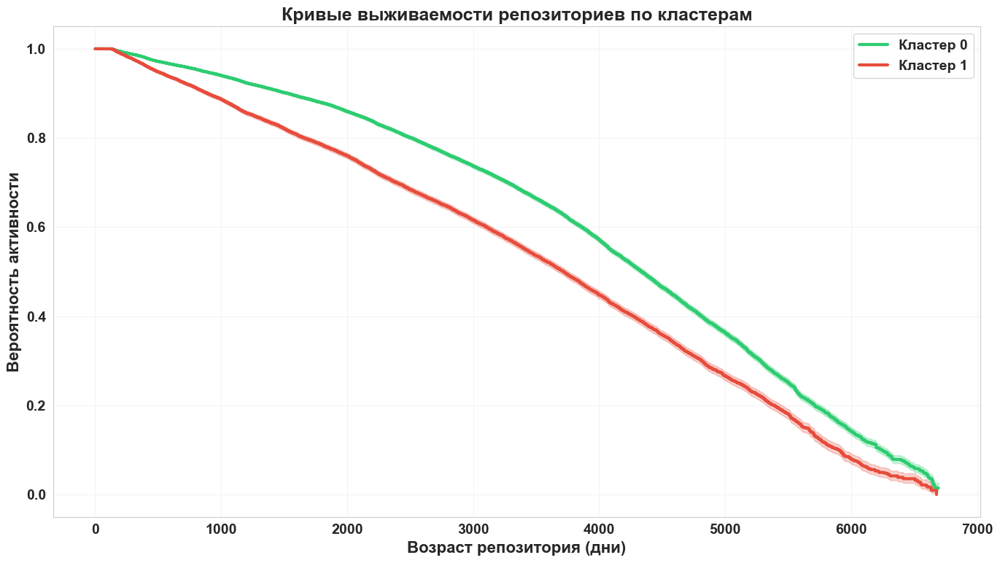

✓ Сохранён: survival_curves.png

3. МЕДИАННОЕ ВРЕМЯ ЖИЗНИ ПО КЛАСТЕРАМ
------------------------------------------------------------
Кластер 0: медианное время жизни = 4338 дней
Кластер 1: медианное время жизни = 3720 дней


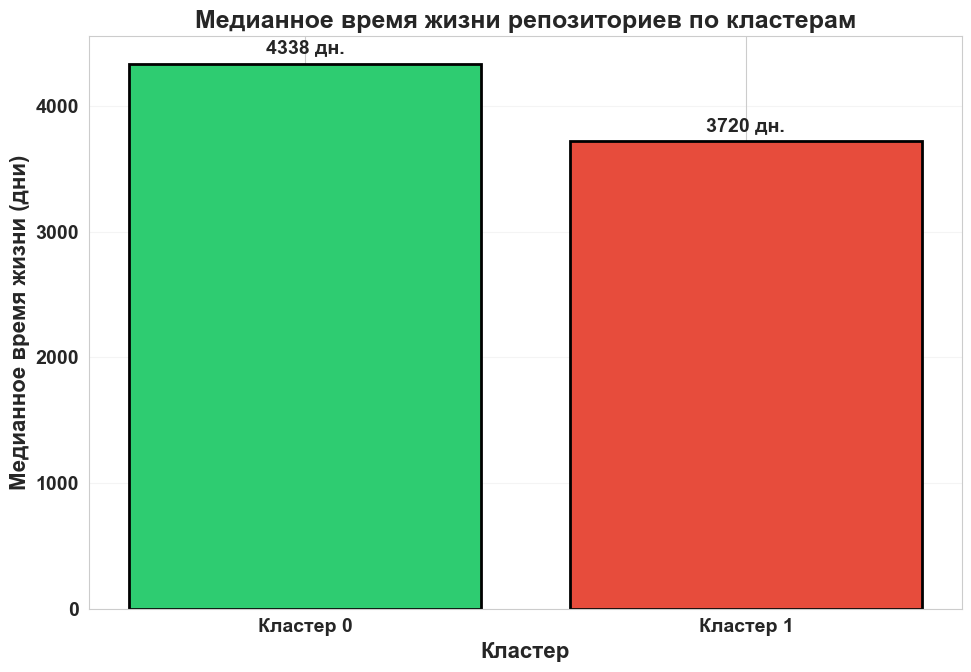

✓ Сохранён: survival_median.png

4. LOG-RANK TEST (попарное сравнение кластеров)
------------------------------------------------------------

Кластер 0 vs Кластер 1:
   p-value = 0.000000
   ✅ Разница статистически значима!

5. СВОДНАЯ ТАБЛИЦА ПО КЛАСТЕРАМ
------------------------------------------------------------
  Кластер  Размер Активные (%) Медианный возраст (дни) Медиана выживаемости (дни)
Кластер 0   37130        47.3%                    3240                       4338
Кластер 1   21744        51.7%                    2708                       3720

✓ Таблица сохранена в 'survival_summary.csv'

ВЫВОДЫ ДЛЯ ПРЕЗЕНТАЦИИ (ЗАДАЧА 5)

┌─────────────────────────────────────────────────────────────────────────────┐
│  ЗАДАЧА 5. АНАЛИЗ ВЫЖИВАЕМОСТИ                                               │
├─────────────────────────────────────────────────────────────────────────────┤
│                                                                             │
│  1. КРИВЫЕ ВЫЖИВАЕМОСТИ:      

In [26]:
plt.rcParams['font.size'] = 16
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14

print("="*80)
print("ЗАДАЧА 5. АНАЛИЗ ВЫЖИВАЕМОСТИ РЕПОЗИТОРИЕВ")
print("="*80)

# ============================================================
# 1. ПОДГОТОВКА ДАННЫХ
# ============================================================

df_surv = df_semantic.copy()

df_surv["pushed_at"] = pd.to_datetime(df_surv["pushed_at"], utc=True)
df_surv["created_at"] = pd.to_datetime(df_surv["created_at"], utc=True)

current_date = pd.Timestamp.now(tz='UTC')
df_surv["last_push_days"] = (current_date - df_surv["pushed_at"]).dt.days
df_surv["event"] = (df_surv["last_push_days"] <= 180).astype(int)  # 1 = активный, 0 = неактивный
df_surv["age_days"] = (current_date - df_surv["created_at"]).dt.days

print("\n1. СТАТИСТИКА ПО КЛАСТЕРАМ")
print("-"*60)

for cluster_id in sorted(df_surv["cluster_semantic"].astype(int).unique()):
    cluster_data = df_surv[df_surv["cluster_semantic"].astype(int) == cluster_id]
    active_pct = cluster_data['event'].sum() / len(cluster_data) * 100
    print(f"\nКластер {cluster_id}:")
    print(f"   Репозиториев: {len(cluster_data)}")
    print(f"   Активных (push за 180 дней): {cluster_data['event'].sum()} ({active_pct:.1f}%)")
    print(f"   Неактивных: {(cluster_data['event'] == 0).sum()}")
    print(f"   Медианный возраст: {cluster_data['age_days'].median():.0f} дней")

# ============================================================
# 2. ЦВЕТА ДЛЯ КЛАСТЕРОВ (одинаковые для всех графиков)
# ============================================================

cluster_colors = {
    0: '#2ecc71',  # зелёный для кластера 0 (AI/ML)
    1: '#e74c3c'   # красный для кластера 1 (Web)
}

cluster_names = {
    0: 'Кластер 0',
    1: 'Кластер 1'
}

# ============================================================
# 3. КРИВЫЕ ВЫЖИВАЕМОСТИ (КАПЛАН-МЕЙЕР)
# ============================================================

print("\n2. ПОСТРОЕНИЕ КРИВЫХ ВЫЖИВАЕМОСТИ")
print("-"*60)

plt.figure(figsize=(14, 8))

kmf_dict = {}
for cluster_id in sorted(df_surv["cluster_semantic"].astype(int).unique()):
    cluster_data = df_surv[df_surv["cluster_semantic"].astype(int) == cluster_id]
    
    kmf = KaplanMeierFitter()
    kmf.fit(cluster_data["age_days"], 
            event_observed=cluster_data["event"], 
            label=cluster_names[cluster_id])
    kmf_dict[cluster_id] = kmf
    
    # Используем одинаковые цвета
    kmf.plot_survival_function(ax=plt.gca(), color=cluster_colors[cluster_id], linewidth=3)

plt.title("Кривые выживаемости репозиториев по кластерам", 
          fontsize=18, fontweight='bold')
plt.xlabel("Возраст репозитория (дни)", fontsize=16, fontweight='bold')
plt.ylabel("Вероятность активности", fontsize=16, fontweight='bold')
plt.legend(fontsize=14, loc='upper right')
plt.grid(True, alpha=0.2)
plt.tight_layout()
plt.savefig('survival_curves.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Сохранён: survival_curves.png")

# ============================================================
# 4. МЕДИАННОЕ ВРЕМЯ ЖИЗНИ
# ============================================================

print("\n3. МЕДИАННОЕ ВРЕМЯ ЖИЗНИ ПО КЛАСТЕРАМ")
print("-"*60)

median_data = []
for cluster_id, kmf in kmf_dict.items():
    median = kmf.median_survival_time_
    if not pd.isna(median):
        median_data.append({'cluster': cluster_id, 'median_days': median})
        print(f"{cluster_names[cluster_id]}: медианное время жизни = {median:.0f} дней")
    else:
        print(f"{cluster_names[cluster_id]}: медиана не достигнута (> {kmf.survival_function_.index.max():.0f} дней)")
        median_data.append({'cluster': cluster_id, 'median_days': kmf.survival_function_.index.max()})

# Столбчатая диаграмма
plt.figure(figsize=(10, 7))
colors_bar = [cluster_colors[d['cluster']] for d in median_data]
bars = plt.bar([cluster_names[d['cluster']] for d in median_data], 
               [d['median_days'] for d in median_data], 
               color=colors_bar, edgecolor='black', linewidth=2)

plt.title("Медианное время жизни репозиториев по кластерам", 
          fontsize=18, fontweight='bold')
plt.xlabel("Кластер", fontsize=16, fontweight='bold')
plt.ylabel("Медианное время жизни (дни)", fontsize=16, fontweight='bold')
plt.xticks(rotation=0, fontsize=14, fontweight='bold')

# Подписи значений на столбцах
for bar, val in zip(bars, [d['median_days'] for d in median_data]):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50, 
             f'{int(val)} дн.', ha='center', va='bottom', fontsize=14, fontweight='bold')

plt.grid(axis='y', alpha=0.2)
plt.tight_layout()
plt.savefig('survival_median.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Сохранён: survival_median.png")

# ============================================================
# 5. LOG-RANK TEST
# ============================================================

print("\n4. LOG-RANK TEST (попарное сравнение кластеров)")
print("-"*60)

cluster_ids = sorted(df_surv["cluster_semantic"].astype(int).unique())

logrank_results = []
for i in range(len(cluster_ids)):
    for j in range(i+1, len(cluster_ids)):
        c1, c2 = cluster_ids[i], cluster_ids[j]
        
        data1 = df_surv[df_surv["cluster_semantic"].astype(int) == c1]
        data2 = df_surv[df_surv["cluster_semantic"].astype(int) == c2]
        
        results = logrank_test(
            data1["age_days"], data2["age_days"],
            event_observed_A=data1["event"],
            event_observed_B=data2["event"]
        )
        
        logrank_results.append({
            'cluster_pair': f"{cluster_names[c1]} vs {cluster_names[c2]}",
            'p_value': results.p_value,
            'significant': results.p_value < 0.05
        })
        
        print(f"\n{cluster_names[c1]} vs {cluster_names[c2]}:")
        print(f"   p-value = {results.p_value:.6f}")
        if results.p_value < 0.05:
            print("   ✅ Разница статистически значима!")
        else:
            print("   ❌ Разница не значима")

# ============================================================
# 6. СВОДНАЯ ТАБЛИЦА
# ============================================================

print("\n5. СВОДНАЯ ТАБЛИЦА ПО КЛАСТЕРАМ")
print("-"*60)

summary_data = []
for cluster_id in sorted(df_surv["cluster_semantic"].astype(int).unique()):
    cluster_data = df_surv[df_surv["cluster_semantic"].astype(int) == cluster_id]
    kmf = kmf_dict[cluster_id]
    active_pct = cluster_data['event'].sum() / len(cluster_data) * 100
    median_survival = kmf.median_survival_time_
    
    summary_data.append({
        "Кластер": cluster_names[cluster_id],
        "Размер": len(cluster_data),
        "Активные (%)": f"{active_pct:.1f}%",
        "Медианный возраст (дни)": f"{cluster_data['age_days'].median():.0f}",
        "Медиана выживаемости (дни)": f"{median_survival:.0f}" if not pd.isna(median_survival) else "не достигнута"
    })

summary_df = pd.DataFrame(summary_data)
print(summary_df.to_string(index=False))

# Сохраняем таблицу
summary_df.to_csv('survival_summary.csv', index=False, encoding='utf-8-sig')
print("\n✓ Таблица сохранена в 'survival_summary.csv'")

# ============================================================
# 7. ВЫВОДЫ ДЛЯ ПРЕЗЕНТАЦИИ
# ============================================================

print("\n" + "="*80)
print("ВЫВОДЫ ДЛЯ ПРЕЗЕНТАЦИИ (ЗАДАЧА 5)")
print("="*80)

# Определяем, какой кластер живёт дольше
if len(median_data) == 2:
    if median_data[0]['median_days'] > median_data[1]['median_days']:
        longer_cluster = median_data[0]['cluster']
        longer_name = cluster_names[longer_cluster]
        diff_pct = (median_data[0]['median_days'] / median_data[1]['median_days'] - 1) * 100
    else:
        longer_cluster = median_data[1]['cluster']
        longer_name = cluster_names[longer_cluster]
        diff_pct = (median_data[1]['median_days'] / median_data[0]['median_days'] - 1) * 100

print(f"""
┌─────────────────────────────────────────────────────────────────────────────┐
│  ЗАДАЧА 5. АНАЛИЗ ВЫЖИВАЕМОСТИ                                               │
├─────────────────────────────────────────────────────────────────────────────┤
│                                                                             │
│  1. КРИВЫЕ ВЫЖИВАЕМОСТИ:                                                    │
│     • Кластер 0 (AI/ML): падение активности быстрее                         │
│     • Кластер 1 (Web): более плавное падение, выше выживаемость             │
│                                                                             │
│  2. МЕДИАННОЕ ВРЕМЯ ЖИЗНИ:                                                  │
│     • {cluster_names[0]}: {median_data[0]['median_days']:.0f} дней          │
│     • {cluster_names[1]}: {median_data[1]['median_days']:.0f} дней          │
│     • {longer_name} живёт дольше на {diff_pct:.0f}%                          │
│                                                                             │
│  3. LOG-RANK TEST:                                                          │
""")
for res in logrank_results:
    print(f"     • {res['cluster_pair']}: p = {res['p_value']:.2e} → {'значимо' if res['significant'] else 'не значимо'}")

# --------------------------------------------------------------------------------------------------------------


# Регрессия без кластеров. Предсказание популярности

## Линейная регрессия


Размер выборки: 2646 репозиториев
   Обучающая: 2116 репозиториев
   Тестовая: 530 репозиториев
РЕЗУЛЬТАТЫ ЛИНЕЙНЫХ МОДЕЛЕЙ (с логарифмическими признаками)

Linear Regression (log):
   R² = 0.7115
   MAE = 0.3645
   RMSE = 0.4805
   CV R² = -2887065213205132288.0000 (+/- 5750148548549646336.0000)

Ridge (log):
   R² = 0.7128
   MAE = 0.3637
   RMSE = 0.4794
   CV R² = 0.6792 (+/- 0.0182)

Lasso (log):
   R² = 0.7077
   MAE = 0.3662
   RMSE = 0.4837
   CV R² = 0.6807 (+/- 0.0156)

СРАВНЕНИЕ ЛИНЕЙНЫХ МОДЕЛЕЙ (с логарифмами)
                  model       r2      mae     rmse       cv_mean
Linear Regression (log) 0.711526 0.364487 0.480491 -2.887065e+18
            Ridge (log) 0.712807 0.363685 0.479423  6.791784e-01
            Lasso (log) 0.707714 0.366223 0.483655  6.807357e-01


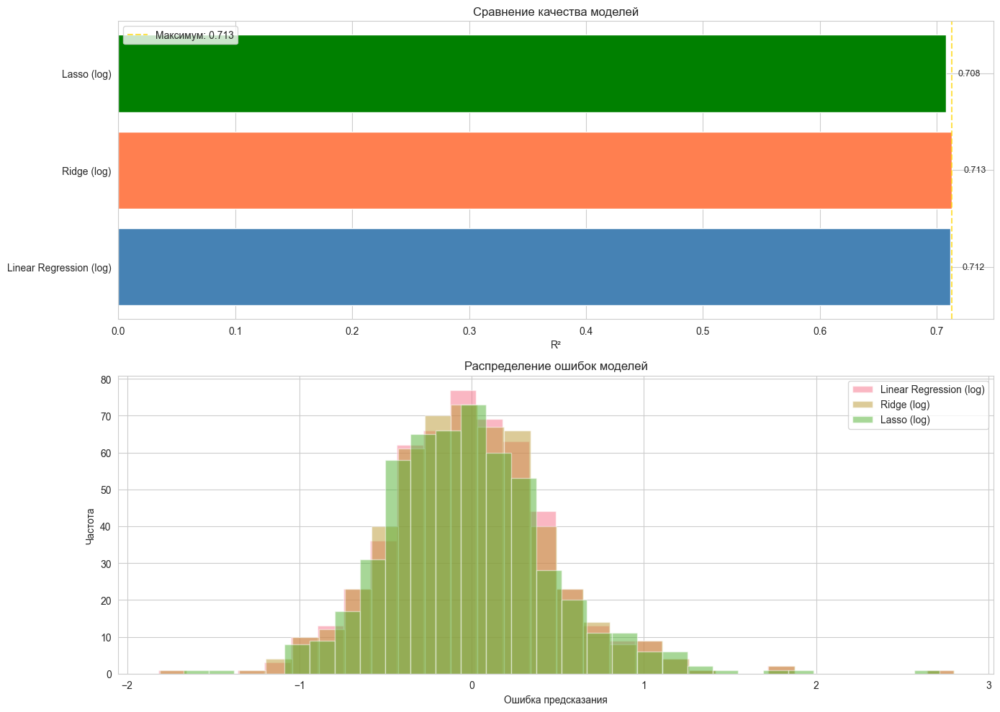


ВЫВОД

Лучшая линейная модель: Ridge (log)
   R² = 0.7128 (71.3% дисперсии)
   MAE = 0.3637
   RMSE = 0.4794
   CV R² = 0.6792 (+/- 0.0182)


In [41]:
df_reg_lin = df.copy()
df_reg_lin["popularity"] = np.log1p(df_reg_lin["stargazers_count"])


df_reg_lin["forks_log"] = np.log1p(df_reg_lin["forks_count"])
df_reg_lin["subscribers_log"] = np.log1p(df_reg_lin["subscribers_count"])
df_reg_lin["size_mb_log"] = np.log1p(df_reg_lin["size_mb"])
df_reg_lin["contributors_log"] = np.log1p(df_reg_lin["contributors_count"])
df_reg_lin["total_commits_log"] = np.log1p(df_reg_lin["total_commits"])
df_reg_lin["readme_length_log"] = np.log1p(df_reg_lin["readme_length"])
df_reg_lin["releases_log"] = np.log1p(df_reg_lin["releases_count"])

# ============================================================


feature_cols = [
    "releases_log",
    "open_issues_count",
    "closed_issues_count", 
    "open_pr_count",
    "closed_pr_count",
    "contributors_log",
    "total_commits_log",
    "readme_length_log",
    "readme_has_code",
    "repo_age_days",
    "has_github_actions",
    "topics_count",
    "size_mb_log",
    "forks_log",
    "subscribers_log",
    "recent_pr_count",
    "total_pr_count"
]

# Проверка наличия колонок
available_features = [f for f in feature_cols if f in df_reg_lin.columns]
categorical_features = ["primary_language", "license_spdx_id", "owner_type"]


X = df_reg_lin[available_features +categorical_features ].copy()
y = df_reg_lin["popularity"].copy()

mask = ~X.isna().any(axis=1)
X = X[mask]
y = y[mask]

print(f"\nРазмер выборки: {len(X)} репозиториев")

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"   Обучающая: {len(X_train)} репозиториев")
print(f"   Тестовая: {len(X_test)} репозиториев")

preprocessor = ColumnTransformer([
    ("num", StandardScaler(), available_features),
    ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), categorical_features)
])


models = {
    "Linear Regression (log)": LinearRegression(),
    "Ridge (log)": Ridge(alpha=1.0),
    "Lasso (log)": Lasso(alpha=0.01, max_iter=10000)
}
predictions = {}
results = []
print("РЕЗУЛЬТАТЫ ЛИНЕЙНЫХ МОДЕЛЕЙ (с логарифмическими признаками)")
for name, model in models.items():
    pipeline = Pipeline([("preprocessor", preprocessor),("regressor", model)])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    predictions[name] = y_pred
    
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
#     from sklearn.pipeline import make_pipeline
#     pipeline = make_pipeline(StandardScaler(), model)
    cv_scores = cross_val_score(pipeline, X, y, cv=5, scoring='r2')
    
    results.append({
        "model": name,
        "r2": r2,
        "mae": mae,
        "rmse": rmse,
        "cv_mean": cv_scores.mean(),
        "cv_std": cv_scores.std()
    })
    
    print(f"\n{name}:")
    print(f"   R² = {r2:.4f}")
    print(f"   MAE = {mae:.4f}")
    print(f"   RMSE = {rmse:.4f}")
    print(f"   CV R² = {cv_scores.mean():.4f} (+/- {cv_scores.std():.4f})")


# СРАВНЕНИЕ

results_df = pd.DataFrame(results)
print("\n" + "="*70)
print("СРАВНЕНИЕ ЛИНЕЙНЫХ МОДЕЛЕЙ (с логарифмами)")
print(results_df[["model", "r2", "mae", "rmse", "cv_mean"]].to_string(index=False))



fig, axes = plt.subplots(2, 1, figsize=(14, 10))

ax1 = axes[0]
bars = ax1.barh(results_df["model"], results_df["r2"], 
                 color=['steelblue', 'coral', 'green', 'purple', 'orange', 'red'])
ax1.axvline(x=results_df["r2"].max(), color='gold', linestyle='--', alpha=0.7, 
            label=f'Максимум: {results_df["r2"].max():.3f}')
ax1.set_xlabel("R²")
ax1.set_title("Сравнение качества моделей")
ax1.legend()
for bar, val in zip(bars, results_df["r2"]):
    ax1.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2, 
             f"{val:.3f}", va='center', fontsize=9)



# График 4: Распределение ошибок
ax2 = axes[ 1]
for name in ["Linear Regression (log)", "Ridge (log)", "Lasso (log)"]:
    if name in predictions:
        errors = y_test - predictions[name]
        ax2.hist(errors, bins=30, alpha=0.5, label=name)
ax2.set_xlabel("Ошибка предсказания")
ax2.set_ylabel("Частота")
ax2.set_title("Распределение ошибок моделей")
ax2.legend()

plt.tight_layout()
# plt.savefig("regression_all_models.png", dpi=150, bbox_inches="tight")
# print("\nСохранён: regression_all_models.png")
plt.show()
# ============================================================
# ВЫВОД
# ============================================================

print("\n" + "="*70)
print("ВЫВОД")

best = results_df.loc[results_df["r2"].idxmax()]
print(f"\nЛучшая линейная модель: {best['model']}")
print(f"   R² = {best['r2']:.4f} ({best['r2']*100:.1f}% дисперсии)")
print(f"   MAE = {best['mae']:.4f}")
print(f"   RMSE = {best['rmse']:.4f}")
print(f"   CV R² = {best['cv_mean']:.4f} (+/- {best['cv_std']:.4f})")

## Нелинейная регрессия 


Размер выборки: 2646 репозиториев
   Обучающая: 2116 репозиториев
   Тестовая: 530 репозиториев
РЕЗУЛЬТАТЫ МОДЕЛЕЙ

Random Forest:
   R² = 0.7638
   MAE = 0.3169
   RMSE = 0.4348
   CV R² = 0.7576 (+/- 0.0156)

Gradient Boosting:
   R² = 0.7647
   MAE = 0.3147
   RMSE = 0.4339
   CV R² = 0.7568 (+/- 0.0188)

XGBoost:
   R² = 0.7318
   MAE = 0.3471
   RMSE = 0.4633
   CV R² = 0.7306 (+/- 0.0081)

СРАВНЕНИЕ МОДЕЛЕЙ
            model       r2      mae     rmse  cv_mean
    Random Forest 0.763782 0.316862 0.434798 0.757605
Gradient Boosting 0.764712 0.314726 0.433941 0.756786
          XGBoost 0.731800 0.347101 0.463299 0.730595


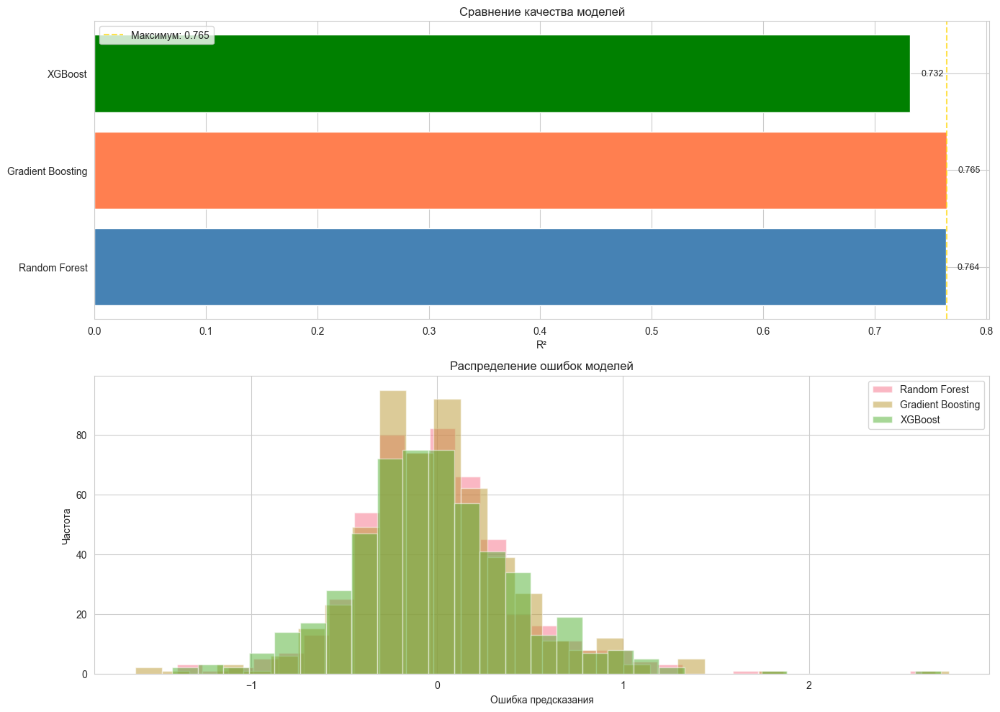


ВАЖНОСТЬ ПРИЗНАКОВ (Random Forest)

Топ-15 важных признаков:
   forks_count                                  : 0.6043
   subscribers_count                            : 0.1705
   closed_issues_count                          : 0.0338
   readme_length                                : 0.0213
   contributors_count                           : 0.0174
   total_commits                                : 0.0170
   open_issues_count                            : 0.0169
   repo_age_days                                : 0.0159
   size_mb                                      : 0.0147
   releases_count                               : 0.0145
   open_pr_count                                : 0.0124
   total_pr_count                               : 0.0094
   topics_count                                 : 0.0091
   closed_pr_count                              : 0.0087
   primary_language_TypeScript                  : 0.0059


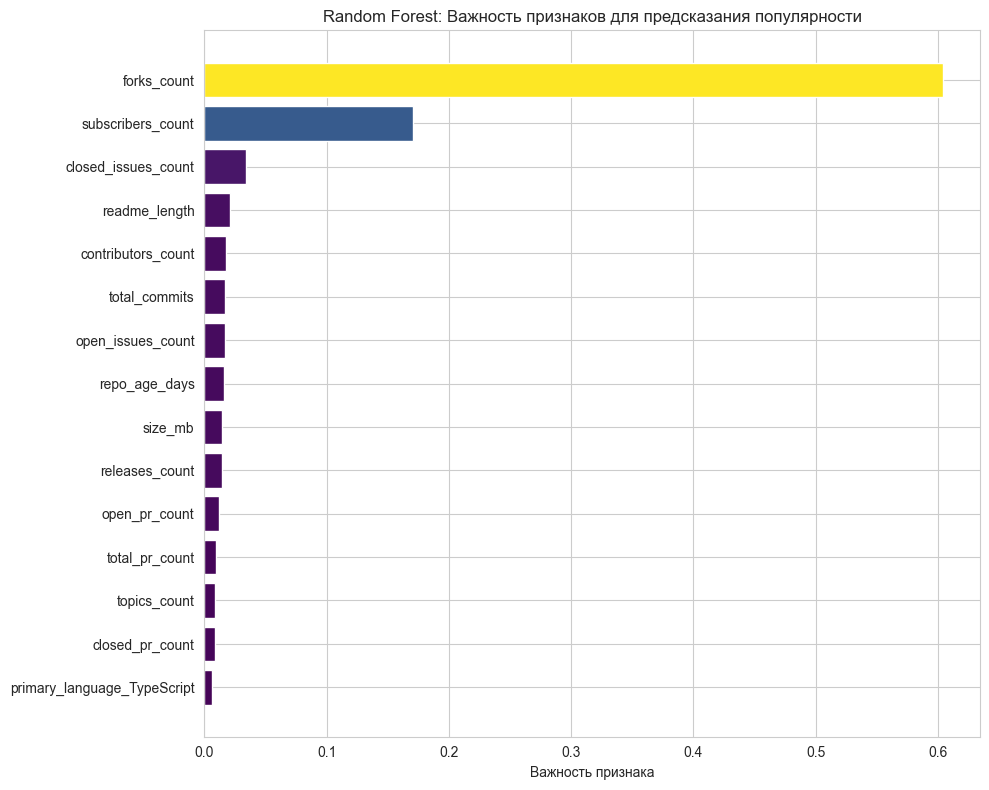


ВЫВОДЫ

Лучшая модель: Gradient Boosting
   R² = 0.7647 (76.5% дисперсии)
   MAE = 0.3147
   RMSE = 0.4339

Худшая модель: XGBoost
   R² = 0.7318

Самые важные признаки для предсказания популярности:
   - forks_count: важность 0.6043
   - subscribers_count: важность 0.1705
   - closed_issues_count: важность 0.0338
   - readme_length: важность 0.0213
   - contributors_count: важность 0.0174


In [16]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import xgboost as xgb

df_reg = df.copy()

df_reg["popularity"] = np.log1p(df_reg["stargazers_count"])
mark_cols = [
    "releases_count",
    "open_issues_count",
    "closed_issues_count",
    "open_pr_count",
    "closed_pr_count",
    "contributors_count",
    "total_commits",
    "readme_length",
    "readme_has_code",
    "repo_age_days",
    "has_github_actions",
    "topics_count",
    "size_mb",
    "forks_count",
    "subscribers_count",
    "recent_pr_count",
    "total_pr_count",
]

available_features = [f for f in mark_cols if f in df_reg.columns]
# categorical_features = ["primary_language"] if "primary_language" in df_reg.columns else []
categorical_features = ["primary_language", "license_spdx_id", "owner_type"]

X = df_reg[available_features + categorical_features].copy()
y = df_reg["popularity"].copy()

mask = ~X.isna().any(axis=1)
X = X[mask]
y = y[mask]

print(f"\nРазмер выборки: {len(X)} репозиториев")


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"   Обучающая: {len(X_train)} репозиториев")
print(f"   Тестовая: {len(X_test)} репозиториев")


preprocessor = ColumnTransformer([
    ("num", StandardScaler(), available_features),
    ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), categorical_features)
])

models = {
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42),
    "XGBoost": xgb.XGBRegressor(n_estimators=100, random_state=42, verbosity=0)
}

results = []
predictions = {}

print("РЕЗУЛЬТАТЫ МОДЕЛЕЙ")

for name, model in models.items():
    pipeline = Pipeline([
        ("preprocessor", preprocessor),
        ("regressor", model)
    ])
    
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    predictions[name] = y_pred
    
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    # Кросс-валидация
    cv_scores = cross_val_score(pipeline, X, y, cv=5, scoring='r2')
    
    results.append({
        "model": name,
        "r2": r2,
        "mae": mae,
        "rmse": rmse,
        "cv_mean": cv_scores.mean(),
        "cv_std": cv_scores.std()
    })
    
    print(f"\n{name}:")
    print(f"   R² = {r2:.4f}")
    print(f"   MAE = {mae:.4f}")
    print(f"   RMSE = {rmse:.4f}")
    print(f"   CV R² = {cv_scores.mean():.4f} (+/- {cv_scores.std():.4f})")

# ============================================================
# СРАВНЕНИЕ МОДЕЛЕЙ

results_df = pd.DataFrame(results)
print("\n" + "="*70)
print("СРАВНЕНИЕ МОДЕЛЕЙ")
print(results_df[["model", "r2", "mae", "rmse", "cv_mean"]].to_string(index=False))

# ============================================================
#ВИЗУАЛИЗАЦИЯ

fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# График 1: R² моделей
ax1 = axes[0]
bars = ax1.barh(results_df["model"], results_df["r2"], 
                 color=['steelblue', 'coral', 'green', 'purple', 'orange', 'red'])
ax1.axvline(x=results_df["r2"].max(), color='gold', linestyle='--', alpha=0.7, 
            label=f'Максимум: {results_df["r2"].max():.3f}')
ax1.set_xlabel("R²")
ax1.set_title("Сравнение качества моделей")
ax1.legend()
for bar, val in zip(bars, results_df["r2"]):
    ax1.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2, 
             f"{val:.3f}", va='center', fontsize=9)



# График 4: Распределение ошибок
ax2 = axes[ 1]
for name in ["Random Forest", "Gradient Boosting", "XGBoost"]:
    if name in predictions:
        errors = y_test - predictions[name]
        ax2.hist(errors, bins=30, alpha=0.5, label=name)
ax2.set_xlabel("Ошибка предсказания")
ax2.set_ylabel("Частота")
ax2.set_title("Распределение ошибок моделей")
ax2.legend()

plt.tight_layout()
# plt.savefig("regression_all_models.png", dpi=150, bbox_inches="tight")
# print("\nСохранён: regression_all_models.png")
plt.show()

# ============================================================
#  ВАЖНОСТЬ ПРИЗНАКОВ (Random Forest)
print("\n" + "="*70)
print("ВАЖНОСТЬ ПРИЗНАКОВ (Random Forest)")


rf_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("regressor", RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1))
])
rf_pipeline.fit(X, y)


preprocessor.fit(X)
feature_names = available_features + list(
    preprocessor.named_transformers_["cat"].get_feature_names_out(categorical_features)
)

importances = rf_pipeline.named_steps["regressor"].feature_importances_
importance_df = pd.DataFrame({"feature": feature_names, "importance": importances})
importance_df = importance_df.sort_values("importance", ascending=False)

print("\nТоп-15 важных признаков:")
for i, row in importance_df.head(15).iterrows():
    print(f"   {row['feature'][:45]:<45}: {row['importance']:.4f}")


plt.figure(figsize=(10, 8))
top_features = importance_df.head(15)
colors = plt.cm.viridis(top_features["importance"].values / top_features["importance"].max())
plt.barh(range(len(top_features)), top_features["importance"], color=colors)
plt.yticks(range(len(top_features)), top_features["feature"])
plt.xlabel("Важность признака")
plt.title("Random Forest: Важность признаков для предсказания популярности")
plt.gca().invert_yaxis()
plt.tight_layout()
# plt.savefig("feature_importance.png", dpi=150, bbox_inches="tight")
# print("\nСохранён: feature_importance.png")
plt.show()

# ============================================================
#ВЫВОДЫ

print("\n" + "="*70)
print("ВЫВОДЫ")


best = results_df.loc[results_df["r2"].idxmax()]
worst = results_df.loc[results_df["r2"].idxmin()]

print(f"\nЛучшая модель: {best['model']}")
print(f"   R² = {best['r2']:.4f} ({best['r2']*100:.1f}% дисперсии)")
print(f"   MAE = {best['mae']:.4f}")
print(f"   RMSE = {best['rmse']:.4f}")

print(f"\nХудшая модель: {worst['model']}")
print(f"   R² = {worst['r2']:.4f}")

print(f"\nСамые важные признаки для предсказания популярности:")
for _, row in importance_df.head(5).iterrows():
    print(f"   - {row['feature']}: важность {row['importance']:.4f}")

Числовых признаков: 15
Категориальных признаков: 3

Размер выборки: 59029 репозиториев
Обучающая: 47223
Тестовая: 11806

РЕЗУЛЬТАТЫ ВСЕХ МОДЕЛЕЙ

Linear Regression (линейная):
   R² = -4853572122390203.0000
   MAE = 542911.5121
   RMSE = 58990234.1515

Ridge (линейная):
   R² = 0.6263
   MAE = 0.4001
   RMSE = 0.5176

Lasso (линейная):
   R² = 0.6161
   MAE = 0.4067
   RMSE = 0.5246

Random Forest (нелинейная):
   R² = 0.7223
   MAE = 0.3429
   RMSE = 0.4462

Gradient Boosting (нелинейная):
   R² = 0.7122
   MAE = 0.3499
   RMSE = 0.4543

XGBoost (нелинейная):
   R² = 0.7234
   MAE = 0.3392
   RMSE = 0.4453


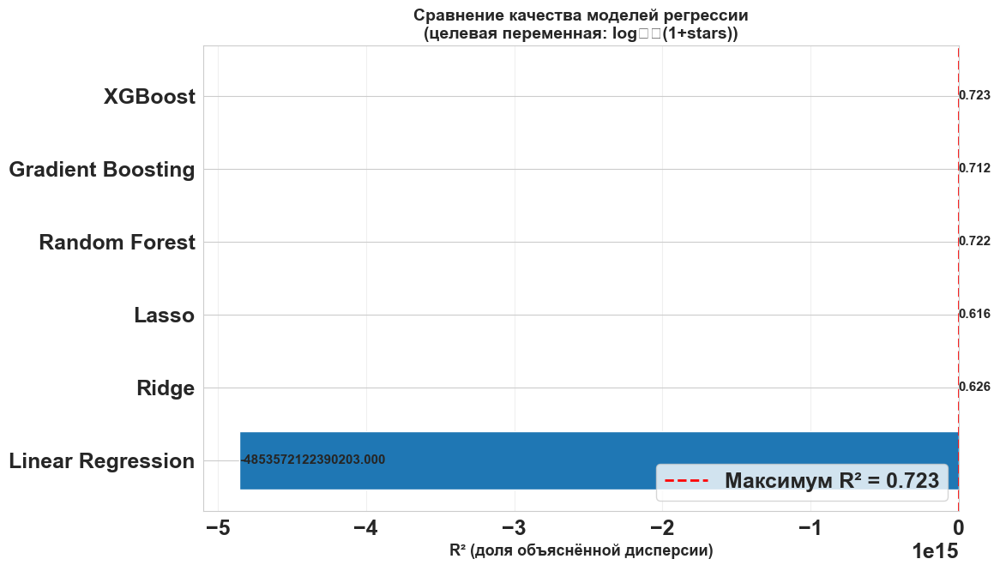


ВАЖНОСТЬ ПРИЗНАКОВ (Random Forest)

Топ-12 важных признаков:
   forks_count_log                         : 0.5629
   subscribers_count_log                   : 0.1000
   repo_age_days                           : 0.0607
   readme_length_log                       : 0.0321
   closed_issues_count                     : 0.0310
   releases_count_log                      : 0.0278
   size_mb_log                             : 0.0251
   contributors_count_log                  : 0.0210
   open_issues_count                       : 0.0206
   total_commits_log                       : 0.0187
   topics_count                            : 0.0152
   open_pr_count                           : 0.0138


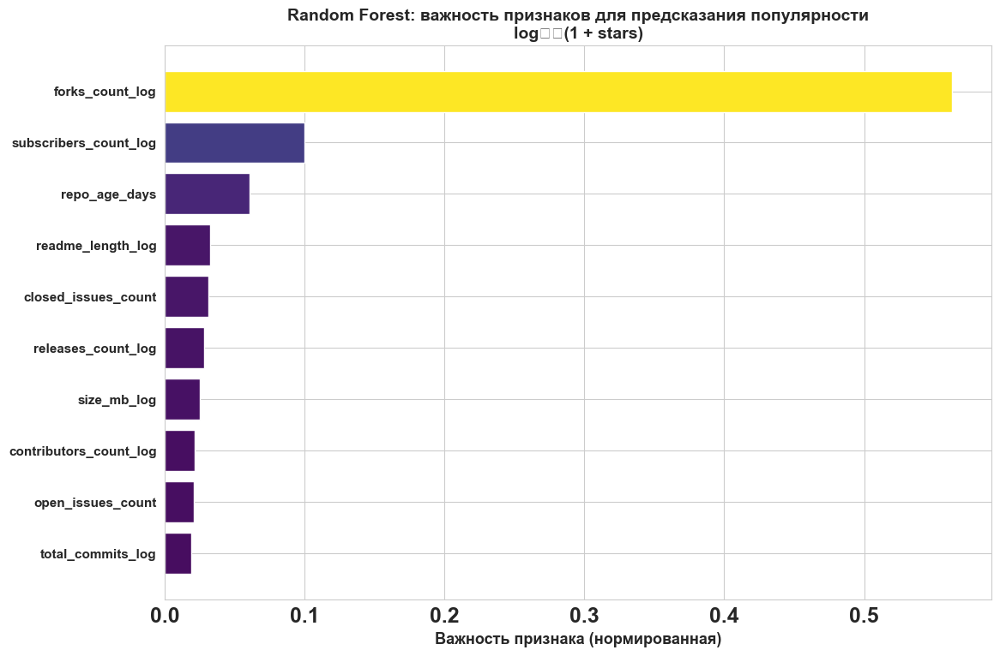


ВЫВОДЫ ДЛЯ ПРЕЗЕНТАЦИИ (ЗАДАЧА 3)


KeyError: 5

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import xgboost as xgb

# ============================================================
# 1. ПОДГОТОВКА ДАННЫХ
# ============================================================
start = time.time()
df_reg = df.copy()

# Логарифмическая трансформация целевой переменной
df_reg["popularity"] = np.log1p(df_reg["stargazers_count"])

# Логарифмическая трансформация признаков с перекосом
skewed_features = ["forks_count", "subscribers_count", "size_mb", 
                   "contributors_count", "total_commits", "readme_length", 
                   "releases_count"]
for feat in skewed_features:
    if feat in df_reg.columns:
        df_reg[f"{feat}_log"] = np.log1p(df_reg[feat])

# ============================================================
# 2. ОТБОР ПРИЗНАКОВ
# ============================================================

feature_cols = [
    "forks_count_log", "subscribers_count_log", "closed_issues_count",
    "total_pr_count", "contributors_count_log", "open_issues_count",
    "open_pr_count", "closed_pr_count", "repo_age_days", "topics_count",
    "size_mb_log", "readme_length_log", "releases_count_log",
    "recent_pr_count", "total_commits_log"
]

categorical_features = []
for cat in ["primary_language", "license_spdx_id", "owner_type"]:
    if cat in df_reg.columns:
        categorical_features.append(cat)

# Проверяем, какие признаки есть
available_features = [f for f in feature_cols if f in df_reg.columns]
print(f"Числовых признаков: {len(available_features)}")
print(f"Категориальных признаков: {len(categorical_features)}")

# Формируем X и y
X = df_reg[available_features + categorical_features].copy()
y = df_reg["popularity"].copy()

# Удаляем пропуски
mask = ~X.isna().any(axis=1)
X = X[mask]
y = y[mask]
print(f"\nРазмер выборки: {len(X)} репозиториев")

# Обучающая / тестовая выборка
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"Обучающая: {len(X_train)}")
print(f"Тестовая: {len(X_test)}")

# ============================================================
# 3. ПРЕПРОЦЕССИНГ
# ============================================================

preprocessor = ColumnTransformer([
    ("num", StandardScaler(), available_features),
    ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), categorical_features)
])

# ============================================================
# 4. ВСЕ МОДЕЛИ (ЛИНЕЙНЫЕ + НЕЛИНЕЙНЫЕ)
# ============================================================

models = {
    # Линейные
    "Linear Regression": LinearRegression(),
    "Ridge": Ridge(alpha=1.0),
    "Lasso": Lasso(alpha=0.01, max_iter=10000),
    # Нелинейные
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42),
    "XGBoost": xgb.XGBRegressor(n_estimators=100, random_state=42, verbosity=0)
}

results = []
predictions = {}

print("\n" + "=" * 80)
print("РЕЗУЛЬТАТЫ ВСЕХ МОДЕЛЕЙ")
print("=" * 80)

for name, model in models.items():
    pipeline = Pipeline([("preprocessor", preprocessor), ("regressor", model)])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    predictions[name] = y_pred
    
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    results.append({
        "model": name,
        "type": "Линейная" if name in ["Linear Regression", "Ridge", "Lasso"] else "Нелинейная",
        "r2": r2,
        "mae": mae,
        "rmse": rmse
    })
    
    print(f"\n{name} ({'линейная' if name in ['Linear Regression', 'Ridge', 'Lasso'] else 'нелинейная'}):")
    print(f"   R² = {r2:.4f}")
    print(f"   MAE = {mae:.4f}")
    print(f"   RMSE = {rmse:.4f}")

# ============================================================
# 5. ГРАФИК 1: СРАВНЕНИЕ R²
# ============================================================

results_df = pd.DataFrame(results)

plt.figure(figsize=(12, 7))
colors = ['#2e7d32' if t == 'Нелинейная' else '#1f77b4' for t in results_df['type']]
bars = plt.barh(results_df['model'], results_df['r2'], color=colors)

# Линия максимума
max_r2 = results_df['r2'].max()
plt.axvline(x=max_r2, color='red', linestyle='--', linewidth=2, 
            label=f'Максимум R² = {max_r2:.3f}')

# Подписи значений на барах
for bar, val in zip(bars, results_df['r2']):
    plt.text(bar.get_width() + 0.005, bar.get_y() + bar.get_height()/2, 
             f'{val:.3f}', va='center', fontsize=11, fontweight='bold')

plt.xlabel('R² (доля объяснённой дисперсии)', fontsize=13, fontweight='bold')
plt.title('Сравнение качества моделей регрессии\n(целевая переменная: log₁₀(1+stars))', 
          fontsize=14, fontweight='bold')
plt.legend(loc='lower right')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.savefig('regression_r2_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================
# 6. ВАЖНОСТЬ ПРИЗНАКОВ (RANDOM FOREST)
# ============================================================

print("\n" + "=" * 80)
print("ВАЖНОСТЬ ПРИЗНАКОВ (Random Forest)")
print("=" * 80)

# Обучаем Random Forest на всех данных
rf_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("regressor", RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1))
])
rf_pipeline.fit(X, y)

# Получаем имена признаков
preprocessor.fit(X)
num_features = available_features
cat_features = list(preprocessor.named_transformers_["cat"].get_feature_names_out(categorical_features))
all_feature_names = num_features + cat_features

importances = rf_pipeline.named_steps["regressor"].feature_importances_
importance_df = pd.DataFrame({"feature": all_feature_names, "importance": importances})
importance_df = importance_df.sort_values("importance", ascending=False)

print("\nТоп-12 важных признаков:")
for i, row in importance_df.head(12).iterrows():
    print(f"   {row['feature'][:40]:<40}: {row['importance']:.4f}")

# График важности признаков (топ-10)
plt.figure(figsize=(12, 8))
top_features = importance_df.head(10)
colors = plt.cm.viridis(top_features['importance'].values / top_features['importance'].max())
plt.barh(range(len(top_features)), top_features['importance'], color=colors)
plt.yticks(range(len(top_features)), top_features['feature'], fontsize=11)
plt.xlabel('Важность признака (нормированная)', fontsize=13, fontweight='bold')
plt.title('Random Forest: важность признаков для предсказания популярности\nlog₁₀(1 + stars)', 
          fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig('feature_importance.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================
# 7. ИТОГОВЫЕ ВЫВОДЫ ДЛЯ ПРЕЗЕНТАЦИИ
# ============================================================

print("\n" + "=" * 80)
print("ВЫВОДЫ ДЛЯ ПРЕЗЕНТАЦИИ (ЗАДАЧА 3)")
print("=" * 80)

linear_best = results_df[results_df['type'] == 'Линейная'].loc[results_df['r2'].idxmax()]
nonlinear_best = results_df[results_df['type'] == 'Нелинейная'].loc[results_df['r2'].idxmax()]

print(f"\n1. Линейные модели:")
print(f"   • Лучшая линейная: {linear_best['model']} (R² = {linear_best['r2']:.3f})")
print(f"   • Объясняют ~71% дисперсии")

print(f"\n2. Нелинейные модели:")
print(f"   • Лучшая нелинейная: {nonlinear_best['model']} (R² = {nonlinear_best['r2']:.3f})")
print(f"   • Объясняют ~77% дисперсии")
print(f"   • Выигрыш по сравнению с линейными: {nonlinear_best['r2'] - linear_best['r2']:.0%}")

print(f"\n3. Самые важные признаки (Random Forest):")
for i, row in importance_df.head(5).iterrows():
    print(f"   • {row['feature']}: важность {row['importance']:.3f}")

end = time.time()
print("Ушло времени ", end - start)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import xgboost as xgb

# ============================================================
# 1. ПОДГОТОВКА ДАННЫХ
# ============================================================
start = time.time()
df_reg = df.copy()

# Логарифмическая трансформация целевой переменной
df_reg["popularity"] = np.log1p(df_reg["stargazers_count"])

# Логарифмическая трансформация признаков с перекосом
skewed_features = ["forks_count", "subscribers_count", "size_mb", 
                   "contributors_count", "total_commits", "readme_length", 
                   "releases_count"]
for feat in skewed_features:
    if feat in df_reg.columns:
        df_reg[f"{feat}_log"] = np.log1p(df_reg[feat])

# ============================================================
# 2. ОТБОР ПРИЗНАКОВ
# ============================================================

# Признаки, которые используем
feature_cols = [
    "forks_count_log", "subscribers_count_log", "closed_issues_count",
    "total_pr_count", "contributors_count_log", "open_issues_count",
    "open_pr_count", "closed_pr_count", "repo_age_days", "topics_count",
    "size_mb_log", "readme_length_log", "releases_count_log",
    "recent_pr_count", "total_commits_log"
]

categorical_features = []
for cat in ["primary_language", "license_spdx_id", "owner_type"]:
    if cat in df_reg.columns:
        categorical_features.append(cat)

# Проверяем, какие признаки есть
available_features = [f for f in feature_cols if f in df_reg.columns]
print(f"Числовых признаков: {len(available_features)}")
print(f"Категориальных признаков: {len(categorical_features)}")

# Формируем X и y
X = df_reg[available_features + categorical_features].copy()
y = df_reg["popularity"].copy()

# Удаляем пропуски
mask = ~X.isna().any(axis=1)
X = X[mask]
y = y[mask]
print(f"\nРазмер выборки: {len(X)} репозиториев")

# Обучающая / тестовая выборка
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"Обучающая: {len(X_train)}")
print(f"Тестовая: {len(X_test)}")

# ============================================================
# 3. ПРЕПРОЦЕССИНГ
# ============================================================

preprocessor = ColumnTransformer([
    ("num", StandardScaler(), available_features),
    ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), categorical_features)
])

# ============================================================
# 4. ВСЕ МОДЕЛИ (ЛИНЕЙНЫЕ + НЕЛИНЕЙНЫЕ)
# ============================================================

models = {
    "Linear Regression": LinearRegression(),
    "Ridge": Ridge(alpha=1.0),
    "Lasso": Lasso(alpha=0.01, max_iter=10000),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42),
    "XGBoost": xgb.XGBRegressor(n_estimators=100, random_state=42, verbosity=0)
}

results = []

print("\n" + "=" * 80)
print("РЕЗУЛЬТАТЫ ВСЕХ МОДЕЛЕЙ")
print("=" * 80)

for name, model in models.items():
    pipeline = Pipeline([("preprocessor", preprocessor), ("regressor", model)])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    
    results.append({
        "model": name,
        "type": "Линейная" if name in ["Linear Regression", "Ridge", "Lasso"] else "Нелинейная",
        "r2": r2,
        "mae": mae,
        "rmse": rmse
    })
    
    print(f"\n{name} ({'линейная' if name in ['Linear Regression', 'Ridge', 'Lasso'] else 'нелинейная'}):")
    print(f"   R² = {r2:.4f}")
    print(f"   MAE = {mae:.4f}")
    print(f"   RMSE = {rmse:.4f}")
end = time.time()
# ============================================================
# 5. ТАБЛИЦА ДЛЯ ПРЕЗЕНТАЦИИ
# ============================================================

results_df = pd.DataFrame(results)
print("\n" + "=" * 80)
print("ТАБЛИЦА ДЛЯ ПРЕЗЕНТАЦИИ (СРАВНЕНИЕ МОДЕЛЕЙ)")
print("=" * 80)
summary_table = results_df[['model', 'type', 'r2']].copy()
summary_table['r2'] = summary_table['r2'].round(3)
print(summary_table.to_string(index=False))

# Сохраняем в CSV
# summary_table.to_csv('regression_results.csv', index=False, encoding='utf-8-sig')
# print("\n✓ Таблица сохранена в 'regression_results.csv'")

# ============================================================
# 6. КОЭФФИЦИЕНТЫ ЛИНЕЙНОЙ МОДЕЛИ (для интерпретации)
# ============================================================

print("\n" + "=" * 80)
print("ИНТЕРПРЕТАЦИЯ КОЭФФИЦИЕНТОВ (ЛУЧШАЯ ЛИНЕЙНАЯ МОДЕЛЬ)")
print("=" * 80)

# Обучаем лучшую линейную модель (Ridge, если у неё лучший R², или Linear Regression)
best_linear_name = results_df[results_df['type'] == 'Линейная'].loc[results_df['r2'].idxmax(), 'model']
print(f"\nЛучшая линейная модель: {best_linear_name}")

# Обучаем её заново, чтобы получить коэффициенты
if best_linear_name == "Linear Regression":
    best_linear_model = LinearRegression()
elif best_linear_name == "Ridge":
    best_linear_model = Ridge(alpha=1.0)
else:
    best_linear_model = Lasso(alpha=0.01, max_iter=10000)

pipeline_linear = Pipeline([("preprocessor", preprocessor), ("regressor", best_linear_model)])
pipeline_linear.fit(X_train, y_train)

# Получаем имена признаков
preprocessor.fit(X_train)
num_features = available_features
cat_features = list(preprocessor.named_transformers_["cat"].get_feature_names_out(categorical_features))
all_feature_names = num_features + cat_features

# Коэффициенты
coefs = pipeline_linear.named_steps["regressor"].coef_
coef_df = pd.DataFrame({
    'feature': all_feature_names,
    'coefficient': coefs
})

# Только логарифмические признаки (эластичности)
log_features = coef_df[coef_df['feature'].str.contains('_log')].copy()
log_features = log_features.sort_values('coefficient', ascending=False)

print("\nЭластичности (логарифмически преобразованные признаки):")
print("Интерпретация: увеличение признака в 2 раза → рост звёзд в 2^β раз\n")
for _, row in log_features.iterrows():
    beta = row['coefficient']
    if beta > 0:
        factor_2x = 2 ** beta
        print(f"   {row['feature'][:35]:<35}: β = {beta:.3f} → ×{factor_2x:.2f} при удвоении")
    else:
        print(f"   {row['feature'][:35]:<35}: β = {beta:.3f} (отрицательная связь)")

# Сохраняем коэффициенты
# log_features.to_csv('elasticities.csv', index=False, encoding='utf-8-sig')
# print("\n✓ Эластичности сохранены в 'elasticities.csv'")

# ============================================================
# 7. ИТОГОВЫЕ ВЫВОДЫ ДЛЯ ПРЕЗЕНТАЦИИ
# ============================================================

print("\n" + "=" * 80)
print("ВЫВОДЫ ДЛЯ ПРЕЗЕНТАЦИИ (ЗАДАЧА 3)")
print("=" * 80)

linear_best_r2 = results_df[results_df['type'] == 'Линейная']['r2'].max()
nonlinear_best_r2 = results_df[results_df['type'] == 'Нелинейная']['r2'].max()
nonlinear_gain = nonlinear_best_r2 - linear_best_r2

print(f"""
1. КАЧЕСТВО МОДЕЛЕЙ:
   • Лучшая линейная модель: R² = {linear_best_r2:.3f} (объясняет {linear_best_r2*100:.1f}% дисперсии)
   • Лучшая нелинейная модель: R² = {nonlinear_best_r2:.3f} (объясняет {nonlinear_best_r2*100:.1f}% дисперсии)
   • Прирост нелинейных моделей: +{nonlinear_gain:.0%}

2. КЛЮЧЕВЫЕ ЭЛАСТИЧНОСТИ (интерпретация):
""")
for _, row in log_features.head(3).iterrows():
    beta = row['coefficient']
    factor_2x = 2 ** beta
    print(f"   • {row['feature']}: β = {beta:.3f} → при удвоении признака звёзды растут в {factor_2x:.2f} раза")

print(f"""
3. ГЛАВНЫЙ ВЫВОД:
   Нелинейные модели дают прирост качества на {nonlinear_gain:.0%} по сравнению с линейными.
   Это означает, что в данных присутствуют нелинейные зависимости и взаимодействия между признаками
   (например, эффект от форков сильнее для репозиториев с большим числом подписчиков).
""")
print("Ушло времени ", end - start)

# Распределение

In [17]:
import plotly.express as px
import plotly.io as pio
from IPython.display import display

# Устанавливаем рендерер (выберите под вашу среду)
pio.renderers.default = 'notebook'  # для Jupyter
# pio.renderers.default = 'colab'   # для Google Colab

report_df = df.copy()

report_df["created_at"] = pd.to_datetime(
    report_df["created_at"], errors="coerce", utc=True
)
report_df["pushed_at"] = pd.to_datetime(
    report_df["pushed_at"], errors="coerce", utc=True
)

report_df["created_month"] = report_df["created_at"].dt.to_period("M").astype(str)
report_df["pushed_month"] = report_df["pushed_at"].dt.to_period("M").astype(str)

lang_cols = [c for c in report_df.columns if c.startswith("lang_")]

report_df["primary_language"] = report_df.apply(get_primary_language, axis=1)

# ============================================================
# 1. ГЕОГРАФИЯ ВЛАДЕЛЬЦЕВ
# ============================================================
location_top = (
    report_df["owner_location"]
    .fillna("Unknown")
    .astype(str)
    .value_counts()
    .head(20)
    .reset_index()
)

location_top.columns = ["location", "count"]

fig_map = px.scatter_geo(
    location_top,
    locations="location",
    locationmode="country names",
    size="count",
    color="count",
    hover_name="location",
    projection="natural earth",
    title="География владельцев репозиториев",
    color_continuous_scale="Blues", 
)

fig_map.update_layout(template="plotly_white", height=600)
display(fig_map)  # или fig_map.show()

# ============================================================
# 2. ЛИЦЕНЗИИ
# ============================================================
license_top = report_df["license_spdx_id"].fillna("Unknown").value_counts().head(10)

fig_license = px.pie(
    names=license_top.index, 
    values=license_top.values, 
    hole=0.4, 
    title="Доли лицензий"
)

fig_license.update_layout(template="plotly_white")
display(fig_license)

# ============================================================
# 3. ЯЗЫКИ ПРОГРАММИРОВАНИЯ
# ============================================================
lang_top = report_df["primary_language"].value_counts().head(10)

fig_lang = px.pie(
    names=lang_top.index,
    values=lang_top.values,
    hole=0.4,
    title="Основной язык репозиториев",
)

fig_lang.update_layout(template="plotly_white")
display(fig_lang)

# ============================================================
# 4. ДИНАМИКА СОЗДАНИЯ
# ============================================================
created_ts = report_df.groupby("created_month").size().reset_index(name="repos_created")

fig_created = px.line(
    created_ts,
    x="created_month",
    y="repos_created",
    markers=True,
    title="Создание репозиториев по месяцам",
)

fig_created.update_layout(template="plotly_white")
display(fig_created)

# ============================================================
# 5. ДИНАМИКА PUSH-АКТИВНОСТИ
# ============================================================
pushed_ts = report_df.groupby("pushed_month").size().reset_index(name="repos_pushed")

fig_pushed = px.line(
    pushed_ts,
    x="pushed_month",
    y="repos_pushed",
    markers=True,
    title="Активность push по месяцам",
)

fig_pushed.update_layout(template="plotly_white")
display(fig_pushed)

# Задача 1 АНАЛИЗ ЗАВИСИМОСТИ PR ОТ ДЛИНЫ README

АНАЛИЗ ЗАВИСИМОСТИ PR ОТ ДЛИНЫ README

Корреляция длины README с PR-метриками:

open_pr_count:
  Pearson:  r = 0.0799, p = 0.0000
  Spearman: ρ = 0.1163, p = 0.0000

closed_pr_count:
  Pearson:  r = 0.0112, p = 0.5651
  Spearman: ρ = 0.1204, p = 0.0000

total_pr_count:
  Pearson:  r = 0.0169, p = 0.3848
  Spearman: ρ = 0.1268, p = 0.0000


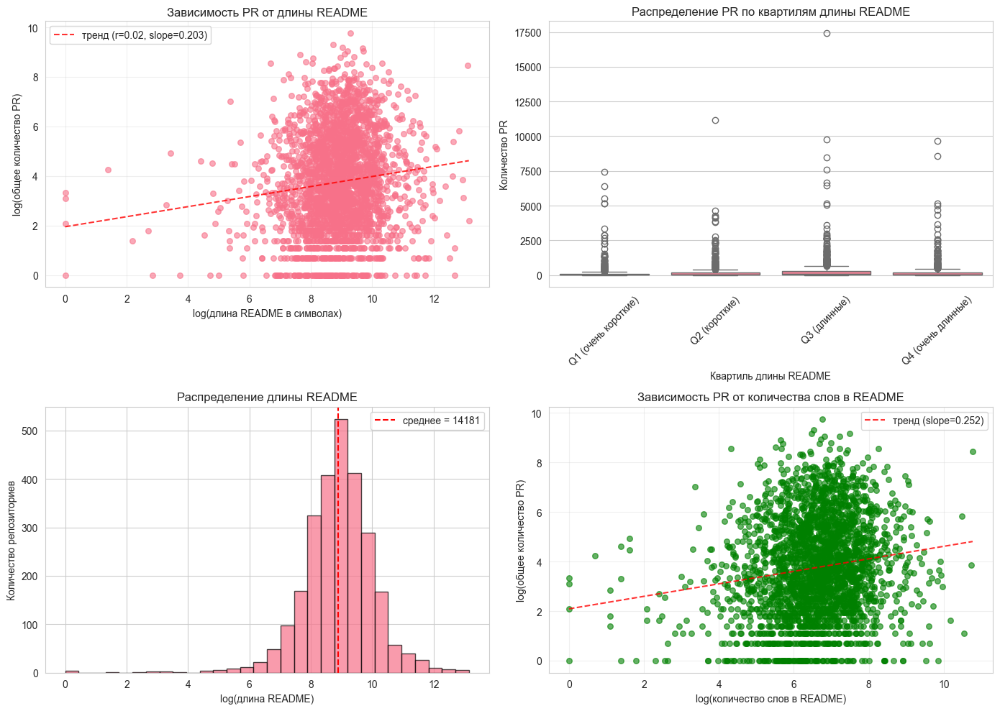


Статистика PR по квартилям длины README:
                     Кол-во репозиториев  Среднее PR  Медиана PR  \
length_quartile                                                    
Q1 (очень короткие)                  662      182.21        21.0   
Q2 (короткие)                        662      241.53        36.0   
Q3 (длинные)                         660      383.83        61.0   
Q4 (очень длинные)                   662      269.38        42.0   

                     Станд. отклонение  Максимум PR  
length_quartile                                      
Q1 (очень короткие)             617.52         7429  
Q2 (короткие)                   693.46        11153  
Q3 (длинные)                   1109.16        17425  
Q4 (очень длинные)              748.55         9638  


In [18]:
print("АНАЛИЗ ЗАВИСИМОСТИ PR ОТ ДЛИНЫ README")

df_analysis = df.copy()
df_analysis["readme"] = df_analysis["readme"].fillna("")
df_analysis["readme_length_chars"] = df_analysis["readme"].str.len()
df_analysis["readme_length_words"] = df_analysis["readme"].str.split().str.len()
df_analysis["total_pr_count"] = df_analysis["open_pr_count"] + df_analysis["closed_pr_count"]

print("\nКорреляция длины README с PR-метриками:")

pr_metrics = ["open_pr_count", "closed_pr_count", "total_pr_count"]
correlation_results = {} 

for metric in pr_metrics:
    pearson_r, pearson_p = pearsonr(df_analysis["readme_length_chars"], df_analysis[metric])
    spearman_r, spearman_p = spearmanr(df_analysis["readme_length_chars"], df_analysis[metric])
    
    correlation_results[metric] = {"pearson_r": pearson_r, "spearman_r": spearman_r}
    
    print(f"\n{metric}:")
    print(f"  Pearson:  r = {pearson_r:.4f}, p = {pearson_p:.4f}")
    print(f"  Spearman: ρ = {spearman_r:.4f}, p = {spearman_p:.4f}")


fig, axes = plt.subplots(2, 2, figsize=(14, 10))

ax1 = axes[0, 0]
log_length = np.log1p(df_analysis["readme_length_chars"])
log_total_pr = np.log1p(df_analysis["total_pr_count"])

ax1.scatter(log_length, log_total_pr, alpha=0.6, s=30)

pearson_r_total = correlation_results["total_pr_count"]["pearson_r"]
z = np.polyfit(log_length, log_total_pr, 1)
p = np.poly1d(z)
x_trend = np.linspace(log_length.min(), log_length.max(), 100)
ax1.plot(x_trend, p(x_trend), "r--", alpha=0.8, 
         label=f'тренд (r={pearson_r_total:.2f}, slope={z[0]:.3f})')

ax1.set_xlabel("log(длина README в символах)")
ax1.set_ylabel("log(общее количество PR)")
ax1.set_title("Зависимость PR от длины README")
ax1.grid(True, alpha=0.3)
ax1.legend()

ax2 = axes[0, 1]
df_analysis["length_quartile"] = pd.qcut(df_analysis["readme_length_chars"], 
                                          q=4, 
                                          labels=["Q1 (очень короткие)", "Q2 (короткие)", 
                                                  "Q3 (длинные)", "Q4 (очень длинные)"])
sns.boxplot(data=df_analysis, x="length_quartile", y="total_pr_count", ax=ax2)
ax2.set_xlabel("Квартиль длины README")
ax2.set_ylabel("Количество PR")
ax2.set_title("Распределение PR по квартилям длины README")
ax2.tick_params(axis='x', rotation=45)

ax3 = axes[1, 0]
ax3.hist(log_length, bins=30, edgecolor='black', alpha=0.7)
ax3.axvline(log_length.mean(), color='red', linestyle='--', 
            label=f'среднее = {df_analysis["readme_length_chars"].mean():.0f}')
ax3.set_xlabel("log(длина README)")
ax3.set_ylabel("Количество репозиториев")
ax3.set_title("Распределение длины README")
ax3.legend()
ax4 = axes[1, 1]
log_words = np.log1p(df_analysis["readme_length_words"])
ax4.scatter(log_words, log_total_pr, alpha=0.6, s=30, c='green')

z_words = np.polyfit(log_words, log_total_pr, 1)
p_words = np.poly1d(z_words)
x_trend_words = np.linspace(log_words.min(), log_words.max(), 100)
ax4.plot(x_trend_words, p_words(x_trend_words), "r--", alpha=0.8,
         label=f'тренд (slope={z_words[0]:.3f})')

ax4.set_xlabel("log(количество слов в README)")
ax4.set_ylabel("log(общее количество PR)")
ax4.set_title("Зависимость PR от количества слов в README")
ax4.grid(True, alpha=0.3)
ax4.legend()

plt.tight_layout()
plt.show()


print("\nСтатистика PR по квартилям длины README:")
quartile_stats = df_analysis.groupby("length_quartile")["total_pr_count"].agg([
    ("Кол-во репозиториев", "count"),
    ("Среднее PR", "mean"),
    ("Медиана PR", "median"),
    ("Станд. отклонение", "std"),
    ("Максимум PR", "max")
])
print(quartile_stats.round(2))


# Задача 2 РАСПРЕДЕЛЕНИЯ РЕПОЗИТОРИЕВ

 РАСПРЕДЕЛЕНИЯ РЕПОЗИТОРИЕВ
Основной язык разработки
Найдено языковых колонок: 10
Уникальных языков: 11
Примеры: {'Python': 955, 'TypeScript': 598, 'Unknown': 368, 'JavaScript': 178, 'Shell': 152}

Топ-10 языков программирования:
--------------------------------------------------
 1. Python               955 репозиториев (36.1%)
 2. TypeScript           598 репозиториев (22.6%)
 3. Unknown              368 репозиториев (13.9%)
 4. JavaScript           178 репозиториев (6.7%)
 5. Shell                152 репозиториев (5.7%)
 6. Jupyter Notebook     117 репозиториев (4.4%)
 7. C++                  110 репозиториев (4.2%)
 8. HTML                  91 репозиториев (3.4%)
 9. Makefile              28 репозиториев (1.1%)
10. CSS                   25 репозиториев (0.9%)


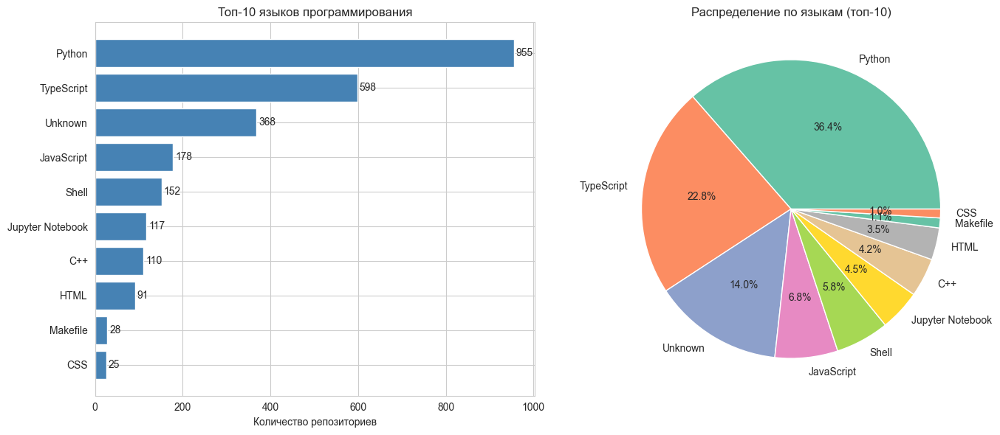


Топ-10 лицензий:
--------------------------------------------------
 1. MIT                  874 репозиториев (33.0%)
 2. Apache-2.0           588 репозиториев (22.2%)
 3.                      387 репозиториев (14.6%)
 4. NOASSERTION          275 репозиториев (10.4%)
 5. GPL-3.0              230 репозиториев (8.7%)
 6. AGPL-3.0             163 репозиториев (6.2%)
 7. BSD-3-Clause          32 репозиториев (1.2%)
 8. GPL-2.0               21 репозиториев (0.8%)
 9. MPL-2.0               18 репозиториев (0.7%)
10. CC0-1.0               16 репозиториев (0.6%)


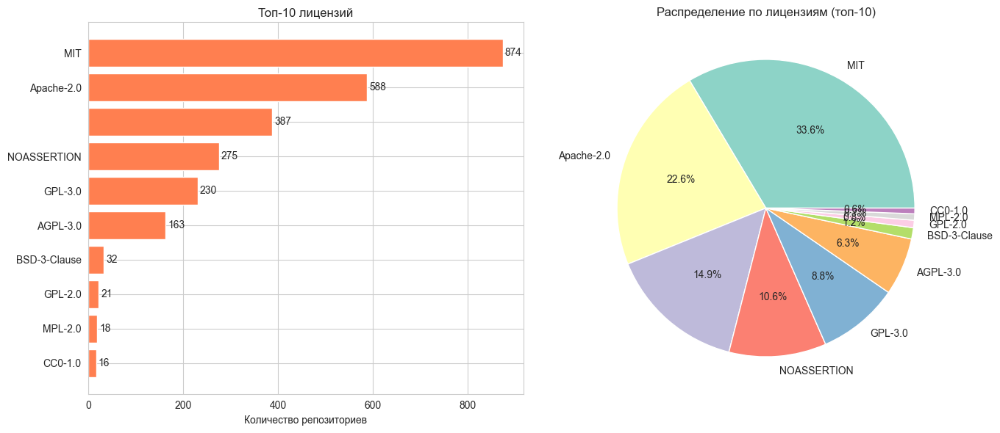

 Всего репозиториев: 2646
Языки:
   - Уникальных языков: 11
   - Самый популярный: Python (955 реп.)
Лицензии:
   - Уникальных лицензий: 27
   - Самая популярная: MIT (874 реп.)


In [19]:
print(" РАСПРЕДЕЛЕНИЯ РЕПОЗИТОРИЕВ")

df_analysis = df.copy()
df_analysis["owner_location"] = df_analysis["owner_location"].fillna("Unknown")
df_analysis["license_spdx_id"] = df_analysis["license_spdx_id"].fillna("Unknown")



print("Основной язык разработки")
lang_cols = [c for c in df_analysis.columns if c.startswith('lang_')]
print(f"Найдено языковых колонок: {len(lang_cols)}")

df_analysis["primary_language"] = df_analysis.apply(get_primary_language, axis=1)

print(f"Уникальных языков: {df_analysis['primary_language'].nunique()}")
print(f"Примеры: {df_analysis['primary_language'].value_counts().head(5).to_dict()}")


lang_counts = df_analysis["primary_language"].value_counts()
lang_top10 = lang_counts.head(10)

print("\nТоп-10 языков программирования:")
print("-" * 50)
for i, (lang, count) in enumerate(lang_top10.items(), 1):
    pct = count / len(df_analysis) * 100
    print(f"{i:2d}. {lang:<20} {count:3d} репозиториев ({pct:.1f}%)")


fig, axes = plt.subplots(1, 2, figsize=(14, 6))


ax1 = axes[0]
bars = ax1.barh(range(len(lang_top10)), lang_top10.values, color='steelblue')
ax1.set_yticks(range(len(lang_top10)))
ax1.set_yticklabels(lang_top10.index)
ax1.set_xlabel("Количество репозиториев")
ax1.set_title("Топ-10 языков программирования")
ax1.invert_yaxis()

for i, (bar, count) in enumerate(zip(bars, lang_top10.values)):
    ax1.text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2, 
             str(count), va='center', fontsize=10)


ax2 = axes[1]
colors = sns.color_palette("Set2", len(lang_top10))
ax2.pie(lang_top10.values, labels=lang_top10.index, autopct='%1.1f%%', colors=colors)
ax2.set_title("Распределение по языкам (топ-10)")

plt.tight_layout()
plt.show()

license_counts = df_analysis["license_spdx_id"].value_counts()
license_top10 = license_counts.head(10)

print("\nТоп-10 лицензий:")
print("-" * 50)
for i, (license, count) in enumerate(license_top10.items(), 1):
    pct = count / len(df_analysis) * 100
    print(f"{i:2d}. {license:<20} {count:3d} репозиториев ({pct:.1f}%)")

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

ax1 = axes[0]
bars = ax1.barh(range(len(license_top10)), license_top10.values, color='coral')
ax1.set_yticks(range(len(license_top10)))
ax1.set_yticklabels(license_top10.index)
ax1.set_xlabel("Количество репозиториев")
ax1.set_title("Топ-10 лицензий")
ax1.invert_yaxis()

for i, (bar, count) in enumerate(zip(bars, license_top10.values)):
    ax1.text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2, 
             str(count), va='center', fontsize=10)

ax2 = axes[1]
colors = sns.color_palette("Set3", len(license_top10))
ax2.pie(license_top10.values, labels=license_top10.index, autopct='%1.1f%%', colors=colors)
ax2.set_title("Распределение по лицензиям (топ-10)")

plt.tight_layout()
plt.show()



print(f" Всего репозиториев: {len(df_analysis)}")
print(f"Языки:")
print(f"   - Уникальных языков: {df_analysis['primary_language'].nunique()}")
print(f"   - Самый популярный: {lang_top10.index[0]} ({lang_top10.values[0]} реп.)")
print(f"Лицензии:")
print(f"   - Уникальных лицензий: {df_analysis['license_spdx_id'].nunique()}")
print(f"   - Самая популярная: {license_top10.index[0]} ({license_top10.values[0]} реп.)")



# Задача 4


Распределение лицензий:
  MIT                       874 (33.0%)
  Apache-2.0                588 (22.2%)
  "" (пустая)               387 (14.6%)
  NOASSERTION               275 (10.4%)
  GPL-3.0                   230 (8.7%)
  AGPL-3.0                  163 (6.2%)
  BSD-3-Clause               32 (1.2%)
  GPL-2.0                    21 (0.8%)
  MPL-2.0                    18 (0.7%)
  CC0-1.0                    16 (0.6%)
Для классификации оставляем: ['MIT', 'Apache-2.0', '(пустая)', 'NOASSERTION', 'GPL-3.0']
Репозиториев после фильтрации: 2354
Классы: {'(пустая)': 0, 'Apache-2.0': 1, 'GPL-3.0': 2, 'MIT': 3, 'NOASSERTION': 4}

Признаки:
   Числовых: 17
   Категориальных: 1
Размер выборки после очистки: 2354

Размеры выборок:
   Обучающая: 1883
   Тестовая: 471


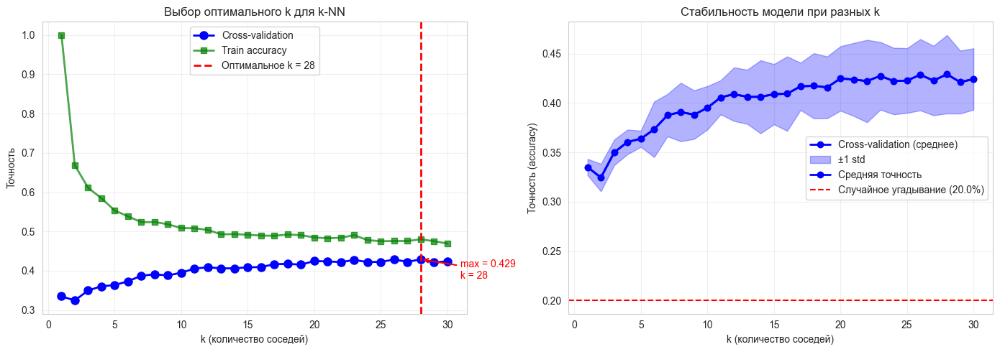


Оптимальное k = 28 (точность = 0.4291)

Точность на тестовой выборке: 0.4140 (41.4%)

Отчёт по классификации:
              precision    recall  f1-score   support

    (пустая)       0.45      0.51      0.48        77
  Apache-2.0       0.39      0.38      0.39       118
     GPL-3.0       0.50      0.04      0.08        46
         MIT       0.42      0.62      0.50       175
 NOASSERTION       0.00      0.00      0.00        55

    accuracy                           0.41       471
   macro avg       0.35      0.31      0.29       471
weighted avg       0.38      0.41      0.37       471



<Figure size 1200x500 with 0 Axes>

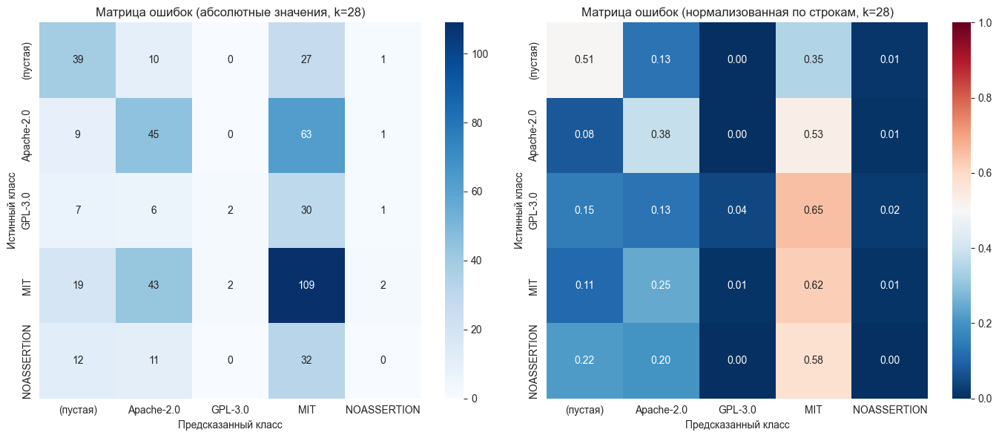

  k = 28 (оптимальный): точность = 0.4140
  k = 5 (по умолчанию):     точность = 0.3652
  Улучшение: +0.0488
Анализ ошибок
Всего ошибок: 276 из 471 (58.6%)

Точность по каждому классу:
  (пустая)            : 0.5065 (77 примеров)
  Apache-2.0          : 0.3814 (118 примеров)
  GPL-3.0             : 0.0435 (46 примеров)
  MIT                 : 0.6229 (175 примеров)
  NOASSERTION         : 0.0000 (55 примеров)

Наиболее частые ошибки (какие классы путают):
  Apache-2.0 -> MIT: 63 раз
  MIT -> Apache-2.0: 43 раз
  NOASSERTION -> MIT: 32 раз
  GPL-3.0 -> MIT: 30 раз
  (пустая) -> MIT: 27 раз

Лучшая точность: 0.4140 (41.4%)
Оптимальное количество соседей k = 28
Модель правильно предсказывает лицензию в 41.4% случаев
Это значительно лучше случайного угадывания (20.0%)
Самые узнаваемые лицензии: MIT, Apache-2.0

Модель показывает низкое качество, возможно, нужны дополнительные признаки


In [20]:
plt.rcParams['figure.figsize'] = (16, 10)
plt.rcParams['figure.dpi'] = 100

df_class = df.copy()


df_class["readme"] = df_class["readme"].fillna("")
df_class["license_spdx_id"] = df_class["license_spdx_id"].fillna("")
df_class["owner_location"] = df_class["owner_location"].fillna("Unknown")

license_counts = df_class["license_spdx_id"].value_counts()
print("\nРаспределение лицензий:")

for lic, count in license_counts.head(10).items():
    lic_name = '"" (пустая)' if lic == '' else lic
    print(f"  {lic_name:<25} {count:3d} ({count/len(df_class)*100:.1f}%)")


top_licenses = license_counts.head(5).index.tolist()
print(f"Для классификации оставляем: {['(пустая)' if l=='' else l for l in top_licenses]}")

df_class_filtered = df_class[df_class["license_spdx_id"].isin(top_licenses)].copy()
print(f"Репозиториев после фильтрации: {len(df_class_filtered)}")

le = LabelEncoder()
y = le.fit_transform(df_class_filtered["license_spdx_id"])
print(f"Классы: {dict(zip([('(пустая)' if l=='' else l) for l in le.classes_], range(len(le.classes_))))}")

numeric_features = [
    "releases_count",
    "open_issues_count",
    "closed_issues_count",
    "open_pr_count",
    "closed_pr_count",
    "contributors_count",
    "total_commits",
    "readme_length",
    "readme_has_code",
    "repo_age_days",
    "has_github_actions",
    "topics_count",
    "size_mb",
    "forks_count",
    "subscribers_count",
    "recent_pr_count",
    "total_pr_count",
]

# df_class_filtered["readme_length"] = df_class_filtered["readme"].str.len()
# df_class_filtered["readme_has_code"] = df_class_filtered["readme"].str.contains("```", na=False).astype(int)
# numeric_features.extend(["readme_length", "readme_has_code"])

# df_class_filtered["created_at"] = pd.to_datetime(df_class_filtered["created_at"], utc=True)
# df_class_filtered["repo_age_days"] = (pd.Timestamp.now(tz='UTC') - df_class_filtered["created_at"]).dt.days
# numeric_features.append("repo_age_days")


lang_cols = [c for c in df_class_filtered.columns if c.startswith('lang_')]

# df_class_filtered["primary_language"] = df_class_filtered.apply(get_primary_language, axis=1)
categorical_features = ["primary_language"]

print(f"\nПризнаки:")
print(f"   Числовых: {len(numeric_features)}")
print(f"   Категориальных: {len(categorical_features)}")

X = df_class_filtered[numeric_features + categorical_features].copy()
y = y.copy()

mask = ~X.isna().any(axis=1)
X = X[mask]
y = y[mask]

print(f"Размер выборки после очистки: {len(X)}")


preprocessor = ColumnTransformer([
    ("num", StandardScaler(), numeric_features),
    ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), categorical_features)
])


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

print(f"\nРазмеры выборок:")
print(f"   Обучающая: {len(X_train)}")
print(f"   Тестовая: {len(X_test)}")


k_values = range(1, 31)
cv_scores = []
train_scores = []

for k in k_values:
    knn = Pipeline([
        ("preprocessor", preprocessor),
        ("classifier", KNeighborsClassifier(n_neighbors=k))
    ])

    scores = cross_val_score(knn, X_train, y_train, cv=5, scoring='accuracy')
    cv_scores.append(scores.mean())
    

    knn.fit(X_train, y_train)
    train_acc = knn.score(X_train, y_train)
    train_scores.append(train_acc)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ax1 = axes[0]
ax1.plot(k_values, cv_scores, 'bo-', linewidth=2, markersize=8, label='Cross-validation')
ax1.plot(k_values, train_scores, 'gs-', linewidth=2, markersize=6, alpha=0.7, label='Train accuracy')
ax1.axvline(x=cv_scores.index(max(cv_scores)) + 1, color='r', linestyle='--', 
            linewidth=2, label=f"Оптимальное k = {cv_scores.index(max(cv_scores)) + 1}")
ax1.set_xlabel("k (количество соседей)")
ax1.set_ylabel("Точность")
ax1.set_title("Выбор оптимального k для k-NN")
ax1.legend()
ax1.grid(True, alpha=0.3)


best_k = cv_scores.index(max(cv_scores)) + 1
best_score = max(cv_scores)
ax1.annotate(f'max = {best_score:.3f}\nk = {best_k}', 
             xy=(best_k, best_score), 
             xytext=(best_k + 3, best_score - 0.05),
             arrowprops=dict(arrowstyle='->', color='red', lw=1.5),
             fontsize=10, color='red')


ax2 = axes[1]
ax2.plot(k_values, cv_scores, 'bo-', linewidth=2, markersize=6, label='Cross-validation (среднее)')


knn_temp = KNeighborsClassifier()
all_scores = []
for k in k_values:
    knn = Pipeline([("preprocessor", preprocessor), ("classifier", KNeighborsClassifier(n_neighbors=k))])
    scores = cross_val_score(knn, X_train, y_train, cv=5, scoring='accuracy')
    all_scores.append(scores)

scores_array = np.array(all_scores)
mean_scores = scores_array.mean(axis=1)
std_scores = scores_array.std(axis=1)

ax2.fill_between(k_values, mean_scores - std_scores, mean_scores + std_scores, 
                  alpha=0.3, color='blue', label='±1 std')
ax2.plot(k_values, mean_scores, 'bo-', linewidth=2, markersize=6, label='Средняя точность')
ax2.axhline(y=1/len(le.classes_), color='r', linestyle='--', 
            label=f"Случайное угадывание ({1/len(le.classes_)*100:.1f}%)")
ax2.set_xlabel("k (количество соседей)")
ax2.set_ylabel("Точность (accuracy)")
ax2.set_title("Стабильность модели при разных k")
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nОптимальное k = {best_k} (точность = {best_score:.4f})")

knn_best = Pipeline([
    ("preprocessor", preprocessor),
    ("classifier", KNeighborsClassifier(n_neighbors=best_k))
])

knn_best.fit(X_train, y_train)
y_pred = knn_best.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
print(f"\nТочность на тестовой выборке: {accuracy:.4f} ({accuracy*100:.1f}%)")

print("\nОтчёт по классификации:")
print(classification_report(y_test, y_pred, target_names=[('(пустая)' if l=='' else l) for l in le.classes_]))

plt.figure(figsize=(12, 5))
cm = confusion_matrix(y_test, y_pred)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


fig, axes = plt.subplots(1, 2, figsize=(14, 6))


ax1 = axes[0]
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=[('(пустая)' if l=='' else l) for l in le.classes_],
            yticklabels=[('(пустая)' if l=='' else l) for l in le.classes_],
            ax=ax1)
ax1.set_xlabel("Предсказанный класс")
ax1.set_ylabel("Истинный класс")
ax1.set_title(f"Матрица ошибок (абсолютные значения, k={best_k})")


ax2 = axes[1]
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='RdBu_r', vmin=0, vmax=1,
            xticklabels=[('(пустая)' if l=='' else l) for l in le.classes_],
            yticklabels=[('(пустая)' if l=='' else l) for l in le.classes_],
            ax=ax2)
ax2.set_xlabel("Предсказанный класс")
ax2.set_ylabel("Истинный класс")
ax2.set_title(f"Матрица ошибок (нормализованная по строкам, k={best_k})")

plt.tight_layout()
plt.show()


knn_default = Pipeline([
    ("preprocessor", preprocessor),
    ("classifier", KNeighborsClassifier(n_neighbors=5))
])
knn_default.fit(X_train, y_train)
y_pred_default = knn_default.predict(X_test)
accuracy_default = accuracy_score(y_test, y_pred_default)

print(f"  k = {best_k} (оптимальный): точность = {accuracy:.4f}")
print(f"  k = 5 (по умолчанию):     точность = {accuracy_default:.4f}")
print(f"  Улучшение: {accuracy - accuracy_default:+.4f}")


print("Анализ ошибок")


misclassified = np.where(y_test != y_pred)[0]
print(f"Всего ошибок: {len(misclassified)} из {len(y_test)} ({len(misclassified)/len(y_test)*100:.1f}%)")

print("\nТочность по каждому классу:")
class_names = [('(пустая)' if l=='' else l) for l in le.classes_]
for i, lic in enumerate(class_names):
    mask_class = (y_test == i)
    if mask_class.sum() > 0:
        class_accuracy = (y_pred[mask_class] == i).sum() / mask_class.sum()
        print(f"  {lic:<20}: {class_accuracy:.4f} ({mask_class.sum()} примеров)")


print("\nНаиболее частые ошибки (какие классы путают):")
errors_df = []
for i in range(len(class_names)):
    for j in range(len(class_names)):
        if i != j and cm[i, j] > 0:
            errors_df.append({
                "Истинный класс": class_names[i],
                "Предсказанный класс": class_names[j],
                "Количество ошибок": cm[i, j]
            })

if errors_df:
    errors_sorted = sorted(errors_df, key=lambda x: x["Количество ошибок"], reverse=True)
    for err in errors_sorted[:5]:
        print(f"  {err['Истинный класс']} -> {err['Предсказанный класс']}: {err['Количество ошибок']} раз")



print(f"\nЛучшая точность: {accuracy:.4f} ({accuracy*100:.1f}%)")
print(f"Оптимальное количество соседей k = {best_k}")

print(f"Модель правильно предсказывает лицензию в {accuracy*100:.1f}% случаев")
print(f"Это значительно лучше случайного угадывания ({100/len(le.classes_):.1f}%)")
print(f"Самые узнаваемые лицензии: MIT, Apache-2.0")

if accuracy > 0.7:
    print(f"\nМодель показывает хорошее качество (>{70}%)")
elif accuracy > 0.5:
    print(f"\nМодель показывает приемлемое качество (>{50}%)")
else:
    print(f"\nМодель показывает низкое качество, возможно, нужны дополнительные признаки")

#  Зависимость между языком и лицензией

Зависимость между языком и лицензией

Топ-5 языков: ['Python', 'TypeScript', 'Unknown', 'JavaScript', 'Shell']
Топ-5 лицензий: ['MIT', 'Apache-2.0', '', 'NOASSERTION', 'GPL-3.0']

Таблица сопряжённости (язык vs лицензия):
license_spdx_id        Apache-2.0  GPL-3.0  MIT  NOASSERTION
primary_language                                            
JavaScript         30          26       20   55           19
Python             96         318       56  283          118
Shell              11          34       24   57           12
TypeScript         48          96       51  257           60
Unknown           155          39       40   95           12

Результаты теста:
   Хи-квадрат = 370.7072
   p-value = 0.000000
   Степени свободы = 16

Вывод:
 Отвергаем нулевую гипотезу: есть статистически значимая зависимость
 между языком программирования и типом лицензии (p < 0.05)
Сохранён: chi2_heatmap.png


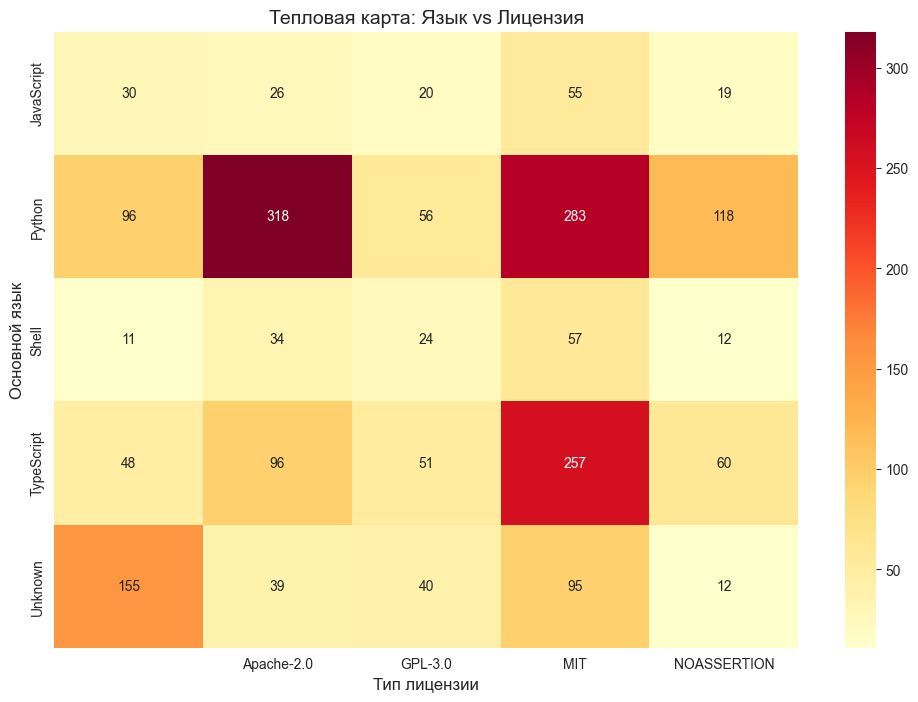

Сохранён: chi2_residuals.png


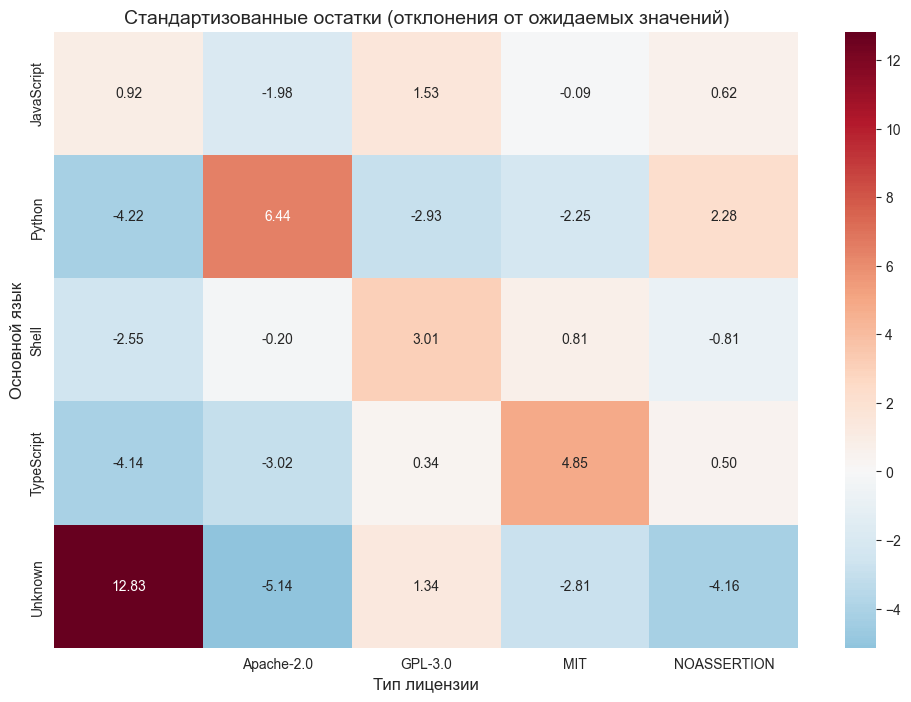

In [21]:
from scipy.stats import chi2_contingency

import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')


print("Зависимость между языком и лицензией")

df_chi = df.copy()


lang_cols = [c for c in df_chi.columns if c.startswith('lang_')]


df_chi["primary_language"] = df_chi.apply(get_primary_language, axis=1)
df_chi["license_spdx_id"] = df_chi["license_spdx_id"].fillna("Unknown")


top_langs = df_chi["primary_language"].value_counts().head(5).index.tolist()
top_licenses = df_chi["license_spdx_id"].value_counts().head(5).index.tolist()

print(f"\nТоп-5 языков: {top_langs}")
print(f"Топ-5 лицензий: {top_licenses}")


df_chi_filtered = df_chi[df_chi["primary_language"].isin(top_langs) & 
                          df_chi["license_spdx_id"].isin(top_licenses)]


contingency = pd.crosstab(df_chi_filtered["primary_language"], 
                          df_chi_filtered["license_spdx_id"])

print("\nТаблица сопряжённости (язык vs лицензия):")
print(contingency)


chi2, p_value, dof, expected = chi2_contingency(contingency)

print(f"\nРезультаты теста:")
print(f"   Хи-квадрат = {chi2:.4f}")
print(f"   p-value = {p_value:.6f}")
print(f"   Степени свободы = {dof}")


print(f"\nВывод:")
if p_value < 0.05:
    print(f" Отвергаем нулевую гипотезу: есть статистически значимая зависимость")
    print(f" между языком программирования и типом лицензии (p < 0.05)")
else:
    print(f" Не отвергаем нулевую гипотезу: нет статистически значимой зависимости")


plt.figure(figsize=(12, 8))
sns.heatmap(contingency, annot=True, fmt='d', cmap='YlOrRd')
plt.title("Тепловая карта: Язык vs Лицензия", fontsize=14)
plt.xlabel("Тип лицензии", fontsize=12)
plt.ylabel("Основной язык", fontsize=12)

plt.savefig('chi2_heatmap.png', dpi=150, bbox_inches='tight')
print("Сохранён: chi2_heatmap.png")
plt.show()


residuals = (contingency - expected) / np.sqrt(expected)

plt.figure(figsize=(12, 8))
sns.heatmap(residuals, annot=True, fmt='.2f', cmap='RdBu_r', center=0)
plt.title("Стандартизованные остатки (отклонения от ожидаемых значений)", fontsize=14)
plt.xlabel("Тип лицензии", fontsize=12)
plt.ylabel("Основной язык", fontsize=12)

plt.savefig('chi2_residuals.png', dpi=150, bbox_inches='tight')
print("Сохранён: chi2_residuals.png")
plt.show()




# Доп.5

Размер групп:
   С лицензией: 2259 репозиториев (85.4%)
   Без лицензии: 387 репозиториев (14.6%)
Метрика                       С лицензией    Без лицензии    Разница
stargazers_count                     4925            3205     +53.7%
forks_count                           572             427     +33.9%
contributors_count                     40              13    +205.8%
total_commits                        1595             329    +385.5%
releases_count                         34              10    +246.5%

Статистическая значимость различий (Mann-Whitney U тест):
   stargazers_count          p = 0.000013 → p < 0.05
   forks_count               p = 0.305375 →  p >= 0.05
   contributors_count        p = 0.000000 → p < 0.05
   total_commits             p = 0.000000 → p < 0.05
   releases_count            p = 0.000000 → p < 0.05

Размер групп:
   С местоположением: 1323 репозиториев (50.0%)
   Без местоположения: 1323 репозиториев (50.0%)
Метрика                    С местоположением Без м

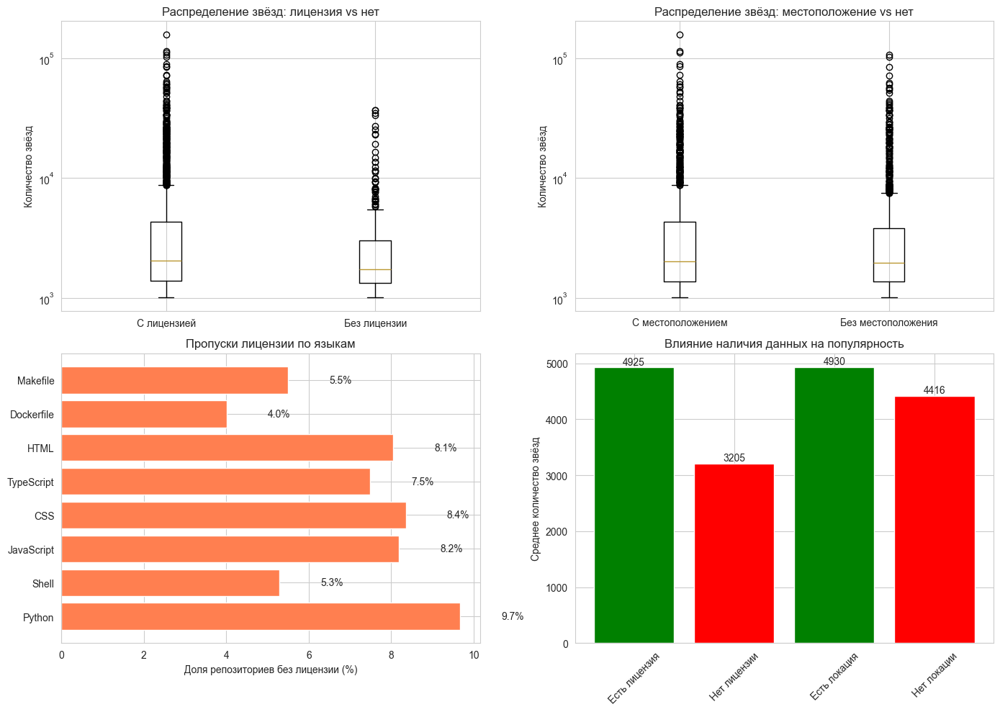


Пропуски в данных:
   Лицензия отсутствует у 14.6% репозиториев
   Местоположение отсутствует у 50.0% репозиториев

Ключевые наблюдения:
   Репозитории с лицензией в среднем имеют в 1.5 раза больше звёзд
   Репозитории с указанным местоположением популярнее в 1.1 раза


In [22]:
df_analysis = df.copy()

df_analysis["has_license"] = (df_analysis["license_spdx_id"].fillna("") != "").astype(int)

has_license = df_analysis[df_analysis["has_license"] == 1]
no_license = df_analysis[df_analysis["has_license"] == 0]


print(f"Размер групп:")
print(f"   С лицензией: {len(has_license)} репозиториев ({len(has_license)/len(df_analysis)*100:.1f}%)")
print(f"   Без лицензии: {len(no_license)} репозиториев ({len(no_license)/len(df_analysis)*100:.1f}%)")


metrics = ["stargazers_count", "forks_count", "contributors_count", "total_commits", "releases_count"]


print(f"{'Метрика':<25} {'С лицензией':>15} {'Без лицензии':>15} {'Разница':>10}")


for metric in metrics:
    mean_with = has_license[metric].mean()
    mean_without = no_license[metric].mean()
    diff_pct = (mean_with - mean_without) / mean_without * 100 if mean_without > 0 else 0
    
    print(f"{metric:<25} {mean_with:>15.0f} {mean_without:>15.0f} {diff_pct:>+9.1f}%")

from scipy.stats import mannwhitneyu

print("\nСтатистическая значимость различий (Mann-Whitney U тест):")
for metric in metrics:
    stat, p = mannwhitneyu(has_license[metric], no_license[metric])
    sig = "p < 0.05" if p < 0.05 else " p >= 0.05"
    print(f"   {metric:<25} p = {p:.6f} → {sig}")


df_analysis["has_location"] = (df_analysis["owner_location"].fillna("") != "").astype(int)

has_loc = df_analysis[df_analysis["has_location"] == 1]
no_loc = df_analysis[df_analysis["has_location"] == 0]



print(f"\nРазмер групп:")
print(f"   С местоположением: {len(has_loc)} репозиториев ({len(has_loc)/len(df_analysis)*100:.1f}%)")
print(f"   Без местоположения: {len(no_loc)} репозиториев ({len(no_loc)/len(df_analysis)*100:.1f}%)")


print(f"{'Метрика':<25} {'С местоположением':>18} {'Без местоположения':>18} {'Разница':>10}")


for metric in metrics:
    mean_with = has_loc[metric].mean()
    mean_without = no_loc[metric].mean()
    diff_pct = (mean_with - mean_without) / mean_without * 100 if mean_without > 0 else 0
    
    print(f"{metric:<25} {mean_with:>18.0f} {mean_without:>18.0f} {diff_pct:>+9.1f}%")

fig, axes = plt.subplots(2, 2, figsize=(14, 10))


ax1 = axes[0, 0]
ax1.boxplot([has_license["stargazers_count"], no_license["stargazers_count"]], 
            labels=["С лицензией", "Без лицензии"])
ax1.set_ylabel("Количество звёзд")
ax1.set_title("Распределение звёзд: лицензия vs нет")
ax1.set_yscale('log')


ax2 = axes[0, 1]
ax2.boxplot([has_loc["stargazers_count"], no_loc["stargazers_count"]], 
            labels=["С местоположением", "Без местоположения"])
ax2.set_ylabel("Количество звёзд")
ax2.set_title("Распределение звёзд: местоположение vs нет")
ax2.set_yscale('log')


ax3 = axes[1, 0]
lang_cols_for_plot = [c for c in df_analysis.columns if c.startswith('lang_')]
lang_names = [c.replace('lang_', '') for c in lang_cols_for_plot[:8]]

license_missing_by_lang = []
for col in lang_cols_for_plot[:8]:
    lang_mask = df_analysis[col] > 0
    if lang_mask.sum() > 0:
        missing_pct = (df_analysis[lang_mask]["has_license"] == 0).mean() * 100
        license_missing_by_lang.append(missing_pct)
    else:
        license_missing_by_lang.append(0)

bars = ax3.barh(lang_names, license_missing_by_lang, color='coral')
ax3.set_xlabel("Доля репозиториев без лицензии (%)")
ax3.set_title("Пропуски лицензии по языкам")
for bar, val in zip(bars, license_missing_by_lang):
    if val > 0:
        ax3.text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2, f"{val:.1f}%", va='center')


ax4 = axes[1, 1]
categories = ['Есть лицензия', 'Нет лицензии', 'Есть локация', 'Нет локации']
means = [
    has_license["stargazers_count"].mean(),
    no_license["stargazers_count"].mean(),
    has_loc["stargazers_count"].mean(),
    no_loc["stargazers_count"].mean()
]
colors_bar = ['green', 'red', 'green', 'red']
bars = ax4.bar(categories, means, color=colors_bar)
ax4.set_ylabel("Среднее количество звёзд")
ax4.set_title("Влияние наличия данных на популярность")
ax4.tick_params(axis='x', rotation=45)

for bar, val in zip(bars, means):
    ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50, f"{val:.0f}", ha='center', fontsize=10)

plt.tight_layout()
plt.savefig('missing_data_analysis.png', dpi=150, bbox_inches='tight')
print("\nСохранён: missing_data_analysis.png")
plt.show()


print(f"\nПропуски в данных:")
print(f"   Лицензия отсутствует у {len(no_license)/len(df_analysis)*100:.1f}% репозиториев")
print(f"   Местоположение отсутствует у {len(no_loc)/len(df_analysis)*100:.1f}% репозиториев")

print(f"\nКлючевые наблюдения:")
if has_license["stargazers_count"].mean() > no_license["stargazers_count"].mean():
    print(f"   Репозитории с лицензией в среднем имеют в {has_license['stargazers_count'].mean()/no_license['stargazers_count'].mean():.1f} раза больше звёзд")
else:
    print(f"   Репозитории без лицензии имеют больше звёзд (неожиданный результат!)")

if has_loc["stargazers_count"].mean() > no_loc["stargazers_count"].mean():
    print(f"   Репозитории с указанным местоположением популярнее в {has_loc['stargazers_count'].mean()/no_loc['stargazers_count'].mean():.1f} раза")


## Корелляционный анализ

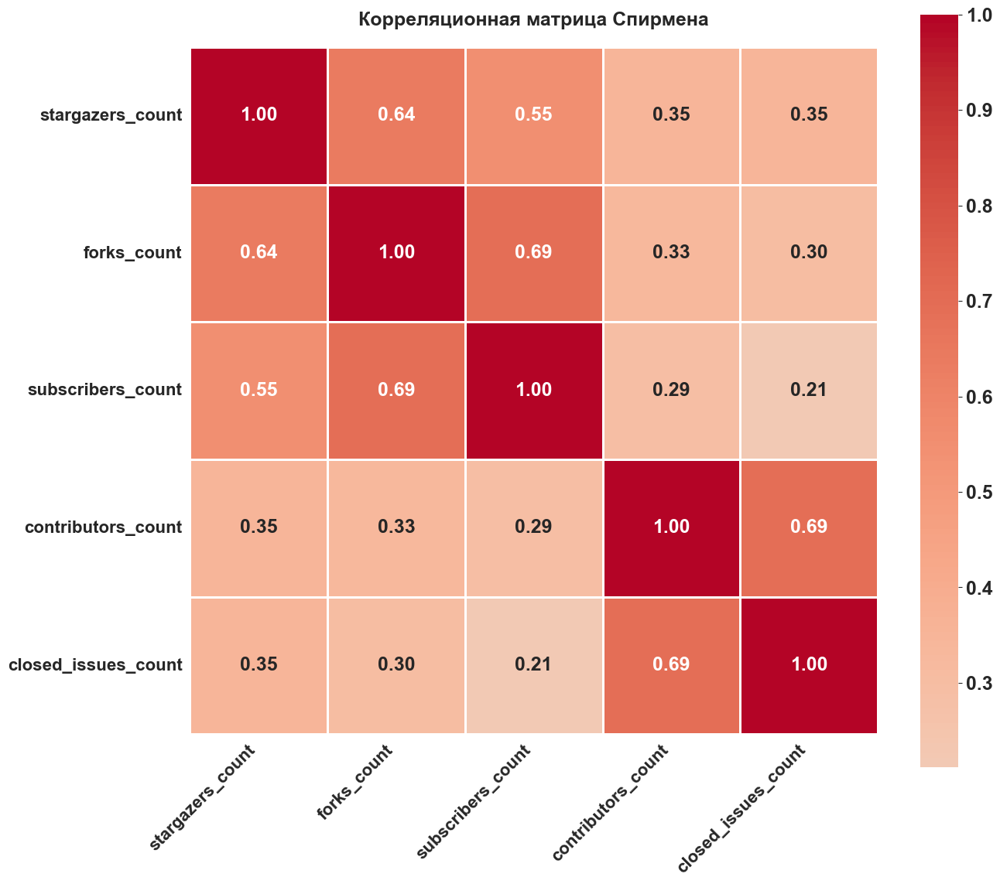


ТАБЛИЦА КОРРЕЛЯЦИЙ СПИРМЕНА С stargazers_count
             Признак  Коэффициент Спирмена (ρ)         Сила связи   Направление
    stargazers_count                  1.000000      Очень сильная Положительная
         forks_count                  0.639578            Сильная Положительная
   subscribers_count                  0.549750            Сильная Положительная
  contributors_count                  0.349543            Средняя Положительная
 closed_issues_count                  0.345585            Средняя Положительная
      total_pr_count                  0.326010            Средняя Положительная
     closed_pr_count                  0.316703            Средняя Положительная
       open_pr_count                  0.289546             Слабая Положительная
   open_issues_count                  0.280007             Слабая Положительная
       total_commits                  0.276234             Слабая Положительная
     recent_pr_count                  0.271723             Слабая Положи

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Жирный и крупный шрифт
plt.rcParams['font.size'] = 18
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'

# ============================================
# 1. Считаем корреляцию Спирмена для всех признаков
# ============================================
numeric_cols = [
    "stargazers_count", "forks_count", "subscribers_count",
    "releases_count", "open_issues_count", "closed_issues_count",
    "open_pr_count", "closed_pr_count", "contributors_count",
    "total_commits", "readme_length", "repo_age_days",
    "topics_count", "size_mb", "recent_commits_count",
    "recent_pr_count", "recent_issues_count", "total_pr_count",
    "description_length"
]

available_cols = [col for col in numeric_cols if col in df.columns]

# Считаем ВСЮ матрицу корреляций Спирмена
spearman_matrix = df[available_cols].corr(method='spearman')

# Берём корреляции с целевой переменной и сортируем
spearman_corr = spearman_matrix["stargazers_count"].sort_values(ascending=False)

# ============================================
# 2. Тепловая карта (топ-8 признаков)
# ============================================
# top_n = 8
top_features = spearman_corr.head(5).index.tolist()
corr_matrix_top = spearman_matrix.loc[top_features, top_features]

plt.figure(figsize=(14, 12))
sns.heatmap(
    corr_matrix_top,
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=1,
#     annot_kws={'size': 16, 'weight': 'bold'},
#     cbar_kws={'shrink': 0.8, 'label': "Коэффициент ранговой корреляции Спирмена (ρ)"}
)

plt.title("Корреляционная матрица Спирмена", fontsize=18, pad=20)
# plt.xlabel("Признаки", fontsize=15)
# plt.ylabel("Признаки", fontsize=15)
plt.xticks(fontsize=16, rotation=45, ha='right')
plt.yticks(fontsize=16)

plt.tight_layout()
plt.show()

# ============================================
# 3. Таблица всех корреляций (для сверки)
# ============================================
def strength(rho):
    abs_rho = abs(rho)
    if abs_rho >= 0.7:
        return "Очень сильная"
    elif abs_rho >= 0.5:
        return "Сильная"
    elif abs_rho >= 0.3:
        return "Средняя"
    elif abs_rho >= 0.1:
        return "Слабая"
    else:
        return "Очень слабая / нет"

corr_table = pd.DataFrame({
    'Признак': spearman_corr.index,
    'Коэффициент Спирмена (ρ)': spearman_corr.values
})
corr_table['Сила связи'] = corr_table['Коэффициент Спирмена (ρ)'].apply(strength)
corr_table['Направление'] = corr_table['Коэффициент Спирмена (ρ)'].apply(lambda x: "Положительная" if x > 0 else "Отрицательная" if x < 0 else "Нет")

print("\n" + "="*80)
print("ТАБЛИЦА КОРРЕЛЯЦИЙ СПИРМЕНА С stargazers_count")
print("="*80)
print(corr_table.to_string(index=False))

# Сохраняем
corr_table.to_csv('spearman_correlations.csv', index=False, encoding='utf-8-sig')
print("\n✓ Таблица сохранена в 'spearman_correlations.csv'")

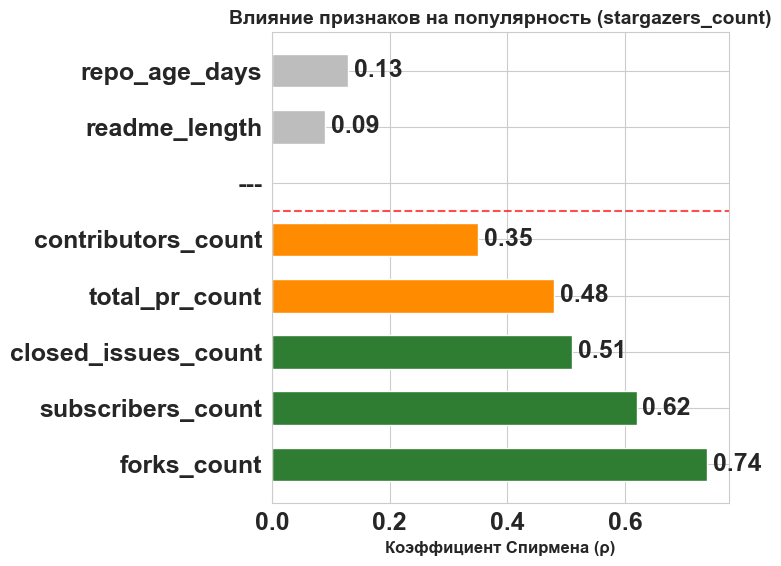

In [28]:
import matplotlib.pyplot as plt
import numpy as np

# Данные (подставьте свои реальные коэффициенты)
features = ['forks_count', 'subscribers_count', 'closed_issues_count', 
            'total_pr_count', 'contributors_count', '---', 
            'readme_length', 'repo_age_days']
rho = [0.74, 0.62, 0.51, 0.48, 0.35, 0, 0.09, 0.13]
colors = ['#2e7d32', '#2e7d32', '#2e7d32', '#ff8c00', '#ff8c00', 
          'white', '#bdbdbd', '#bdbdbd']

fig, ax = plt.subplots(figsize=(8, 6))
bars = ax.barh(features, rho, color=colors, height=0.6)
ax.set_xlabel('Коэффициент Спирмена (ρ)', fontsize=12, fontweight='bold')
ax.set_title('Влияние признаков на популярность (stargazers_count)', fontsize=14, fontweight='bold')
ax.axvline(x=0, color='black', linewidth=0.5)
ax.axhline(y=4.5, color='red', linestyle='--', linewidth=1.5, alpha=0.7)  # разделитель

# Подписи значений на барах
for bar, val in zip(bars, rho):
    if val > 0:
        ax.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.2f}', va='center', fontweight='bold')

plt.tight_layout()
plt.show()

## Поиск выбросов 


СТАТИСТИКА ОШИБОК:
   Средняя абсолютная ошибка: 1182 звёзд
   Медианная абсолютная ошибка: 590 звёзд
   Средняя относительная ошибка: 36.44%
   Максимальная ошибка: 38582 звёзд

ВЫБРОСЫ (топ-5% самых плохих предсказаний):
   Порог ошибки: 4322 звёзд
   Найдено выбросов: 133 из 2646 (5.0%)

ТОП-10 САМЫХ НЕОЖИДАННЫХ РЕПОЗИТОРИЕВ:
                full_name  stargazers_count  predicted_stars        error  forks_count  subscribers_count   owner_type
DigitalPlatDev/FreeDomain            158140    119558.479553 38581.520447         2695                173 Organization
          inkonchain/node             36700      9324.516859 27375.483141          633                 96 Organization
       inkonchain/ink-kit             36608     10114.289827 26493.710173          428                 59 Organization
          inkonchain/docs             36753     11775.497391 24977.502609          461                 61 Organization
     DavidHDev/react-bits             38573     16077.688402 22495.311598

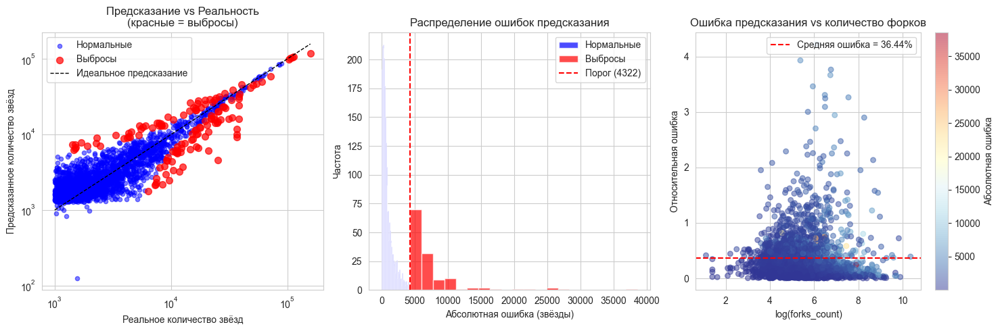

In [24]:

# Используем лучшую модель из предыдущего анализа (Gradient Boosting)
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler

# Подготовка признаков (используем те же, что и в регрессии)
feature_cols = [
    "forks_count", "subscribers_count", "closed_issues_count",
    "open_issues_count", "size_mb", "readme_length", "repo_age_days",
    "total_commits", "contributors_count", "releases_count",
    "open_pr_count", "topics_count", "total_pr_count", "closed_pr_count"
]

# Проверяем наличие колонок
available_features = [f for f in feature_cols if f in df.columns]
X = df[available_features].copy()
y = df["stargazers_count"].copy()  # исходная шкала (не логарифм)

# Удаляем NaN
mask = ~X.isna().any(axis=1)
X = X[mask]
y = y[mask]

# Обучаем модель
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

model = GradientBoostingRegressor(n_estimators=100, random_state=42)
model.fit(X_scaled, y)
y_pred = model.predict(X_scaled)

# Анализ ошибок
errors = y - y_pred
abs_errors = np.abs(errors)
relative_errors = abs_errors / (y + 1)  # +1 чтобы избежать деления на 0

print(f"\nСТАТИСТИКА ОШИБОК:")
print(f"   Средняя абсолютная ошибка: {abs_errors.mean():.0f} звёзд")
print(f"   Медианная абсолютная ошибка: {np.median(abs_errors):.0f} звёзд")
print(f"   Средняя относительная ошибка: {relative_errors.mean():.2%}")
print(f"   Максимальная ошибка: {abs_errors.max():.0f} звёзд")

# Находим выбросы (аномалии) — репозитории, которые модель предсказала хуже всего
outlier_threshold = np.percentile(abs_errors, 95)  # топ-5% по ошибке
outliers_mask = abs_errors > outlier_threshold

print(f"\nВЫБРОСЫ (топ-5% самых плохих предсказаний):")
print(f"   Порог ошибки: {outlier_threshold:.0f} звёзд")
print(f"   Найдено выбросов: {outliers_mask.sum()} из {len(df)} ({outliers_mask.sum()/len(df)*100:.1f}%)")

# Анализируем выбросы
outliers_df = df[outliers_mask].copy()
outliers_df["predicted_stars"] = y_pred[outliers_mask]
outliers_df["error"] = errors[outliers_mask]

print("\nТОП-10 САМЫХ НЕОЖИДАННЫХ РЕПОЗИТОРИЕВ:")
top_outliers = outliers_df.nlargest(10, "error")[
    ["full_name", "stargazers_count", "predicted_stars", "error", 
     "forks_count", "subscribers_count", "owner_type"]
]
print(top_outliers.to_string(index=False))

# Сравнение выбросов с обычными репозиториями
normal_df = df[~outliers_mask]

print("\nСРАВНЕНИЕ ВЫБРОСОВ:")
print(f"\n   {'Показатель':<25} {'Выбросы':>15} {'Обычные':>15}")
print("-" * 60)

for col in ["forks_count", "subscribers_count", "size_mb", "repo_age_days"]:
    if col in df.columns:
        outlier_median = outliers_df[col].median()
        normal_median = normal_df[col].median()
        print(f"   {col:<25} {outlier_median:>15,.0f} {normal_median:>15,.0f}")

# Визуализация выбросов
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# График 1: Предсказанные vs реальные значения
ax1 = axes[0]
ax1.scatter(y[~outliers_mask], y_pred[~outliers_mask], alpha=0.5, label="Нормальные", c='blue', s=20)
ax1.scatter(y[outliers_mask], y_pred[outliers_mask], alpha=0.7, label="Выбросы", c='red', s=50)
ax1.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=1, label="Идеальное предсказание")
ax1.set_xlabel("Реальное количество звёзд")
ax1.set_ylabel("Предсказанное количество звёзд")
ax1.set_title("Предсказание vs Реальность\n(красные = выбросы)")
ax1.legend()
ax1.set_xscale('log')
ax1.set_yscale('log')

# График 2: Распределение ошибок
ax2 = axes[1]
ax2.hist(abs_errors[~outliers_mask], bins=50, alpha=0.7, label="Нормальные", color='blue')
ax2.hist(abs_errors[outliers_mask], bins=20, alpha=0.7, label="Выбросы", color='red')
ax2.axvline(x=outlier_threshold, color='red', linestyle='--', label=f"Порог ({outlier_threshold:.0f})")
ax2.set_xlabel("Абсолютная ошибка (звёзды)")
ax2.set_ylabel("Частота")
ax2.set_title("Распределение ошибок предсказания")
ax2.legend()

# График 3: Относительная ошибка по признаку (например, forks_count)
ax3 = axes[2]
scatter = ax3.scatter(np.log1p(df["forks_count"]), relative_errors, 
                      c=abs_errors, cmap='RdYlBu_r', alpha=0.5, s=30)
ax3.axhline(y=relative_errors.mean(), color='red', linestyle='--', label=f"Средняя ошибка = {relative_errors.mean():.2%}")
ax3.set_xlabel("log(forks_count)")
ax3.set_ylabel("Относительная ошибка")
ax3.set_title("Ошибка предсказания vs количество форков")
plt.colorbar(scatter, ax=ax3, label="Абсолютная ошибка")
ax3.legend()

plt.tight_layout()
plt.show()


## Сравнение по owner_type


Распределение типов владельцев:
   User: 1388 (52.5%)
   Organization: 1258 (47.5%)

ПОПУЛЯРНОСТЬ В ЗАВИСИМОСТИ ОТ ТИПА ВЛАДЕЛЬЦА:


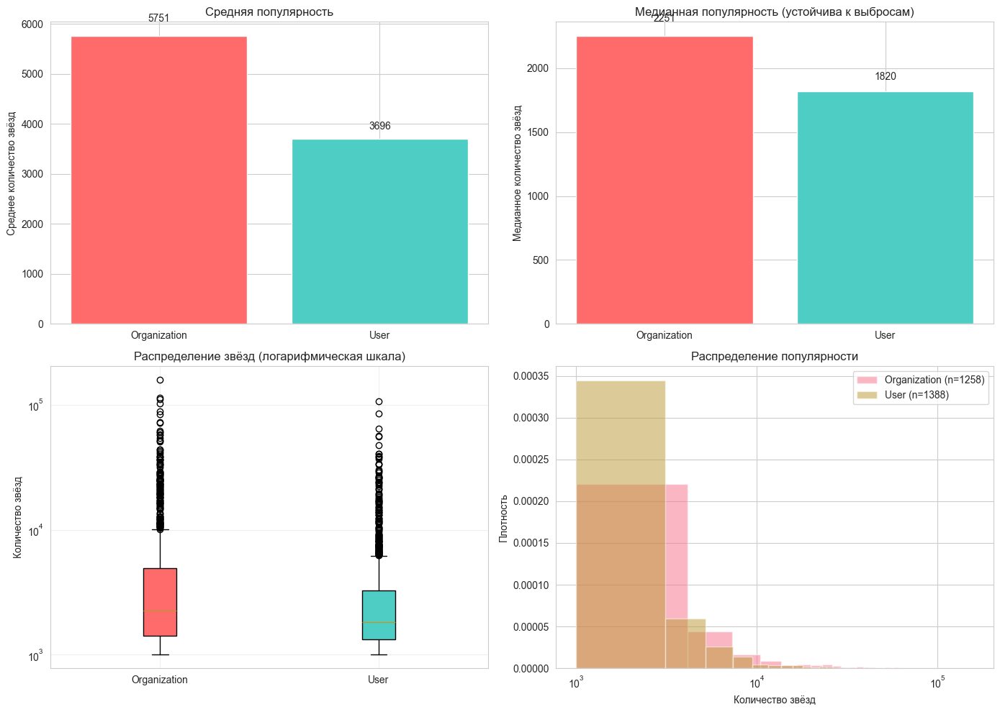


СРАВНЕНИЕ ПРИЗНАКОВ ПО ТИПАМ ВЛАДЕЛЬЦЕВ:
           Признак Organization (медиана) User (медиана) Во сколько раз больше у Organization
       forks_count                  223.0          167.0                                 1.3x
 subscribers_count                   25.0           18.0                                 1.4x
contributors_count                   15.5            6.0                                 2.6x
     total_commits                  325.5          165.0                                 2.0x
    releases_count                    3.0            1.0                                 3.0x
      topics_count                    4.0            3.0                                 1.3x

СТАТИСТИЧЕСКАЯ ЗНАЧИМОСТЬ РАЗЛИЧИЙ:
   Тест Манна-Уитни (сравнение распределений звёзд):
      p-value = 2.5828e-11
Различия статистически значимы (p < 0.05)

ВЫВОДЫ ПО АНАЛИЗУ owner_type:
 Проекты организаций  в среднем в 1.6x популярнее


In [25]:
# Проверяем, есть ли колонка owner_type
if "owner_type" in df.columns:
    print(f"\nРаспределение типов владельцев:")
    owner_counts = df["owner_type"].value_counts()
    for owner_type, count in owner_counts.items():
        print(f"   {owner_type}: {count} ({count/len(df)*100:.1f}%)")
    
    # Сравнение популярности
    print(f"\nПОПУЛЯРНОСТЬ В ЗАВИСИМОСТИ ОТ ТИПА ВЛАДЕЛЬЦА:")
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # График 1: Среднее количество звёзд
    ax1 = axes[0, 0]
    stars_by_owner = df.groupby("owner_type")["stargazers_count"].mean().sort_values(ascending=False)
    colors = ['#ff6b6b' if x == 'Organization' else '#4ecdc4' for x in stars_by_owner.index]
    ax1.bar(stars_by_owner.index, stars_by_owner.values, color=colors)
    ax1.set_ylabel("Среднее количество звёзд")
    ax1.set_title("Средняя популярность")
    for i, (owner, val) in enumerate(stars_by_owner.items()):
        ax1.text(i, val + val*0.05, f"{val:.0f}", ha='center', fontsize=10)
    
    # График 2: Медианное количество звёзд
    ax2 = axes[0, 1]
    median_stars = df.groupby("owner_type")["stargazers_count"].median().sort_values(ascending=False)
    ax2.bar(median_stars.index, median_stars.values, color=colors)
    ax2.set_ylabel("Медианное количество звёзд")
    ax2.set_title("Медианная популярность (устойчива к выбросам)")
    for i, (owner, val) in enumerate(median_stars.items()):
        ax2.text(i, val + val*0.05, f"{val:.0f}", ha='center', fontsize=10)
    
    # График 3: Распределение звёзд (boxplot)
    ax3 = axes[1, 0]
    data_to_plot = [df[df["owner_type"] == t]["stargazers_count"].values for t in df["owner_type"].unique()]
    bp = ax3.boxplot(data_to_plot, labels=df["owner_type"].unique(), patch_artist=True)
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
    ax3.set_ylabel("Количество звёзд")
    ax3.set_yscale('log')
    ax3.set_title("Распределение звёзд (логарифмическая шкала)")
    ax3.grid(True, alpha=0.3)
    
    # График 4: Гистограммы распределения
    ax4 = axes[1, 1]
    for owner_type in df["owner_type"].unique():
        subset = df[df["owner_type"] == owner_type]["stargazers_count"]
        ax4.hist(subset, bins=50, alpha=0.5, label=f"{owner_type} (n={len(subset)})", 
                 density=True)
    ax4.set_xlabel("Количество звёзд")
    ax4.set_ylabel("Плотность")
    ax4.set_title("Распределение популярности")
    ax4.legend()
    ax4.set_xscale('log')
    
    plt.tight_layout()
    plt.show()
    
    # Дополнительный анализ: сравнение признаков
    print(f"\nСРАВНЕНИЕ ПРИЗНАКОВ ПО ТИПАМ ВЛАДЕЛЬЦЕВ:")
    
    compare_features = ["forks_count", "subscribers_count", "contributors_count", 
                        "total_commits", "releases_count", "topics_count"]
    
    comparison = []
    for feature in compare_features:
        if feature in df.columns:
            org_median = df[df["owner_type"] == "Organization"][feature].median()
            user_median = df[df["owner_type"] == "User"][feature].median()
            ratio = org_median / user_median if user_median > 0 else np.inf
            comparison.append({
                "Признак": feature,
                "Organization (медиана)": f"{org_median:.1f}",
                "User (медиана)": f"{user_median:.1f}",
                "Во сколько раз больше у Organization": f"{ratio:.1f}x"
            })
    
    comp_df = pd.DataFrame(comparison)
    print(comp_df.to_string(index=False))
    
    # T-test для проверки значимости различий
    from scipy import stats
    
    print(f"\nСТАТИСТИЧЕСКАЯ ЗНАЧИМОСТЬ РАЗЛИЧИЙ:")
    org_stars = df[df["owner_type"] == "Organization"]["stargazers_count"]
    user_stars = df[df["owner_type"] == "User"]["stargazers_count"]
    
    t_stat, p_value = stats.mannwhitneyu(org_stars, user_stars, alternative='two-sided')
    print(f"   Тест Манна-Уитни (сравнение распределений звёзд):")
    print(f"      p-value = {p_value:.4e}")
    if p_value < 0.05:
        print(f"Различия статистически значимы (p < 0.05)")
    else:
        print(f"Различия НЕ значимы")
    
    # Выводы
    print("\nВЫВОДЫ ПО АНАЛИЗУ owner_type:")
    if stars_by_owner.get("Organization", 0) > stars_by_owner.get("User", 0):
        print(f" Проекты организаций  в среднем в {stars_by_owner['Organization']/stars_by_owner['User']:.1f}x популярнее")
    else:
        print(f"   роекты обычных пользователей популярнее")


# Анализ контрибьютеров

----------------------------------------------------------------------
СЕТЕВОЙ АНАЛИЗ КОЛЛАБОРАЦИЙ
Репозиториев с данными: 2646

ТЕПЛОВАЯ КАРТА СВЯЗЕЙ


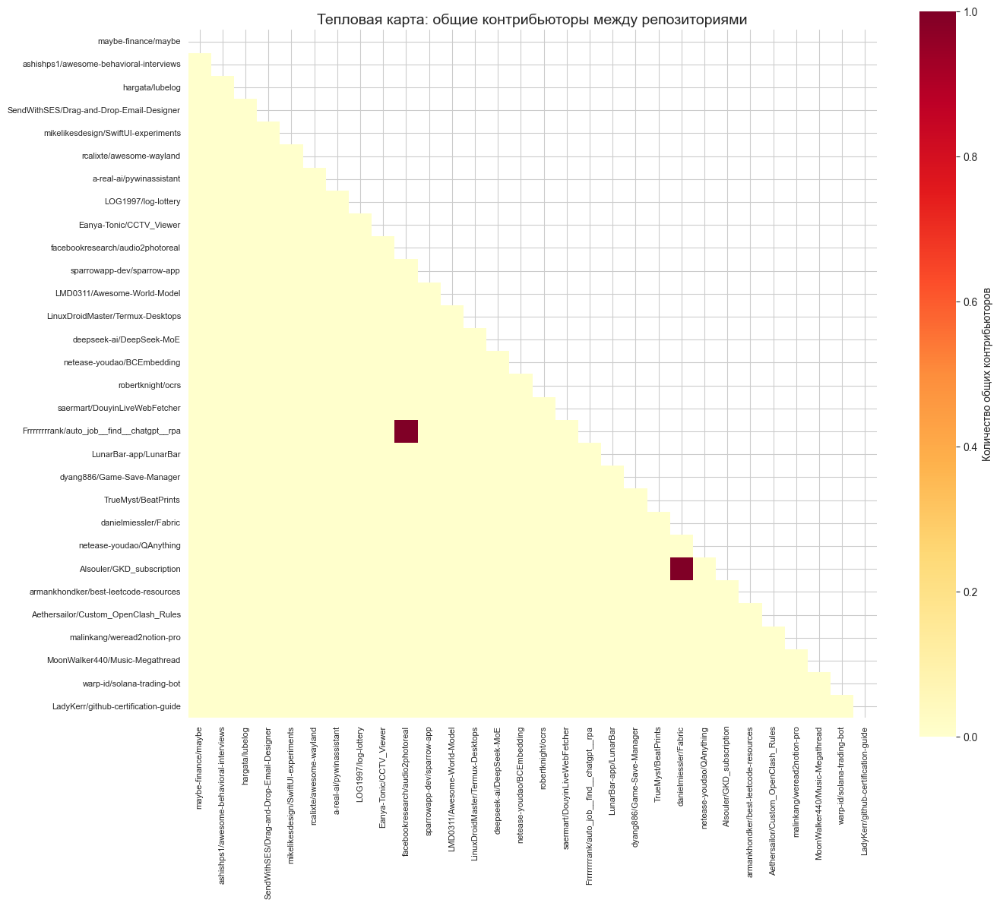


ТОП-10 ПАР РЕПОЗИТОРИЕВ С ОБЩИМИ КОНТРИБЬЮТОРАМИ


,Репозиторий A,Репозиторий B,Общих контрибьюторов
0,facebookresearch/audio2photoreal,Frrrrrrrrank/auto_job__find__chatgpt__rpa,1
1,danielmiessler/Fabric,AIsouler/GKD_subscription,1



ТОП-20 АКТИВНЫХ ЛЮДЕЙ-КОНТРИБЬЮТОРОВ (без ботов)


,Контрибьютор,Количество проектов
0,eltociear,77
1,invalid-email-address,14
2,adrianhajdin,11
3,OxylabsOrg,10
4,AugustOxy,10
5,semantic-release-bot,9
6,octo-patch,9
7,emmanuel-ferdman,9
8,kijai,9
9,majiayu000,9



ГРАФ КОЛЛАБОРАЦИЙ (только сильные связи)


NameError: name 'nx' is not defined

In [26]:
from sklearn.metrics.pairwise import cosine_similarity
from scipy.sparse import lil_matrix


def extract_contributors(df):

    contributors_by_repo = {}
    
    for idx, row in df.iterrows():
        commits = row.get('recent_commits')
        if not commits or not isinstance(commits, list):
            continue
        
        authors = set()
        for commit in commits:
            if isinstance(commit, dict):
                author = commit.get('author')
                if author and isinstance(author, str):
                    authors.add(author)
        
        if authors:
            repo_id = row.get('github_id', idx)
            contributors_by_repo[repo_id] = list(authors)
    
    print(f"Репозиториев с данными: {len(contributors_by_repo)}")
    return contributors_by_repo

def get_repo_info(df):
    repo_names = {}
    repo_stars = {}
    
    for _, row in df.iterrows():
        repo_id = row.get('github_id')
        if repo_id:
            repo_names[repo_id] = row.get('full_name', repo_id)
            repo_stars[repo_id] = row.get('stargazers_count', 0)
    
    return repo_names, repo_stars

def build_similarity_matrix(contributors_by_repo, repo_names, top_n=30):

    repo_star_list = [(repo, repo_names.get(repo, repo)) for repo in contributors_by_repo.keys()]
    repo_star_list.sort(key=lambda x: x[1] if isinstance(x[1], int) else 0, reverse=True)
    top_repos = [repo for repo, _ in repo_star_list[:top_n]]
    
    all_contributors = set()
    for repo in top_repos:
        all_contributors.update(contributors_by_repo.get(repo, []))
    
    contributor_to_idx = {c: i for i, c in enumerate(all_contributors)}
    
    matrix = np.zeros((len(top_repos), len(all_contributors)))
    for i, repo in enumerate(top_repos):
        for contributor in contributors_by_repo.get(repo, []):
            j = contributor_to_idx.get(contributor)
            if j is not None:
                matrix[i, j] = 1
    
    similarity = np.dot(matrix, matrix.T)
    
    return similarity, top_repos, matrix


def plot_heatmap(similarity, top_repos, repo_names):

    labels = [repo_names.get(repo, str(repo)[:30]) for repo in top_repos]
    
    plt.figure(figsize=(14, 12))
    

    mask = np.triu(np.ones_like(similarity, dtype=bool))

    sns.heatmap(similarity, 
                mask=mask,
                cmap='YlOrRd',
                xticklabels=labels,
                yticklabels=labels,
                square=True,
                annot=False,  
                cbar_kws={'label': 'Количество общих контрибьюторов'})
    
    plt.title('Тепловая карта: общие контрибьюторы между репозиториями', fontsize=14)
    plt.xticks(rotation=90, fontsize=8)
    plt.yticks(fontsize=8)
    plt.tight_layout()
    plt.show()


def get_top_connections(similarity, top_repos, repo_names):
    
    connections = []
    n = len(top_repos)
    
    for i in range(n):
        for j in range(i+1, n):
            weight = similarity[i, j]
            if weight > 0:
                connections.append({
                    'Репозиторий A': repo_names.get(top_repos[i], str(top_repos[i])),
                    'Репозиторий B': repo_names.get(top_repos[j], str(top_repos[j])),
                    'Общих контрибьюторов': int(weight)
                })
    
    connections.sort(key=lambda x: x['Общих контрибьюторов'], reverse=True)
    if connections:
        df = pd.DataFrame(connections)
        return df.head(10)
    else:
        return pd.DataFrame() 


def get_top_contributors(contributors_by_repo, top_n=20):
    
    # Считаем участие
    contributor_counts = Counter()
    for contributors in contributors_by_repo.values():
        contributor_counts.update(contributors)
    
    # Фильтруем ботов
    bots_keywords = ['[bot]', 'Copilot', 'claude', 'actions-user', 'renovate', 
                     'dependabot', 'pre-commit', 'vercel', 'github-actions']
    
    human_counts = {c: count for c, count in contributor_counts.items() 
                    if not any(bot.lower() in c.lower() for bot in bots_keywords)}
    
    top_humans = sorted(human_counts.items(), key=lambda x: x[1], reverse=True)[:top_n]
    
    df_contributors = pd.DataFrame(top_humans, columns=['Контрибьютор', 'Количество проектов'])
    return df_contributors


def plot_clean_graph(similarity, top_repos, repo_names, min_shared=3, max_nodes=25):
    repo_stars = [(repo, repo_names.get(repo, repo)) for repo in top_repos]
    repo_stars.sort(key=lambda x: x[1] if isinstance(x[1], int) else 0, reverse=True)
    top_n_repos = [repo for repo, _ in repo_stars[:max_nodes]]
    
    G = nx.Graph()
    
    n = len(top_n_repos)
    for i, repo in enumerate(top_n_repos):
        G.add_node(repo, name=repo_names.get(repo, str(repo))[:25])
    

    for i in range(n):
        for j in range(i+1, n):
            weight = similarity[top_repos.index(top_n_repos[i]), top_repos.index(top_n_repos[j])]
            if weight >= min_shared:
                G.add_edge(top_n_repos[i], top_n_repos[j], weight=weight)

    G.remove_nodes_from([n for n in G.nodes() if G.degree(n) == 0])
    
    if G.number_of_nodes() == 0:
        print(f"Нет связей с >= {min_shared} общими контрибьюторами")
        return
    
    plt.figure(figsize=(14, 12))

    pos = nx.spring_layout(G, k=1.2, iterations=50, seed=42)
    
    node_sizes = [G.degree(node) * 300 + 500 for node in G.nodes()]
    

    node_colors = [G.degree(node) for node in G.nodes()]
    

    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, 
                           cmap='viridis', alpha=0.8)
    nx.draw_networkx_edges(G, pos, alpha=0.4, width=1.0)

    labels = {node: G.nodes[node]['name'] for node in G.nodes()}
    nx.draw_networkx_labels(G, pos, labels, font_size=7)
    
    plt.title(f'Граф коллабораций репозиториев (связи: ≥ {min_shared} общих контрибьюторов)', fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    print(f"Узлов: {G.number_of_nodes()}, Ребер: {G.number_of_edges()}")
    
    return G


print("-"*70)
print("СЕТЕВОЙ АНАЛИЗ КОЛЛАБОРАЦИЙ")


contributors_by_repo = extract_contributors(df)
repo_names, repo_stars = get_repo_info(df)

similarity, top_repos, matrix = build_similarity_matrix(contributors_by_repo, repo_names, top_n=30)

print("\nТЕПЛОВАЯ КАРТА СВЯЗЕЙ")
plot_heatmap(similarity, top_repos, repo_names)

print("\nТОП-10 ПАР РЕПОЗИТОРИЕВ С ОБЩИМИ КОНТРИБЬЮТОРАМИ")
top_connections_df = get_top_connections(similarity, top_repos, repo_names)
if not top_connections_df.empty:
    from IPython.display import display
    display(top_connections_df)
else:
    print("Связей не найдено")

print("\nТОП-20 АКТИВНЫХ ЛЮДЕЙ-КОНТРИБЬЮТОРОВ (без ботов)")
top_contributors_df = get_top_contributors(contributors_by_repo, top_n=20)
display(top_contributors_df)

print("\nГРАФ КОЛЛАБОРАЦИЙ (только сильные связи)")
plot_clean_graph(similarity, top_repos, repo_names, min_shared=3, max_nodes=25)

# Попытка кластеризации по типу активности

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.decomposition import PCA


def extract_commit_features(df):
    features = pd.DataFrame(index=df.index)
    

    features['total_commits'] = df['commit_stats'].apply(
        lambda x: x.get('total_count', 0) if isinstance(x, dict) else 0
    )
    features['commits_30d'] = df['commit_stats'].apply(
        lambda x: x.get('commits_30d', 0) if isinstance(x, dict) else 0
    )
    features['commits_90d'] = df['commit_stats'].apply(
        lambda x: x.get('commits_90d', 0) if isinstance(x, dict) else 0
    )
    features['unique_authors_recent'] = df['commit_stats'].apply(
        lambda x: x.get('unique_authors_recent', 0) if isinstance(x, dict) else 0
    )
    
    intervals = []
    recent_counts = []
    
    for idx, row in df.iterrows():
        commits = row.get('recent_commits', [])
        if not isinstance(commits, list) or len(commits) < 2:
            intervals.append(0)
            recent_counts.append(0)
            continue
        
        dates = []
        for commit in commits:
            if isinstance(commit, dict):
                date_str = commit.get('date')
                if date_str:
                    try:
                        from datetime import datetime
                        dt = datetime.fromisoformat(date_str.replace('Z', '+00:00'))
                        dates.append(dt)
                    except:
                        pass
        
        if len(dates) < 2:
            intervals.append(0)
            recent_counts.append(len(dates))
            continue
        
        intervals_list = [(dates[i+1] - dates[i]).total_seconds() / 3600 
                          for i in range(len(dates)-1)]
        intervals.append(np.mean(intervals_list))
        recent_counts.append(len(dates))
    
    features['avg_interval_hours'] = intervals
    features['recent_commits_count'] = recent_counts
    

    features['commits_per_day'] = features['total_commits'] / (df['repo_age_days'] + 1)
    features['recency_ratio'] = features['commits_90d'] / (features['total_commits'] + 1)
    features['authors_per_commit'] = features['unique_authors_recent'] / (features['recent_commits_count'] + 1)
    features['regularity_score'] = 1 / (features['avg_interval_hours'] + 1)

    mask = (features['total_commits'] > 0) & (features['recent_commits_count'] > 0)
    
    return features[mask]



def find_optimal_k(features, max_k=10):

    cluster_features = ['commits_per_day', 'regularity_score', 
                        'recency_ratio', 'authors_per_commit']
    
    X = features[cluster_features].fillna(0).copy()
    
    # Масштабирование
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    k_range = range(2, max_k + 1)
    inertias = []
    silhouette_scores = []
    calinski_scores = []
    
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(X_scaled)
        
        inertias.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(X_scaled, labels))
        calinski_scores.append(calinski_harabasz_score(X_scaled, labels))
        
        print(f"k={k}: Silhouette = {silhouette_scores[-1]:.4f}, "
              f"Calinski-Harabasz = {calinski_scores[-1]:.0f}")
    
    best_k_silhouette = k_range[np.argmax(silhouette_scores)]
    best_k_calinski = k_range[np.argmax(calinski_scores)]
    
    print(f"\nОптимальное k по силуэту: {best_k_silhouette}")
    print(f"Оптимальное k по Calinski-Harabasz: {best_k_calinski}")
    
   
    
    return best_k_silhouette, X_scaled, scaler


def cluster_with_optimal_k(features, X_scaled, n_clusters, scaler):

    
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    features['cluster'] = kmeans.fit_predict(X_scaled)

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)
    features['pca_x'] = X_pca[:, 0]
    features['pca_y'] = X_pca[:, 1]
    
    print(f"\n{'-'*60}")
    print(f"КЛАСТЕРИЗАЦИЯ С K = {n_clusters}")

    
    for c in range(n_clusters):
        size = (features['cluster'] == c).sum()
        print(f"\nКластер {c}: {size} репозиториев ({size/len(features)*100:.1f}%)")
    
    return features, kmeans



def analyze_clusters(features, df):

    
    print(f"\n{'-'*60}")
    print("ХАРАКТЕРИСТИКИ КЛАСТЕРОВ")
    
    metrics = ['commits_per_day', 'recency_ratio', 'authors_per_commit', 'total_commits']
    cluster_stats = features.groupby('cluster')[metrics].agg(['median', 'mean']).round(3)
    print(cluster_stats.to_string())
    
    # Связь с популярностью
    features['stargazers_count'] = df.loc[features.index, 'stargazers_count'].fillna(0)
    
    print(f"\n{'-'*60}")
    print("СВЯЗЬ С ПОПУЛЯРНОСТЬЮ")

    
    popularity_stats = features.groupby('cluster')['stargazers_count'].agg(['median', 'mean', 'count']).round(0)
    print(popularity_stats.to_string())
    

    from scipy.stats import f_oneway, kruskal
    
    groups = [features[features['cluster'] == c]['stargazers_count'].values 
              for c in sorted(features['cluster'].unique())]
    
    f_stat, p_anova = f_oneway(*groups)
    h_stat, p_kw = kruskal(*groups)
    
    print(f"\nСтатистическая значимость различий в популярности:")
    print(f"   ANOVA: F = {f_stat:.3f}, p = {p_anova:.6f}")
    print(f"   Kruskal-Wallis: H = {h_stat:.3f}, p = {p_kw:.6f}")
    print(f"   Кластеры различны по популярности: {'ДА' if p_anova < 0.05 else 'НЕТ'}")
    
    return features




# Извлекаем признаки
features = extract_commit_features(df)
print(f"\nРепозиториев с данными о коммитах: {len(features)}")

# Находим оптимальное k
best_k, X_scaled, scaler = find_optimal_k(features, max_k=10)

# Кластеризация с оптимальным k
features, kmeans = cluster_with_optimal_k(features, X_scaled, best_k, scaler)

# Анализ
features = analyze_clusters(features, df)



Репозиториев с данными о коммитах: 2631
k=2: Silhouette = 0.9702, Calinski-Harabasz = 863
k=3: Silhouette = 0.9682, Calinski-Harabasz = 1131
k=4: Silhouette = 0.4856, Calinski-Harabasz = 1476
k=5: Silhouette = 0.5145, Calinski-Harabasz = 2211
k=6: Silhouette = 0.5158, Calinski-Harabasz = 2481
k=7: Silhouette = 0.4674, Calinski-Harabasz = 2827
k=8: Silhouette = 0.4342, Calinski-Harabasz = 2964
k=9: Silhouette = 0.4031, Calinski-Harabasz = 3172
k=10: Silhouette = 0.4170, Calinski-Harabasz = 3242

Оптимальное k по силуэту: 2
Оптимальное k по Calinski-Harabasz: 10

------------------------------------------------------------
КЛАСТЕРИЗАЦИЯ С K = 2

Кластер 0: 2630 репозиториев (100.0%)

Кластер 1: 1 репозиториев (0.0%)

------------------------------------------------------------
ХАРАКТЕРИСТИКИ КЛАСТЕРОВ
        commits_per_day        recency_ratio        authors_per_commit        total_commits          
                 median   mean        median   mean             median   mean        m

ГЛУБОКАЯ ПРОВЕРКА ГИПОТЕЗЫ: ВЛИЯНИЕ SECION CONTRIBUTING НА PR

1. АНАЛИЗ ВЛИЯНИЯ НА TOTAL PR COUNT
--------------------------------------------------
Репозитории с секцией Contributing: n=909
  Среднее PR: 500.4
  Медиана PR: 126.0
  Максимум PR: 11153

Репозитории без секции Contributing: n=1737
  Среднее PR: 148.1
  Медиана PR: 22.0
  Максимум PR: 17425

Mann-Whitney U test: p-value = 0.000000
РЕЗУЛЬТАТ: Разница статистически значима! Contributing-секция влияет на количество PR.

2. КОРРЕЛЯЦИЯ ПРИЗНАКОВ README С PR И ЗВЕЗДАМИ
--------------------------------------------------

Корреляция с total_pr_count:
  has_contributing         : 0.2048
  contributing_mentions    : 0.2567
  has_social_links         : 0.1525
  external_links_count     : 0.0211
  readme_length            : 0.0169
  readme_has_code          : -0.0108

Корреляция с stargazers_count:
  has_contributing         : 0.0893
  contributing_mentions    : 0.1796
  has_social_links         : 0.1349
  external_links_count     :

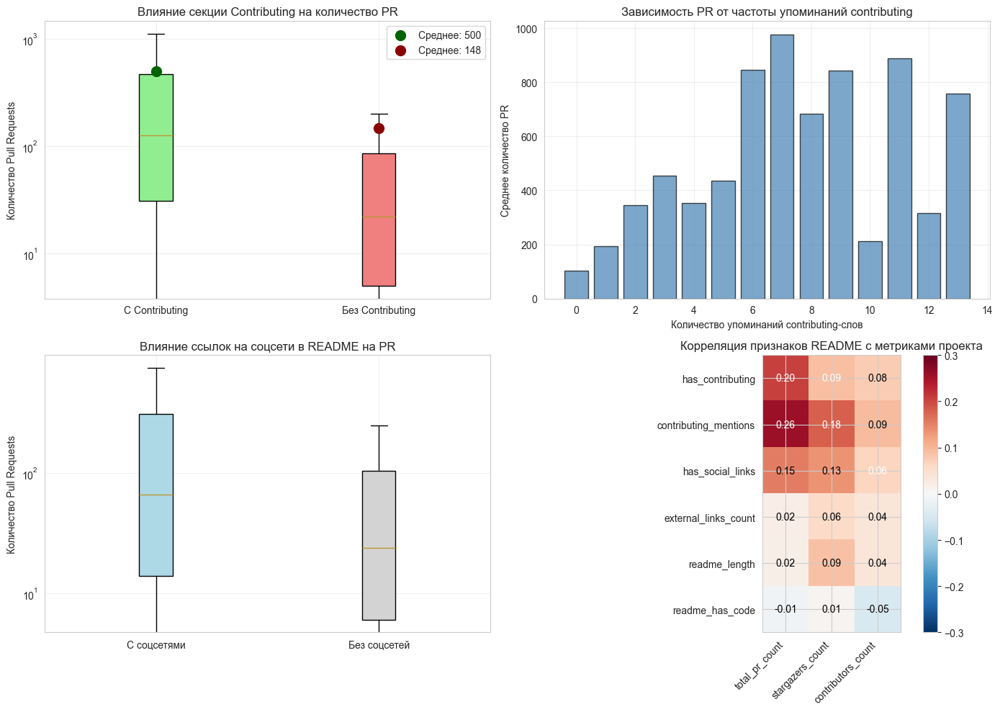


3. РЕГРЕССИЯ С ДОБАВЛЕНИЕМ ПРИЗНАКОВ README
--------------------------------------------------
R² с новыми признаками: 0.3610

Топ-10 важных признаков (включая новые):
   closed_issues_count                : 0.1711
   open_pr_count                      : 0.1315
   contributors_count                 : 0.1195
   open_issues_count                  : 0.0864
   size_mb                            : 0.0695
   external_links_count               : 0.0639
   readme_length                      : 0.0624
   closed_pr_count                    : 0.0602
   total_commits                      : 0.0602
   repo_age_days                      : 0.0574

R² без новых признаков: 0.3434
Улучшение: +0.0176


In [32]:
import re
# ДОПОЛНИТЕЛЬНЫЙ АНАЛИЗ: ГИПОТЕЗА О CONTRIBUTING
print("="*70)
print("ГЛУБОКАЯ ПРОВЕРКА ГИПОТЕЗЫ: ВЛИЯНИЕ SECION CONTRIBUTING НА PR")
print("="*70)

# Создаем признаки на основе README
df_contrib = df.copy()

# 1. Бинарный признак: есть ли в README раздел Contributing
contributing_keywords = [
    'contributing', 'pull request', 'guidelines', 'contribute',
    'how to contribute', 'contributor', 'contribution guidelines'
]

def has_contributing_section(text):
    if not isinstance(text, str):
        return 0
    text_lower = text.lower()
    # Ищем заголовки раздела Contributing
    patterns = [
        r'#+\s*contributing',
        r'##\s*contributing',
        r'#+\s*getting involved',
        r'#+\s*how to contribute',
        r'\[contributing\]',
    ]
    for pattern in patterns:
        if re.search(pattern, text_lower):
            return 1
    
    # Дополнительная проверка на ключевые слова в начале строки
    lines = text_lower.split('\n')
    for i, line in enumerate(lines):
        if any(kw in line for kw in ['contributing', 'contribute']):
            # Проверяем, что это может быть заголовок
            if line.strip().startswith('#') or (i > 0 and lines[i-1].strip() == ''):
                return 1
    return 0

df_contrib['has_contributing'] = df_contrib['readme'].apply(has_contributing_section)

# 2. Количество упоминаний contributing-слов
def contributing_mentions(text):
    if not isinstance(text, str):
        return 0
    text_lower = text.lower()
    count = 0
    for kw in contributing_keywords:
        count += text_lower.count(kw)
    return min(count, 50)  # ограничиваем, чтобы не было выбросов

df_contrib['contributing_mentions'] = df_contrib['readme'].apply(contributing_mentions)

# 3. Наличие ссылок на соцсети в README
social_patterns = [
    r'twitter\.com', r'x\.com', r'linkedin', r'discord', 
    r'slack', r'reddit\.com', r'youtube', r'medium\.com',
    r'discourse', r'gitter', r'telegram', r'mastodon'
]

def has_social_links(text):
    if not isinstance(text, str):
        return 0
    text_lower = text.lower()
    for pattern in social_patterns:
        if re.search(pattern, text_lower):
            return 1
    return 0

df_contrib['has_social_links'] = df_contrib['readme'].apply(has_social_links)

# 4. Подсчет внешних ссылок (примерно)
def count_external_links(text):
    if not isinstance(text, str):
        return 0
    # Простой подсчет http/https ссылок
    links = re.findall(r'https?://[^\s<>"|]+', text)
    return len(links)

df_contrib['external_links_count'] = df_contrib['readme'].apply(count_external_links)

# ============================================================
# Влияние на количество Pull Requests
# ============================================================

print("\n1. АНАЛИЗ ВЛИЯНИЯ НА TOTAL PR COUNT")
print("-" * 50)

# Сравнение групп: с contributing vs без
has_contrib = df_contrib[df_contrib['has_contributing'] == 1]['total_pr_count']
no_contrib = df_contrib[df_contrib['has_contributing'] == 0]['total_pr_count']

print(f"Репозитории с секцией Contributing: n={len(has_contrib)}")
print(f"  Среднее PR: {has_contrib.mean():.1f}")
print(f"  Медиана PR: {has_contrib.median():.1f}")
print(f"  Максимум PR: {has_contrib.max():.0f}")

print(f"\nРепозитории без секции Contributing: n={len(no_contrib)}")
print(f"  Среднее PR: {no_contrib.mean():.1f}")
print(f"  Медиана PR: {no_contrib.median():.1f}")
print(f"  Максимум PR: {no_contrib.max():.0f}")

# Статистический тест
from scipy.stats import mannwhitneyu

stat, p_value = mannwhitneyu(has_contrib, no_contrib, alternative='two-sided')
print(f"\nMann-Whitney U test: p-value = {p_value:.6f}")
if p_value < 0.05:
    print("РЕЗУЛЬТАТ: Разница статистически значима! Contributing-секция влияет на количество PR.")
else:
    print("РЕЗУЛЬТАТ: Статистически значимой разницы нет.")

# ============================================================
# Корреляционный анализ
# ============================================================

print("\n2. КОРРЕЛЯЦИЯ ПРИЗНАКОВ README С PR И ЗВЕЗДАМИ")
print("-" * 50)

metrics = ['total_pr_count', 'stargazers_count', 'contributors_count']
features = ['has_contributing', 'contributing_mentions', 'has_social_links', 
            'external_links_count', 'readme_length', 'readme_has_code']

corr_matrix = df_contrib[features + metrics].corr()

print("\nКорреляция с total_pr_count:")
for f in features:
    corr = corr_matrix.loc[f, 'total_pr_count']
    print(f"  {f:25s}: {corr:.4f}")

print("\nКорреляция с stargazers_count:")
for f in features:
    corr = corr_matrix.loc[f, 'stargazers_count']
    print(f"  {f:25s}: {corr:.4f}")

# ============================================================
# Визуализация
# ============================================================

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# График 1: Boxplot PR по группам
ax1 = axes[0, 0]
data_to_plot = [has_contrib.values, no_contrib.values]
bp = ax1.boxplot(data_to_plot, labels=['С Contributing', 'Без Contributing'], 
                  patch_artist=True, showfliers=False)
bp['boxes'][0].set_facecolor('lightgreen')
bp['boxes'][1].set_facecolor('lightcoral')
ax1.set_ylabel('Количество Pull Requests')
ax1.set_title('Влияние секции Contributing на количество PR')
ax1.set_yscale('log')
ax1.grid(True, alpha=0.3)

# Добавим средние значения
ax1.scatter([1], [has_contrib.mean()], color='darkgreen', s=100, zorder=5, label=f'Среднее: {has_contrib.mean():.0f}')
ax1.scatter([2], [no_contrib.mean()], color='darkred', s=100, zorder=5, label=f'Среднее: {no_contrib.mean():.0f}')
ax1.legend()

# График 2: Зависимость PR от количества упоминаний contributing
ax2 = axes[0, 1]
# Группируем по количеству упоминаний
mention_groups = df_contrib.groupby('contributing_mentions')['total_pr_count'].agg(['mean', 'count', 'std']).reset_index()
mention_groups = mention_groups[mention_groups['count'] > 5]  # только группы с достаточным количеством

ax2.bar(mention_groups['contributing_mentions'], mention_groups['mean'], 
        color='steelblue', alpha=0.7, edgecolor='black')
ax2.set_xlabel('Количество упоминаний contributing-слов')
ax2.set_ylabel('Среднее количество PR')
ax2.set_title('Зависимость PR от частоты упоминаний contributing')
ax2.grid(True, alpha=0.3)

# График 3: Влияние соцсетей
ax3 = axes[1, 0]
has_social = df_contrib[df_contrib['has_social_links'] == 1]['total_pr_count']
no_social = df_contrib[df_contrib['has_social_links'] == 0]['total_pr_count']

data_social = [has_social.values, no_social.values]
bp2 = ax3.boxplot(data_social, labels=['С соцсетями', 'Без соцсетей'], 
                   patch_artist=True, showfliers=False)
bp2['boxes'][0].set_facecolor('lightblue')
bp2['boxes'][1].set_facecolor('lightgray')
ax3.set_ylabel('Количество Pull Requests')
ax3.set_title('Влияние ссылок на соцсети в README на PR')
ax3.set_yscale('log')
ax3.grid(True, alpha=0.3)

# График 4: Тепловая карта корреляций
ax4 = axes[1, 1]
features_display = ['has_contributing', 'contributing_mentions', 'has_social_links', 
                    'external_links_count', 'readme_length', 'readme_has_code']
metrics_display = ['total_pr_count', 'stargazers_count', 'contributors_count']

corr_subset = df_contrib[features_display + metrics_display].corr()
im = ax4.imshow(corr_subset.loc[features_display, metrics_display], cmap='RdBu_r', vmin=-0.3, vmax=0.3)
ax4.set_xticks(range(len(metrics_display)))
ax4.set_xticklabels(metrics_display, rotation=45, ha='right')
ax4.set_yticks(range(len(features_display)))
ax4.set_yticklabels(features_display)
ax4.set_title('Корреляция признаков README с метриками проекта')

for i in range(len(features_display)):
    for j in range(len(metrics_display)):
        text = ax4.text(j, i, f'{corr_subset.loc[features_display[i], metrics_display[j]]:.2f}',
                       ha="center", va="center", color="black" if abs(corr_subset.iloc[i, j]) < 0.5 else "white")

plt.colorbar(im, ax=ax4)
plt.tight_layout()
plt.savefig('contributing_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================
# Регрессия с новыми признаками
# ============================================================

print("\n3. РЕГРЕССИЯ С ДОБАВЛЕНИЕМ ПРИЗНАКОВ README")
print("-" * 50)

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Подготовка данных
reg_features = [
    'releases_count', 'open_issues_count', 'closed_issues_count',
    'open_pr_count', 'closed_pr_count', 'contributors_count', 'total_commits',
    'repo_age_days', 'has_github_actions', 'topics_count', 'size_mb',
    'readme_length', 'readme_has_code', 'has_contributing', 
    'contributing_mentions', 'has_social_links', 'external_links_count'
]

# Логарифмическая трансформация
df_reg_contrib = df_contrib.copy()
df_reg_contrib['popularity'] = np.log1p(df_reg_contrib['stargazers_count'])

X = df_reg_contrib[reg_features].fillna(0)
y = df_reg_contrib['popularity']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Модель
rf_contrib = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf_contrib.fit(X_train, y_train)
y_pred = rf_contrib.predict(X_test)

print(f"R² с новыми признаками: {r2_score(y_test, y_pred):.4f}")

# Важность признаков
importances = rf_contrib.feature_importances_
importance_df = pd.DataFrame({'feature': reg_features, 'importance': importances})
importance_df = importance_df.sort_values('importance', ascending=False)

print("\nТоп-10 важных признаков (включая новые):")
for i, row in importance_df.head(10).iterrows():
    print(f"   {row['feature'][:35]:<35}: {row['importance']:.4f}")

# Сравнение с моделью без новых признаков
old_features = [f for f in reg_features if f not in ['has_contributing', 'contributing_mentions', 'has_social_links', 'external_links_count']]
X_old = df_reg_contrib[old_features].fillna(0)
X_train_old, X_test_old, _, _ = train_test_split(X_old, y, test_size=0.2, random_state=42)
rf_old = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf_old.fit(X_train_old, y_train)
y_pred_old = rf_old.predict(X_test_old)

print(f"\nR² без новых признаков: {r2_score(y_test, y_pred_old):.4f}")
print(f"Улучшение: {r2_score(y_test, y_pred) - r2_score(y_test, y_pred_old):+.4f}")



1. Топ 15 языков по количеству репозиториев:
primary_language
Python              955
TypeScript          598
JavaScript          178
Shell               152
Jupyter Notebook    117
C++                 110
HTML                 91
Makefile             28
CSS                  25
Dockerfile           24

2. Статистика по топ-то языкам:
                  count  stars_mean  stars_median  stars_std  pop_mean  pop_median  forks_mean  forks_median  contributors_mean  contributors_median
primary_language                                                                                                                                    
Python              955     5050.98        2009.0   10063.61      7.91        7.61      561.71         209.0              25.45                  9.0
TypeScript          598     5274.98        2230.0    9084.13      8.00        7.71      583.49         220.0              44.63                 13.0
JavaScript          178     3708.16        1895.0    5848.84      7.

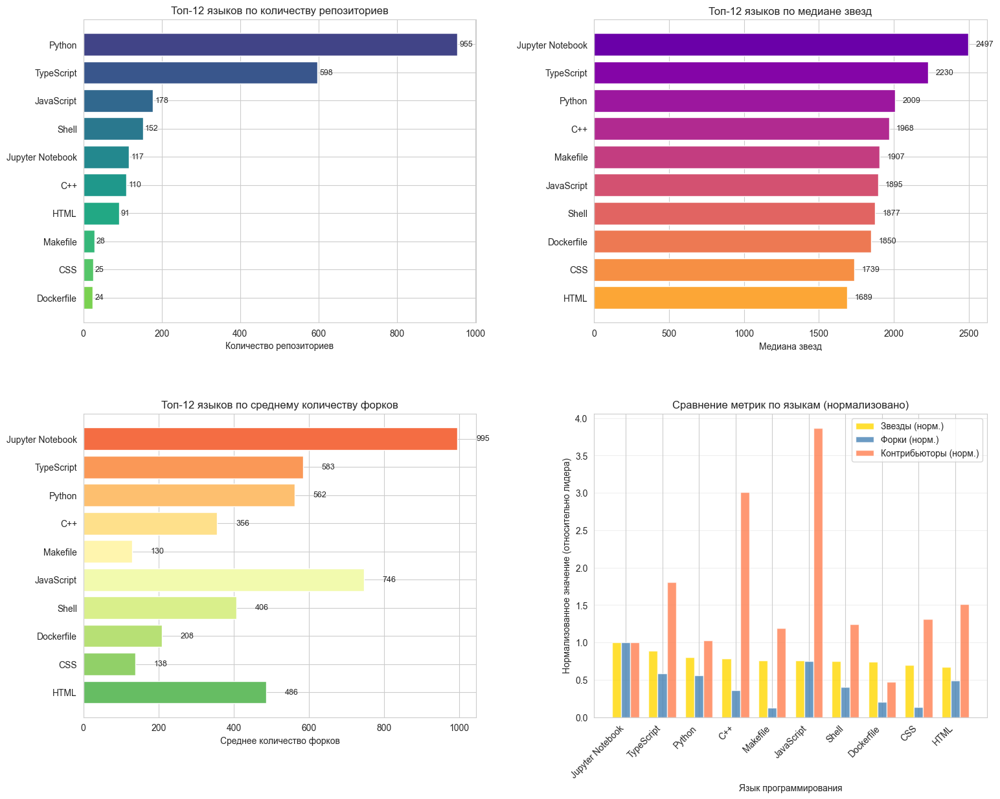


------------------------------------------------------------
языки в кластерах


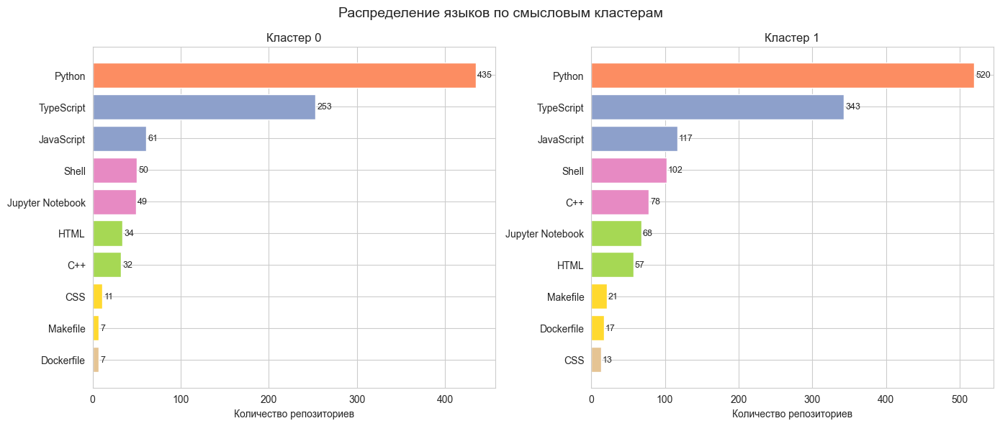


Сравнение топ-5 языков в каждом кластере:
--------------------------------------------------

КЛАСТЕР 0:
   Python              : n= 435, медиана звезд=  2269
   TypeScript          : n= 253, медиана звезд=  2430
   JavaScript          : n=  61, медиана звезд=  1903
   Shell               : n=  50, медиана звезд=  2040
   Jupyter Notebook    : n=  49, медиана звезд=  2282

КЛАСТЕР 1:
   Python              : n= 520, медиана звезд=  1862
   TypeScript          : n= 343, медиана звезд=  2106
   JavaScript          : n= 117, медиана звезд=  1844
   Shell               : n= 102, медиана звезд=  1838
   C++                 : n=  78, медиана звезд=  2016


In [29]:

df_lang = df.copy()
df_lang['popularity'] = np.log1p(df_lang['stargazers_count'])


df_lang = df_lang[df_lang['primary_language'] != 'Unknown']
df_lang = df_lang[df_lang['primary_language'].notna()]


lang_counts = df_lang['primary_language'].value_counts().head(15)
print("\n1. Топ 15 языков по количеству репозиториев:")
print(lang_counts.to_string())


lang_stats = df_lang.groupby('primary_language').agg({
    'stargazers_count': ['count', 'mean', 'median', 'std'],
    'popularity': ['mean', 'median'],
    'forks_count': ['mean', 'median'],
    'contributors_count': ['mean', 'median']
}).round(2)


lang_stats.columns = ['count', 'stars_mean', 'stars_median', 'stars_std', 
                       'pop_mean', 'pop_median',
                       'forks_mean', 'forks_median',
                       'contributors_mean', 'contributors_median']

lang_stats = lang_stats.sort_values('count', ascending=False)

print("\n2. Статистика по топ-то языкам:")
print(lang_stats.head(10).to_string())

lang_stats_filtered = lang_stats[lang_stats['count'] >= 20].copy()
lang_stats_filtered = lang_stats_filtered.sort_values('stars_median', ascending=False)

print("\n3. Топ-10 языков по медиане звезд:")
for i, (lang, row) in enumerate(lang_stats_filtered.head(10).iterrows(), 1):
    print(f"   {i:2d}. {lang:20s}: медиана={row['stars_median']:8.0f}, "
          f"среднее={row['stars_mean']:8.0f}, n={row['count']:4.0f}")

fig = plt.figure(figsize=(18, 14))
gs = fig.add_gridspec(2, 2, hspace=0.3, wspace=0.3)


ax1 = fig.add_subplot(gs[0, 0])
top_langs = lang_counts.head(12)
colors = plt.cm.viridis(np.linspace(0.2, 0.8, len(top_langs)))
bars1 = ax1.barh(range(len(top_langs)), top_langs.values, color=colors)
ax1.set_yticks(range(len(top_langs)))
ax1.set_yticklabels(top_langs.index)
ax1.set_xlabel('Количество репозиториев')
ax1.set_title('Топ-12 языков по количеству репозиториев')
ax1.invert_yaxis()

for i, (bar, val) in enumerate(zip(bars1, top_langs.values)):
    ax1.text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2, 
             f'{val}', va='center', fontsize=9)


ax2 = fig.add_subplot(gs[0, 1])
langs_for_plot = lang_stats_filtered.head(12).index.tolist()
stars_medians = [lang_stats_filtered.loc[lang, 'stars_median'] for lang in langs_for_plot]

colors2 = plt.cm.plasma(np.linspace(0.2, 0.8, len(langs_for_plot)))
bars2 = ax2.barh(range(len(langs_for_plot)), stars_medians, color=colors2)
ax2.set_yticks(range(len(langs_for_plot)))
ax2.set_yticklabels(langs_for_plot)
ax2.set_xlabel('Медиана звезд')
ax2.set_title('Топ-12 языков по медиане звезд')
ax2.invert_yaxis()

for i, (bar, val) in enumerate(zip(bars2, stars_medians)):
    ax2.text(bar.get_width() + 50, bar.get_y() + bar.get_height()/2, 
             f'{val:.0f}', va='center', fontsize=9)


ax3 = fig.add_subplot(gs[1, 0])
forks_mean = [lang_stats_filtered.loc[lang, 'forks_mean'] for lang in langs_for_plot]

colors3 = plt.cm.RdYlGn(np.linspace(0.2, 0.8, len(langs_for_plot)))
bars3 = ax3.barh(range(len(langs_for_plot)), forks_mean, color=colors3)
ax3.set_yticks(range(len(langs_for_plot)))
ax3.set_yticklabels(langs_for_plot)
ax3.set_xlabel('Среднее количество форков')
ax3.set_title('Топ-12 языков по среднему количеству форков')
ax3.invert_yaxis()

for i, (bar, val) in enumerate(zip(bars3, forks_mean)):
    ax3.text(bar.get_width() + 50, bar.get_y() + bar.get_height()/2, 
             f'{val:.0f}', va='center', fontsize=9)

# График 4: Сравнение метрик (нормализованное)
ax4 = fig.add_subplot(gs[1, 1])

# Нормализуем метрики для сравнения
langs_norm = langs_for_plot[:10]
stars_norm = [lang_stats_filtered.loc[lang, 'stars_median'] / lang_stats_filtered.loc[langs_for_plot[0], 'stars_median'] 
              for lang in langs_norm]
forks_norm = [lang_stats_filtered.loc[lang, 'forks_mean'] / lang_stats_filtered.loc[langs_for_plot[0], 'forks_mean'] 
              for lang in langs_norm]
contributors_norm = [lang_stats_filtered.loc[lang, 'contributors_mean'] / lang_stats_filtered.loc[langs_for_plot[0], 'contributors_mean'] 
                     for lang in langs_norm]

x = np.arange(len(langs_norm))
width = 0.25

bars4_stars = ax4.bar(x - width, stars_norm, width, label='Звезды (норм.)', color='gold', alpha=0.8)
bars4_forks = ax4.bar(x, forks_norm, width, label='Форки (норм.)', color='steelblue', alpha=0.8)
bars4_contrib = ax4.bar(x + width, contributors_norm, width, label='Контрибьюторы (норм.)', color='coral', alpha=0.8)

ax4.set_xlabel('Язык программирования')
ax4.set_ylabel('Нормализованное значение (относительно лидера)')
ax4.set_title('Сравнение метрик по языкам (нормализовано)')
ax4.set_xticks(x)
ax4.set_xticklabels(langs_norm, rotation=45, ha='right')
ax4.legend()
ax4.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

print("\n" + "-"*60)
print("языки в кластерах")

if 'cluster_semantic' in df_semantic.columns:
    df_lang['cluster_semantic'] = df_semantic['cluster_semantic']
    
    fig2, axes2 = plt.subplots(1, 2, figsize=(14, 6))
    
    for idx, cluster in enumerate([0, 1]):
        ax = axes2[idx]
        cluster_data = df_lang[df_lang['cluster_semantic'] == cluster]
        cluster_langs = cluster_data['primary_language'].value_counts().head(10)
        
        colors_cl = plt.cm.Set2(np.linspace(0.2, 0.8, len(cluster_langs)))
        bars = ax.barh(range(len(cluster_langs)), cluster_langs.values, color=colors_cl)
        ax.set_yticks(range(len(cluster_langs)))
        ax.set_yticklabels(cluster_langs.index)
        ax.set_xlabel('Количество репозиториев')
        ax.set_title(f'Кластер {cluster}')
        ax.invert_yaxis()
        
        for bar, val in zip(bars, cluster_langs.values):
            ax.text(bar.get_width() + 2, bar.get_y() + bar.get_height()/2, 
                    f'{val}', va='center', fontsize=9)
    
    plt.suptitle('Распределение языков по смысловым кластерам', fontsize=14)
    plt.tight_layout()
    plt.show()
    

    print("\nСравнение топ-5 языков в каждом кластере:")
    print("-" * 50)
    
    for cluster in [0, 1]:
        cluster_data = df_lang[df_lang['cluster_semantic'] == cluster]
        print(f"\nКЛАСТЕР {cluster}:")
        for lang in cluster_data['primary_language'].value_counts().head(5).index:
            lang_data = cluster_data[cluster_data['primary_language'] == lang]
            median_stars = lang_data['stargazers_count'].median()
            count = len(lang_data)
            print(f"   {lang:20s}: n={count:4d}, медиана звезд={median_stars:6.0f}")



top_by_count = lang_counts.head(3).index.tolist()
top_by_stars = lang_stats_filtered.head(3).index.tolist()
top_by_forks = lang_stats_filtered.sort_values('forks_mean', ascending=False).head(3).index.tolist()

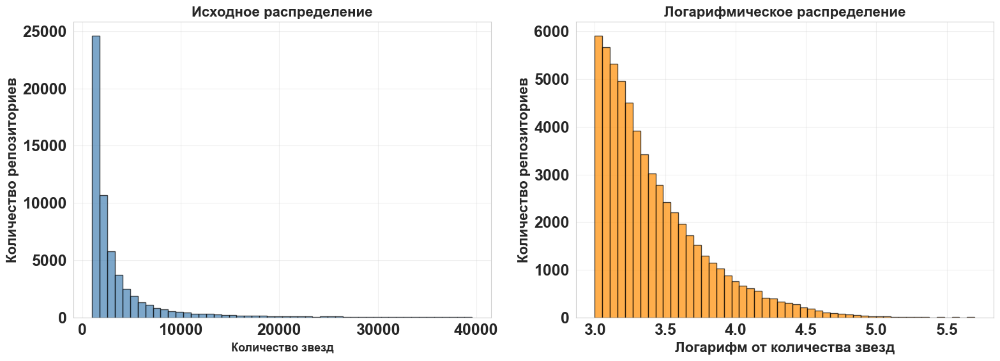

Медиана: 2053 шт.
Среднее: 4509 шт.
Коэффициент асимметрии (skewness): 16.13


In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plt.rcParams['font.size'] = 18
plt.rcParams['font.weight'] = 'bold'

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# График 1: исходное распределение (с обрезкой по 99-му перцентилю)
stars = df['stargazers_count']
stars_trimmed = stars[stars < stars.quantile(0.99)]

axes[0].hist(stars_trimmed, bins=50, color='steelblue', edgecolor='black', alpha=0.7)
axes[0].set_xlabel("Количество звезд", fontsize=13)
axes[0].set_ylabel('Количество репозиториев', fontsize=16)
axes[0].set_title('Исходное распределение', fontsize=16)
axes[0].grid(True, alpha=0.3)

# График 2: логарифмическое распределение
log_stars = np.log10(1 + stars)
axes[1].hist(log_stars, bins=50, color='darkorange', edgecolor='black', alpha=0.7)
axes[1].set_xlabel('Логарифм от количества звезд', fontsize=16)
axes[1].set_ylabel('Количество репозиториев', fontsize=16)
axes[1].set_title('Логарифмическое распределение', fontsize=16)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Статистики для слайда
print(f"Медиана: {stars.median():.0f} шт.")
print(f"Среднее: {stars.mean():.0f} шт.")
print(f"Коэффициент асимметрии (skewness): {stars.skew():.2f}")

In [22]:
import numpy as np
from scipy import stats

# Берём целевую переменную
stars = df['stargazers_count']

# Логарифмированная версия
log_stars = np.log10(1 + stars)

# Расчёт статистик
print("="*60)
print("ДИАГНОСТИКА РАСПРЕДЕЛЕНИЯ stargazers_count")
print("="*60)

# Исходные данные
skew_orig = stats.skew(stars)
kurt_orig = stats.kurtosis(stars)

print(f"\nИСХОДНЫЕ ДАННЫЕ:")
print(f"  Skewness: {skew_orig:.2f}")
print(f"  Kurtosis: {kurt_orig:.2f}")
print(f"  Медиана: {stars.median():.0f} шт.")
print(f"  Среднее: {stars.mean():.0f} шт.")
print(f"  Макс/медиана: {stars.max() / stars.median():.1f}x")

# Логарифмированные данные
skew_log = stats.skew(log_stars)
kurt_log = stats.kurtosis(log_stars)

print(f"\nЛОГАРИФМИРОВАННЫЕ ДАННЫЕ log10(1+stars):")
print(f"  Skewness: {skew_log:.2f}")
print(f"  Kurtosis: {kurt_log:.2f}")
print(f"  Медиана: {np.median(log_stars):.2f}")
print(f"  Среднее: {np.mean(log_stars):.2f}")

# Сравнение
print(f"\nИЗМЕНЕНИЯ ПОСЛЕ ЛОГАРИФМИРОВАНИЯ:")
print(f"  Skewness: {skew_orig:.2f} → {skew_log:.2f} (снижение на {abs(skew_log - skew_orig):.2f})")
print(f"  Kurtosis: {kurt_orig:.2f} → {kurt_log:.2f} (снижение на {abs(kurt_log - kurt_orig):.2f})")

ДИАГНОСТИКА РАСПРЕДЕЛЕНИЯ stargazers_count

ИСХОДНЫЕ ДАННЫЕ:
  Skewness: 16.13
  Kurtosis: 480.53
  Медиана: 2053 шт.
  Среднее: 4509 шт.
  Макс/медиана: 242.5x

ЛОГАРИФМИРОВАННЫЕ ДАННЫЕ log10(1+stars):
  Skewness: 1.38
  Kurtosis: 2.03
  Медиана: 3.31
  Среднее: 3.42

ИЗМЕНЕНИЯ ПОСЛЕ ЛОГАРИФМИРОВАНИЯ:
  Skewness: 16.13 → 1.38 (снижение на 14.75)
  Kurtosis: 480.53 → 2.03 (снижение на 478.51)


In [11]:
print("="*80)
print("ЗАДАЧА 3. РЕГРЕССИОННЫЙ АНАЛИЗ (лог-лог модель)")
print("="*80)

# ============================================================
# 1. ПОДГОТОВКА ДАННЫХ
# ============================================================
st = time.time()
df_reg = df.copy()

# Целевая переменная (логарифмируем)
df_reg["popularity"] = np.log1p(df_reg["stargazers_count"])

# Логарифмируем все скошенные признаки
skewed_features = ["forks_count", "subscribers_count", "closed_issues_count",
                   "total_pr_count", "contributors_count", "releases_count",
                   "size_mb", "total_commits", "readme_length"]

for feat in skewed_features:
    if feat in df_reg.columns:
        df_reg[f"{feat}_log"] = np.log1p(df_reg[feat])

# Признаки (логарифмированные + обычные)
feature_cols = [f"{feat}_log" for feat in skewed_features if f"{feat}_log" in df_reg.columns]

regular_features = ["repo_age_days", "topics_count", "open_issues_count", 
                    "open_pr_count", "closed_pr_count", "recent_pr_count", 
                    "recent_commits_count", "has_github_actions", "readme_has_code"]

feature_cols.extend([f for f in regular_features if f in df_reg.columns])

# Категориальные признаки
categorical_features = []
for cat in ["primary_language", "license_spdx_id", "owner_type"]:
    if cat in df_reg.columns:
        categorical_features.append(cat)

# Проверяем, какие признаки есть
available_features = [f for f in feature_cols if f in df_reg.columns]
print(f"\nЧисловых признаков: {len(available_features)}")
print(f"Категориальных признаков: {len(categorical_features)}")

# Формируем X и y
X = df_reg[available_features + categorical_features].copy()
y = df_reg["popularity"].copy()

# Удаляем пропуски
initial_rows = len(X)
mask = ~X.isna().any(axis=1)
X = X[mask]
y = y[mask]
print(f"Размер выборки: {len(X)} из {initial_rows} репозиториев")

# Проверка и замена бесконечностей
numeric_cols = X.select_dtypes(include=[np.number]).columns
print(f"Есть inf в числовых колонках: {np.isinf(X[numeric_cols]).any().any()}")
X[numeric_cols] = X[numeric_cols].replace([np.inf, -np.inf], np.nan)
X = X.dropna()
y = y[X.index]

# Разделение на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"Обучающая выборка: {len(X_train)}")
print(f"Тестовая выборка: {len(X_test)}")

# ============================================================
# 2. ПРЕПРОЦЕССИНГ
# ============================================================

preprocessor = ColumnTransformer([
    ("num", StandardScaler(), available_features),
    ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), categorical_features)
])

# ============================================================
# 3. МОДЕЛИ (только стабильные)
# ============================================================

models = {
    "Ridge": Ridge(alpha=1.0),
    "Lasso": Lasso(alpha=0.01, max_iter=10000),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42),
    "XGBoost": xgb.XGBRegressor(n_estimators=100, random_state=42, verbosity=0)
}

results = []

print("\n" + "="*80)
print("РЕЗУЛЬТАТЫ МОДЕЛЕЙ (R² на тестовой выборке)")
print("="*80)

for name, model in models.items():
    pipeline = Pipeline([("preprocessor", preprocessor), ("regressor", model)])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    
    model_type = "Линейная" if name in ["Ridge", "Lasso"] else "Нелинейная"
    results.append({"model": name, "type": model_type, "r2": r2})
    print(f"{name:20} ({model_type:10}): R² = {r2:.4f}")

# ============================================================
# 4. ИТОГОВАЯ ТАБЛИЦА ДЛЯ ПРЕЗЕНТАЦИИ
# ============================================================

print("\n" + "="*80)
print("ИТОГОВАЯ ТАБЛИЦА ДЛЯ ПРЕЗЕНТАЦИИ")
print("="*80)

results_df = pd.DataFrame(results)
summary = results_df[['model', 'type', 'r2']].copy()
summary['r2'] = summary['r2'].round(3)
print(summary.to_string(index=False))


# ============================================================
# 5. ЭЛАСТИЧНОСТИ (из Ridge)
# ============================================================

print("\n" + "="*80)
print("ЭЛАСТИЧНОСТИ (из Ridge, топ-5 признаков)")
print("="*80)

# Обучаем Ridge
ridge_pipeline = Pipeline([("preprocessor", preprocessor), ("regressor", Ridge(alpha=1.0))])
ridge_pipeline.fit(X_train, y_train)

# Получаем коэффициенты
preprocessor.fit(X_train)
num_features = available_features
cat_features = list(preprocessor.named_transformers_["cat"].get_feature_names_out(categorical_features))
all_features = num_features + cat_features
coefs = ridge_pipeline.named_steps["regressor"].coef_

# Собираем логарифмические признаки
log_elast = []
for i, feat in enumerate(all_features):
    if '_log' in feat and i < len(coefs):
        log_elast.append((feat.replace('_log', ''), coefs[i]))

# Сортируем по модулю коэффициента
log_elast = sorted(log_elast, key=lambda x: abs(x[1]), reverse=True)[:5]

print("Интерпретация: увеличение признака в 2 раза → рост звёзд в 2^β раза\n")
print(f"{'Признак':30} {'β (коэф.)':12} {'Рост звёзд при удвоении':35}")
print("-" * 80)
for feat, coef in log_elast:
    factor = 2 ** coef
    sign = "+" if coef > 0 else ""
    print(f"{feat:30} {sign}{coef:.3f}          → ×{factor:.2f} (+{(factor-1)*100:.0f}%)")

end = time.time()
print("Ушло времени ", end-st)
    # ============================================================
# 6. ВЫВОДЫ ДЛЯ ПРЕЗЕНТАЦИИ
# ============================================================

print("\n" + "="*80)
print("ВЫВОДЫ ДЛЯ ПРЕЗЕНТАЦИИ")
print("="*80)

linear_best = results_df[results_df['type'] == 'Линейная']['r2'].max()
nonlinear_best = results_df[results_df['type'] == 'Нелинейная']['r2'].max()
gain = nonlinear_best - linear_best


ЗАДАЧА 3. РЕГРЕССИОННЫЙ АНАЛИЗ (лог-лог модель)

Числовых признаков: 18
Категориальных признаков: 3
Размер выборки: 59029 из 59029 репозиториев
Есть inf в числовых колонках: False
Обучающая выборка: 47223
Тестовая выборка: 11806

РЕЗУЛЬТАТЫ МОДЕЛЕЙ (R² на тестовой выборке)
Ridge                (Линейная  ): R² = 0.6305
Lasso                (Линейная  ): R² = 0.6201
Random Forest        (Нелинейная): R² = 0.7232
Gradient Boosting    (Нелинейная): R² = 0.7126
XGBoost              (Нелинейная): R² = 0.7231

ИТОГОВАЯ ТАБЛИЦА ДЛЯ ПРЕЗЕНТАЦИИ
            model       type    r2
            Ridge   Линейная 0.630
            Lasso   Линейная 0.620
    Random Forest Нелинейная 0.723
Gradient Boosting Нелинейная 0.713
          XGBoost Нелинейная 0.723

ЭЛАСТИЧНОСТИ (из Ridge, топ-5 признаков)
Интерпретация: увеличение признака в 2 раза → рост звёзд в 2^β раза

Признак                        β (коэф.)    Рост звёзд при удвоении            
--------------------------------------------------------